In [1]:
%load_ext autoreload
%autoreload 2

import importlib

In [2]:
import matplotlib.pyplot as plt
import random
import numpy as np

import sys 
sys.path.append("..")

import seirsplus

from seirsplus.viral_model import ViralExtSEIRNetworkModel, VL_PARAMS
from seirsplus.sim_loops_pooled_test import SimulationRunner

import warnings
warnings.filterwarnings('ignore')

/Users/yujiazhang/anaconda3/envs/corr_pooling/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## correlated pooling

In [3]:
import copy

from seirsplus.networks import generate_demographic_contact_network, household_country_data

def generate_population(
    N, country, edge_weight, seed, distancing_scale
):

    random.seed(seed)
    np.random.seed(seed)

    demographic_graphs, individual_ageGroups, households = generate_demographic_contact_network(
                                                                N=N, demographic_data=household_country_data(country), 
                                                                distancing_scales=[distancing_scale], isolation_groups=[])
    # G = demographic_graphs['baseline']
    G = demographic_graphs[f'distancingScale{distancing_scale}']
    G_weighted = copy.deepcopy(G)
    for e in G.edges():
        if "weight" not in G[e[0]][e[1]]:
            G[e[0]][e[1]]["weight"] = edge_weight
    for e in G_weighted.edges():
        if "weight" not in G_weighted[e[0]][e[1]]:
            G_weighted[e[0]][e[1]]["weight"] = 10**10

    households_dict = {}
    for household in households:
        for node_id in household["indices"]:
            households_dict[node_id] = household["indices"]
    
    return G, G_weighted, households_dict

In [11]:
# run this if you want to see the degree distribution
G, G_weighted, households_dict = generate_population(5000, "US", 10, 0)
plt.hist([G.degree[i]-1 for i in range(5000)])
plt.title("Degree distribution") # centered at 10+1000*0.01=20, as expected

TypeError: generate_population() missing 1 required positional argument: 'distancing_scale'

In [12]:
demographic_graphs, individual_ageGroups, households = generate_demographic_contact_network(
                                                            N=1000, demographic_data=household_country_data("US"), 
                                                            distancing_scales=[100, 50, 1, 0.7], isolation_groups=[])

Generated overall age distribution:
0-9: 0.1180	(-0.0030 from target)
10-19: 0.1250	(-0.0060 from target)
20-29: 0.1380	(0.0010 from target)
30-39: 0.1420	(0.0090 from target)
40-49: 0.1350	(0.0110 from target)
50-59: 0.1280	(-0.0030 from target)
60-69: 0.1140	(-0.0010 from target)
70-79: 0.0660	(-0.0040 from target)
80+: 0.0340	(-0.0040 from target)

Generated household size distribution:
1: 0.3277	(0.0440 from target)
2: 0.3036	(-0.0415 from target)
3: 0.1614	(0.0108 from target)
4: 0.1157	(-0.0120 from target)
5: 0.0434	(-0.0144 from target)
6: 0.0265	(0.0039 from target)
7: 0.0217	(0.0092 from target)
Num households: 415
mean household size: 2.448393594

{'0-9': 118, '10-19': 125, '20-29': 138, '30-39': 142, '40-49': 135, '50-59': 128, '60-69': 114, '70-79': 66, '80+': 34}
Generating graph for 0-9...
Generating graph for 10-19...
Generating graph for 20-59...
Generating graph for 60+...


In [15]:
demographic_graphs.keys()

dict_keys(['baseline', 'distancingScale0.7'])

In [13]:
bins = np.linspace(0, 100, 11)

# for k in demographic_graphs.keys():
for k in ["baseline", "distancingScale100", "distancingScale50"]:
    plt.hist([demographic_graphs[k].degree[i]-1 for i in range(5000)], alpha=0.5, label=k, density=True, bins=bins)
plt.title("Degree distribution") # centered at 10+1000*0.01=20, as expected
plt.legend()

KeyError: 1000

In [4]:
def run_sim(
    G,
    G_weighted,
    households_dict,
    ALPHA,
    N,
    INIT_PREV,
    T,
    pooling_strategy,
    NUM_SCREENING_GROUPS,
    POOL_SIZE,
    LoD,
    peak_VL,
    dilute,
    seed=0,
    COMMUNITY_SIZE=None,
):

    VL_params = copy.deepcopy(VL_PARAMS)
    for key in ["symptomatic", "asymptomatic"]:
        VL_params[key].update(
            {
                "peak_height": (peak_VL, peak_VL), 
                "start_peak": (3,5),
                "dt_peak": (1,1)
            }
        )

    
    test_model = ViralExtSEIRNetworkModel(
        G = G,
        G_weighted = G_weighted,
        households_dict=households_dict,
        VL_params=VL_params,
        beta = 0.1,
        beta_Q = 0,
        sigma = 0.2,
        lamda = 0.5,
        gamma  = 0.25,
        seed = seed,
        alpha = ALPHA,
        transition_mode="time_in_state",
        initE = N*INIT_PREV//2,
        initI_pre = N*INIT_PREV//2,
        # initI_pre = N*INIT_PREV,
        verbose=1,
    )
    sim = SimulationRunner(
        model=test_model,
        pooling_strategy=pooling_strategy,
        T = T,
        # num_groups = 10,
        num_groups = NUM_SCREENING_GROUPS,
        pool_size = POOL_SIZE,
        community_size=COMMUNITY_SIZE,
        LoD=LoD,
        seed = seed,
        save_results=False,
        verbose=2,
        max_dt=0.01,
        dilute=dilute,
    )
    sim.run_simulation()

    return sim

In [5]:
def run_sim_final(
    N,
    country,
    edge_weight,
    ALPHA,
    INIT_PREV,
    T,
    pooling_strategy,
    NUM_SCREENING_GROUPS,
    POOL_SIZE,
    LoD,
    peak_VL,
    distancing_scale,
    seed,
    dilute=True,
    COMMUNITY_SIZE = None
):

    G, G_weighted, households_dict = generate_population(N, country, edge_weight, seed, distancing_scale)

    sim = run_sim(
        G,
        G_weighted,
        households_dict,
        ALPHA,
        N,
        INIT_PREV,
        T=T,
        pooling_strategy=pooling_strategy,
        NUM_SCREENING_GROUPS=NUM_SCREENING_GROUPS,
        POOL_SIZE=POOL_SIZE,
        COMMUNITY_SIZE=COMMUNITY_SIZE,
        LoD=LoD,
        peak_VL=peak_VL,
        seed=seed,
        dilute=dilute
    )

    return sim

def plot_results(sim, pooling_strategy):

    fig, axs = plt.subplots(1, 5, figsize=(25, 3))

    # ps_label = "CP" if pooling_strategy == "correlated" else "NP"
    ps_label_dict = {
        "correlated": "CP",
        "naive": "NP",
        "correlated_weak": "CP_weak"
    }
    ps_label = ps_label_dict[pooling_strategy]

    axs[0].plot([sim.overall_results[i]["cumInfections"] for i in range(len(sim.overall_results))], "-o", label="cumulative infections")
    axs[0].plot([sim.overall_results[i]["numActiveInfections"] for i in range(len(sim.overall_results))], "-o", label="active infections")
    axs[0].plot([sim.overall_results[i]["cumRecovered"] for i in range(len(sim.overall_results))], "-o", label="cumulative recovered")
    axs[0].plot([sim.overall_results[i]["cum_positives_identified"] for i in range(len(sim.overall_results))], "-o", label="cumulative identified")
    axs[0].legend()
    axs[0].set_title(f"{ps_label} Infection counts")

    axs[2].plot([sim.overall_results[i]["mean_num_positives_in_positive_pool"] for i in range(len(sim.overall_results))], "-o", label="mean pos", color="tab:blue")
    axs[2].plot([sim.overall_results[i]["mean_num_identifiable_positives_in_positive_pool"] for i in range(len(sim.overall_results))], "-o", label="mean id-able pos", color="tab:orange")
    # axs[2].plot([sim.overall_results[i]["median_num_positives_in_positive_pool"] for i in range(len(sim.overall_results))], "--^", label="median positives", color="tab:blue")
    axs[2].plot([sim.overall_results[i]["median_num_identifiable_positives_in_positive_pool"] for i in range(len(sim.overall_results))], "--^", label="med id-able pos", color="tab:orange")
    axs[2].set_title("Number of positives in positive pools")
    axs[2].legend()

    axs[1].plot([sim.overall_results[i]["cum_num_tests"] for i in range(len(sim.overall_results))], "-o", label="cum_num_tests")
    axs[1].set_title("Cumulative test consumption")

    axs[3].plot([sim.overall_results[i]["daily_sensitivity"] for i in range(len(sim.overall_results))], "-o", label="daily_sensitivity")
    axs[3].set_title(f"{ps_label} Daily test sensitivity")
    axs[3].set_ylim([0, 1])

    # axs[4].plot([sim.overall_results[i]["num_susceptible_neighbors_of_identified_positives"] for i in range(len(sim.overall_results))], "-o", label="identified positives")
    # axs[4].plot([sim.overall_results[i]["num_susceptible_neighbors_of_unidentified_positives"] for i in range(len(sim.overall_results))], "-o", label="unidentified positives")
    # axs[4].legend()
    # axs[4].set_title(f"{ps_label} # susceptible neighbors")

    axs[4].set_title(f"{ps_label} Secondary infections")

    bins = np.linspace(0, max(max(sim.model.sec_infs_household.values(), default=0), max(sim.model.sec_infs_non_household.values(), default=0)), 11)
    axs[4].hist(sim.model.sec_infs_household.values(), alpha=0.5, label="sec infs household", bins=bins)
    axs[4].hist(sim.model.sec_infs_non_household.values(), alpha=0.5, label="sec infs non-household", bins=bins)
    axs[4].legend()

    return fig

In [81]:
# nature parameters
WEIGHT = 10
# LoD=1240
LoD = 1240
# LoD = 20000
ALPHA=2
# also VL parameters

# epidemic control 
POOL_SIZE=50
COMMUNITY_SIZE=20
NUM_SCREENING_GROUPS = 5

PEAK_VL = 6.0

INIT_PREV=0.01
N=5000

SEED=0

T = 100

distancing_scale = 50 # try 1 or 0.7 next

# DILUTE = True
DILUTE = False

In [82]:
importlib.reload(seirsplus)

cp_sim = run_sim_final(
    N,
    "US",
    WEIGHT,
    ALPHA,
    INIT_PREV,
    T=T,
    pooling_strategy='correlated',
    NUM_SCREENING_GROUPS=NUM_SCREENING_GROUPS,
    POOL_SIZE=POOL_SIZE,
    LoD=LoD,
    peak_VL=PEAK_VL,
    distancing_scale=distancing_scale,
    seed=SEED,
    dilute=DILUTE,
)

np_sim = run_sim_final(
    N,
    "US",
    WEIGHT,
    ALPHA,
    INIT_PREV,
    T=T,
    pooling_strategy='naive',
    NUM_SCREENING_GROUPS=NUM_SCREENING_GROUPS,
    POOL_SIZE=POOL_SIZE,
    LoD=LoD,
    peak_VL=PEAK_VL,
    distancing_scale=distancing_scale,
    seed=SEED,
    dilute=DILUTE,
)


Generated overall age distribution:
0-9: 0.1144	(-0.0066 from target)
10-19: 0.1226	(-0.0084 from target)
20-29: 0.1378	(0.0008 from target)
30-39: 0.1366	(0.0036 from target)
40-49: 0.1230	(-0.0010 from target)
50-59: 0.1306	(-0.0004 from target)
60-69: 0.1140	(-0.0010 from target)
70-79: 0.0756	(0.0056 from target)
80+: 0.0454	(0.0074 from target)

Generated household size distribution:
1: 0.3022	(0.0185 from target)
2: 0.3378	(-0.0073 from target)
3: 0.1441	(-0.0066 from target)
4: 0.1239	(-0.0038 from target)
5: 0.0598	(0.0020 from target)
6: 0.0207	(-0.0019 from target)
7: 0.0116	(-0.0009 from target)
Num households: 2075
mean household size: 2.448393594

{'0-9': 572, '10-19': 613, '20-29': 689, '30-39': 683, '40-49': 615, '50-59': 653, '60-69': 570, '70-79': 378, '80+': 227}
Generating graph for 0-9...
Generating graph for 10-19...
Generating graph for 20-59...
Generating graph for 60+...


Generating walks (CPU: 1): 100%|██████████| 10/10 [00:07<00:00,  1.34it/s]


Running simulation with seed 0 for strategy correlated...
    Nodes with transition propensities:
        node503, in state [1], propensity [('StoE', 1.6666666666666667)]
infected: 503, transmissionTerms_I: [10.], transmissionTerms_Q: [0.], household_neighbors: {1115}, non_household_neighbors: [244, 294]
Household member states: [array([3])]
Non-household member states: [array([1]), array([1])]
Infected node 503 got contribution from infectious contacts {1115: 1.0} and quarantined contacts {}
{'t': 0.002059934517768649, 'transitionNode': 503, 'transitionNodeVL': 0.0, 'transitionType': 'StoE'}
propensity: 1.6666666666666667, sum of all propensities: 37.533588745034
Running screening for group 0 on day 0...


Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.11it/s]


Viral loads in positive pools:  [[(1315, 0.0, 0.01)], [(559, -1.0, 3.0)], [(2979, 0.0, 0.01), (1115, -1.0, 3.0)], [(2845, 0.0, 0.01)], [(3782, 0.0, 0.01)], [(4275, -1.0, 3.0)], [(3348, 0.0, 0.01)], [(1415, -1.0, 3.0)], [(4482, -1.0, 3.0)]]
Screening day:  0  self.model.t:  0.002059934517768649
    Nodes with transition propensities:
        node3451, in state [1], propensity [('StoE', 0.6451612903225806)]
infected: 3451, transmissionTerms_I: [10.], transmissionTerms_Q: [0.], household_neighbors: {490, 491, 1098}, non_household_neighbors: [1890]
Household member states: [array([1]), array([3]), array([1])]
Non-household member states: [array([1])]
Infected node 3451 got contribution from infectious contacts {491: 1.0} and quarantined contacts {}
{'t': 0.017167094492973912, 'transitionNode': 3451, 'transitionNodeVL': 0.0, 'transitionType': 'StoE'}
propensity: 0.6451612903225806, sum of all propensities: 35.86692207836734
    Nodes with transition propensities:
        node4636, in state 

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.07it/s]


Viral loads in positive pools:  [[(628, 0.03, 2.68), (1389, -1.0, 3.82)], [(4203, -1.0, 3.65)], [(2117, 0.03, 2.71), (2118, 0.43, 1.5), (4247, -1.0, 3.56)], [(404, 0.0, 2.79), (3669, -1.0, 3.61)], [(708, 0.0, 2.79)], [(1119, 0.0, 2.79)], [(225, 0.0, 2.79)], [(331, -1.0, 3.56)]]
Screening day:  1  self.model.t:  1.009528520384731
    Nodes with transition propensities:
        node2845, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 2845 is transitioning EtoIPRE at time 1.009529299008038 with timer_state: [1.0095293]; 1/sigma: [1.]; VL: 2.7885855611541928
{'t': 1.009529299008038, 'transitionNode': 2845, 'transitionNodeVL': 3.00653900236008, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 2600021.7489306103
    Nodes with transition propensities:
        node1923, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 1923 is transitioning EtoIPRE at time 1.0095296694806961 with timer_state: [1.00952967]; 1/sigma: [1.]; VL: 3.006963193941792
{'t': 

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.68it/s]


Viral loads in positive pools:  [[(363, -1.0, 4.84), (491, -1.0, 4.48), (2875, 0.72, 3.19)], [(490, 1.38, 1.84), (1098, 0.93, 3.04), (3451, 0.02, 3.67)], [(4972, 0.86, 3.11)], [(3095, -1.0, 4.6)], [(2269, 1.86, 0.38), (240, 0.0, 3.96)], [(4787, -1.0, 4.47), (1058, 0.61, 3.26)], [(987, 0.6, 3.32)], [(3761, -1.0, 4.53), (3763, 1.26, 2.18)], [(378, 1.79, 0.61), (2756, 0.93, 3.06), (923, -1.0, 4.72), (955, 0.0, 3.65)], [(4195, 1.71, 0.86), (1875, 1.7, 0.86)], [(686, 0.0, 3.61)], [(4485, -1.0, 4.4), (2638, 0.91, 3.05), (2641, 1.74, 0.77)], [(4643, 1.65, 1.03), (4644, 0.0, 3.92), (4646, 1.55, 1.32), (2994, 1.91, 0.25)]]
Screening day:  2  self.model.t:  2.0012045121763316
    Nodes with transition propensities:
        node993, in state [1], propensity [('StoE', 0.009090909090909092)]
infected: 993, transmissionTerms_I: [0.1], transmissionTerms_Q: [0.], household_neighbors: {992, 417}, non_household_neighbors: [834, 1115]
Household member states: [array([1]), array([1])]
Non-household member

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 42.16it/s]


Viral loads in positive pools:  [[(4855, 0.66, 3.99)], [(1688, -1.0, 5.17)], [(2071, 0.0, 4.54)], [(1264, 0.0, 4.96)], [(3692, 0.62, 3.84)], [(1236, 0.0, 4.33), (1897, 2.67, 1.0)], [(1984, 0.0, 4.21)], [(2799, 0.43, 4.34), (2860, 0.6, 3.91), (1395, 0.92, 4.05), (1937, -1.0, 5.55)], [(1250, 0.0, 4.6), (3336, 1.61, 3.29), (1412, 1.02, 3.94)], [(4076, 0.0, 4.22), (4077, 2.72, 0.85)]]
Screening day:  3  self.model.t:  3.0061333267696804
    Nodes with transition propensities:
        node993, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 993 is transitioning EtoIPRE at time 3.006165874179376 with timer_state: [1.00428564]; 1/sigma: [1.]; VL: 3.0041468055763874
{'t': 3.006165874179376, 'transitionNode': 993, 'transitionNodeVL': 3.004178539639139, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100026.7382832471
    Nodes with transition propensities:
        node1525, in state [1], propensity [('StoE', 1.0526315789473684)]
infected: 1525, transmissionT

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.80it/s]


Viral loads in positive pools:  [[(4167, 1.33, 4.04), (517, 2.21, 3.54), (4634, 3.6, 1.14), (4635, 1.53, 3.88), (4636, 0.02, 5.66), (2980, 0.79, 5.01), (2981, -1.0, 5.76), (1131, 2.83, 3.09), (3591, 2.56, 3.41), (3592, 0.0, 5.07), (1923, 0.0, 5.17)], [(4557, 1.38, 4.23), (4558, 1.02, 4.27), (2821, 0.0, 5.1)], [(588, 0.0, 5.56), (1227, 1.1, 4.25), (1228, 1.49, 3.91), (1543, 3.26, 2.15)], [(167, 0.66, 4.77), (765, 1.74, 3.96), (766, -1.0, 5.75), (2002, 2.51, 3.3), (2003, 0.06, 5.52)], [(358, 1.12, 4.14), (940, 0.0, 5.05)], [(1524, 1.55, 4.1), (1525, 3.04, 2.8), (1526, -1.0, 5.49)], [(2357, 3.87, 0.31), (620, -1.0, 6.0), (1148, 0.41, 5.04), (1149, 1.28, 4.19), (1335, 0.35, 4.64), (3691, 0.59, 4.66), (3693, -1.0, 5.77)], [(1409, 3.59, 1.16)], [(4372, 3.36, 1.85), (4373, 0.0, 5.73), (2395, 1.76, 3.9), (2396, 1.5, 4.15), (2397, 3.28, 2.08), (777, 2.57, 3.25)], [(2234, 2.4, 3.4), (234, -1.0, 5.99)], [(4100, 2.13, 3.64)], [(417, 3.06, 2.75), (993, 2.0, 3.95), (1248, 1.55, 4.06), (1249, 1.21, 4

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 34.42it/s]


Viral loads in positive pools:  [[(553, 2.69, 3.83), (3729, 3.94, 3.04)], [(2086, 4.29, 2.09), (192, 2.46, 4.13)], [(559, -1.0, 5.92), (4983, 1.61, 4.85), (1169, 1.13, 5.3), (3781, 2.78, 3.92), (3783, 2.09, 4.44)], [(1315, 0.0, 5.5), (3893, 1.12, 4.95)], [(4570, 3.48, 3.51), (4571, 1.92, 4.5), (2845, 0.0, 5.74)], [(1413, 1.59, 4.65), (1414, 2.72, 3.93), (1415, -1.0, 5.89)], [(3782, 0.0, 5.92)], [(4482, -1.0, 6.0), (2633, 3.3, 3.53), (2634, 1.23, 5.6), (2635, 1.92, 4.24), (2979, 0.0, 5.9), (968, 1.22, 5.27)], [(3779, 1.98, 4.45)], [(503, 0.0, 5.62), (1115, -1.0, 5.8), (1432, 3.41, 3.45), (1434, 4.82, 0.51), (3935, 4.58, 1.24)], [(2164, 2.2, 4.13), (2165, 0.05, 5.43), (4275, -1.0, 5.89), (4807, 2.54, 4.04), (3347, 3.21, 3.51), (3348, 0.0, 6.0), (3349, 1.98, 4.38), (3350, 1.19, 4.88)]]
Screening day:  5  self.model.t:  5.001737635888396
    Nodes with transition propensities:
        node4769, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 4769 is transitioning EtoIPRE at time 5

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 27.17it/s]


Viral loads in positive pools:  [[(509, 2.59, 4.81), (1119, 0.0, 6.0), (1120, 2.36, 5.08), (3549, 1.83, 5.82)], [(1460, 3.49, 4.02), (3948, 5.68, 0.96)], [(2117, 0.03, 6.0), (2118, 0.43, 6.0), (2119, 1.99, 5.33), (4247, -1.0, 5.98)], [(533, 2.28, 4.94), (534, 3.09, 4.44), (3667, 1.61, 5.22), (3668, 3.01, 4.25), (3669, -1.0, 5.82)], [(404, 0.0, 6.0), (976, 1.94, 5.03), (1150, 4.14, 3.7)], [(181, 1.83, 5.67), (182, 5.32, 2.04)], [(331, -1.0, 5.98), (332, 3.81, 3.89), (708, 0.0, 5.96), (1204, 5.96, 0.12), (1721, 1.36, 5.46)], [(4202, 3.68, 4.02), (4203, -1.0, 5.75), (4204, 3.53, 3.88), (1997, 3.37, 4.46)], [(4174, 5.92, 0.24), (1935, 4.44, 3.34)], [(2209, 1.93, 5.3), (2210, 1.29, 6.0), (224, 1.78, 5.41), (225, 0.0, 6.0), (226, 2.39, 4.8), (628, 0.03, 5.82), (1389, -1.0, 5.31), (1390, 3.12, 4.41)]]
Screening day:  6  self.model.t:  6.007729603495583
    Nodes with transition propensities:
        node404, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 404 is transitioning QPR

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 28.51it/s]


Viral loads in positive pools:  [[(2255, 6.98, 0.05), (2256, 5.45, 3.45), (665, 6.75, 0.73), (666, 5.6, 3.36), (817, 6.79, 0.6), (1569, 6.69, 0.9)], [(1874, 6.29, 2.12), (1875, 1.7, 6.0), (1876, 4.68, 3.88), (1877, 4.86, 3.98)], [(4643, 1.65, 5.94), (4644, 0.0, 5.38), (713, 4.23, 4.1), (2994, 1.91, 5.59), (1744, 4.68, 3.91), (1745, 3.91, 5.0), (1747, 2.83, 5.95)], [(424, 2.95, 5.89), (425, 4.85, 3.75), (490, 1.38, 5.88), (2696, 6.3, 2.06), (1098, 0.93, 6.0), (3451, 0.02, 5.81)], [(287, 3.78, 5.0), (2562, 5.08, 3.82), (2563, 2.77, 4.99), (2756, 0.93, 5.71), (2757, 4.34, 4.31), (2758, 3.98, 4.37)], [(378, 1.79, 5.94), (2638, 0.91, 6.0), (2639, 3.0, 5.65), (2640, 4.86, 3.8), (2641, 1.74, 5.92), (955, 0.0, 5.86)], [(2875, 0.72, 5.99), (987, 0.6, 5.75), (1058, 0.61, 6.0)], [(2267, 2.91, 5.68), (2268, 3.95, 4.83), (2269, 1.86, 6.0), (240, 0.0, 5.38), (241, 3.96, 4.72), (686, 0.0, 5.95), (4972, 0.86, 5.81), (3762, 2.4, 6.0), (3763, 1.26, 6.0), (4044, 2.4, 5.96)], [(4195, 1.71, 5.85), (1985, 2

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 34.73it/s]


Viral loads in positive pools:  [[(2670, 5.89, 3.86), (3400, 4.8, 4.52), (3778, 5.95, 3.98), (4080, 4.57, 4.78)], [(2505, 4.97, 4.37), (1236, 0.0, 5.53), (3336, 1.61, 5.88), (3530, 5.76, 3.82), (1511, 7.11, 2.64), (1897, 2.67, 6.0)], [(4224, 7.83, 0.5)], [(51, 6.89, 3.09), (52, 6.49, 3.41), (4455, 4.89, 4.39), (636, 5.7, 3.91), (4892, 6.04, 3.71), (1475, 4.37, 5.61), (4076, 0.0, 5.67), (4077, 2.72, 6.0)], [(2860, 0.6, 5.76), (3692, 0.62, 5.86)], [(2799, 0.43, 5.24), (1395, 0.92, 5.29)], [(1392, 3.22, 5.56), (1398, 4.92, 4.35), (1404, 4.76, 4.38)], [(4769, 4.01, 5.93), (4855, 0.66, 5.56), (1984, 0.0, 5.7)], [(1924, 5.77, 3.99)], [(1139, 5.73, 3.85), (3649, 3.39, 6.0), (3650, 5.85, 3.93), (3651, 5.8, 4.11)], [(1412, 1.02, 5.26), (3569, 3.15, 5.41)], [(2147, 7.38, 1.85), (3149, 6.32, 3.59), (1457, 6.76, 3.15)], [(4657, 3.68, 5.02)]]
Screening day:  8  self.model.t:  8.004312384281164
    Nodes with transition propensities:
        node358, in state [3], propensity [('IPREtoISYM', 100000.0

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 30.97it/s]


Viral loads in positive pools:  [[(4557, 1.38, 5.41), (4558, 1.02, 5.52)], [(777, 2.57, 6.0), (2042, 4.34, 5.24)], [(4102, 4.36, 6.0), (4103, 5.91, 4.3), (417, 3.06, 5.89), (992, 5.75, 5.06), (993, 2.0, 5.28), (1524, 1.55, 5.39), (1792, 7.1, 3.68)], [(4100, 2.13, 5.67), (4634, 3.6, 5.79), (4635, 1.53, 5.76), (1786, 5.38, 5.51)], [(1613, 8.88, 0.37), (1615, 6.92, 4.08), (1727, 7.91, 3.06), (4032, 8.29, 2.16)], [(644, 7.7, 3.21), (765, 1.74, 5.44), (2002, 2.51, 6.0)], [(4356, 5.15, 5.06), (2357, 3.87, 5.97), (1497, 8.08, 2.76)], [(1227, 1.1, 5.42), (1228, 1.49, 5.81)], [(1248, 1.55, 5.44), (1249, 1.21, 5.61), (1380, 7.74, 3.25), (3851, 2.39, 6.0), (3852, 2.9, 5.67)], [(4372, 3.36, 6.0), (2395, 1.76, 5.55), (2396, 1.5, 5.34), (2397, 3.28, 6.0), (517, 2.21, 5.82), (1131, 2.83, 6.0), (1408, 6.3, 4.1), (1409, 3.59, 5.98), (1543, 3.26, 6.0), (3591, 2.56, 5.51), (3931, 4.71, 5.16), (4006, 4.99, 5.26)], [(538, 6.26, 4.41), (539, 5.08, 4.95), (1525, 3.04, 5.83)], [(4167, 1.33, 5.63), (2234, 2.4,

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 32.08it/s]


Viral loads in positive pools:  [[(4279, 7.08, 4.24), (4281, 9.23, 2.31)], [(4807, 2.54, 5.62), (3347, 3.21, 5.95), (3349, 1.98, 5.42)], [(2086, 4.29, 5.75), (192, 2.46, 5.53)], [(3926, 5.06, 6.0), (3927, 8.36, 3.44)], [(4081, 9.79, 0.61)], [(1275, 5.57, 5.26)], [(553, 2.69, 5.77), (3728, 5.06, 6.0), (3729, 3.94, 5.97)], [(2633, 3.3, 5.77), (2635, 1.92, 5.67)], [(327, 9.01, 2.98)], [(2239, 5.26, 5.57), (236, 8.19, 3.53), (2669, 8.23, 3.68), (2671, 7.19, 4.25), (2672, 9.0, 3.0)], [(1432, 3.41, 5.73), (1433, 7.17, 4.72), (1434, 4.82, 5.77), (3935, 4.58, 5.79)], [(2164, 2.2, 5.63), (4570, 3.48, 5.45), (1414, 2.72, 5.53), (3781, 2.78, 5.59)], [(65, 6.99, 4.89), (647, 8.57, 3.34)]]
Screening day:  10  self.model.t:  10.008141701930569
    Nodes with transition propensities:
        node327, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 327 is transitioning EtoIPRE at time 10.008147220391768 with timer_state: [1.00208953]; 1/sigma: [1.]; VL: 2.976252032515383
{'t': 10.008147220391

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


Viral loads in positive pools:  [[(4519, 10.66, 0.94)], [(1210, 9.46, 3.41), (1557, 9.29, 3.55), (3839, 10.72, 0.76)], [(1715, 10.73, 0.73)], [(544, 6.24, 5.76), (4952, 6.21, 6.0), (1150, 4.14, 5.56), (1151, 7.59, 4.51)], [(9, 10.4, 1.73), (10, 9.25, 3.46), (1203, 7.56, 5.22), (1204, 5.96, 6.0), (1205, 9.03, 3.62), (1206, 8.88, 3.71)], [(4130, 8.08, 4.51), (182, 5.32, 6.0), (332, 3.81, 5.53), (1390, 3.12, 5.42), (3668, 3.01, 5.64)], [(4174, 5.92, 5.95)], [(2196, 9.46, 3.4)], [(4202, 3.68, 5.5), (4204, 3.53, 5.82)], [(1460, 3.49, 5.6), (1461, 7.25, 4.66), (3948, 5.68, 6.0), (1935, 4.44, 6.0)]]
Screening day:  11  self.model.t:  11.006257900472205
    Nodes with transition propensities:
        node4006, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 4006 is transitioning QPREtoQSYM at time 11.006261932125575 with timer_state: [5.00853233]; 1/lamda: [4.99885273]; VL: 6.0
{'t': 11.006261932125575, 'transitionNode': 4006, 'transitionNodeVL': 5.993297064314226, 'transitionType

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 33.71it/s]


Viral loads in positive pools:  [[(425, 4.85, 5.81), (2640, 4.86, 5.65)], [(4111, 9.5, 3.94)], [(1681, 11.79, 0.65), (1682, 10.61, 3.25)], [(2255, 6.98, 5.83)], [(2562, 5.08, 5.51)], [(4507, 9.97, 3.92), (2696, 6.3, 5.85)], [(2256, 5.45, 5.69), (238, 7.46, 5.17), (817, 6.79, 5.9)], [(75, 7.27, 5.66), (665, 6.75, 6.0), (666, 5.6, 5.63), (2757, 4.34, 5.32), (2758, 3.98, 5.33), (1569, 6.69, 5.84)], [(1874, 6.29, 6.0), (1876, 4.68, 5.73), (1877, 4.86, 5.29)], [(713, 4.23, 5.65), (1744, 4.68, 5.7), (1746, 7.28, 6.0)]]
Screening day:  12  self.model.t:  12.002510961959553
    Nodes with transition propensities:
        node1462, in state [1], propensity [('StoE', 0.6380952380952382)]
infected: 1462, transmissionTerms_I: [20.1], transmissionTerms_Q: [0], household_neighbors: {1464, 3949, 3950, 1463}, non_household_neighbors: [2562, 1475, 1476, 1867, 2444, 1425, 1362, 3347, 3029, 2391, 3736, 1500, 2531, 2725, 1255, 1639, 1385, 2282, 1579, 3311, 1396, 1208, 1466]
Household member states: [array

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 39.72it/s]


Viral loads in positive pools:  [[(1431, 9.37, 5.45)], [(3079, 9.86, 4.3), (1287, 12.67, 0.93), (1398, 4.92, 5.43), (1860, 10.87, 4.09), (1882, 9.58, 4.71)], [(1717, 11.62, 3.28)], [(1139, 5.73, 5.69), (3651, 5.8, 5.21), (3778, 5.95, 5.3)], [(1647, 9.04, 4.79)], [(3149, 6.32, 5.6), (1457, 6.76, 6.0), (1778, 8.01, 5.64)], [(4506, 8.12, 6.0), (2505, 4.97, 5.49), (2695, 10.03, 4.64)], [(2060, 9.34, 4.96), (4224, 7.83, 5.98)], [(4216, 11.51, 3.44), (1924, 5.77, 5.55)], [(1511, 7.11, 5.75), (3650, 5.85, 5.54)], [(2147, 7.38, 6.0), (3460, 9.07, 5.73)], [(2670, 5.89, 5.57), (2892, 10.35, 4.3), (1396, 8.06, 5.87), (3530, 5.76, 5.76)], [(51, 6.89, 5.87), (52, 6.49, 5.69), (4455, 4.89, 5.52), (636, 5.7, 5.67), (4892, 6.04, 5.71)]]
Screening day:  13  self.model.t:  13.000330623407889
    Nodes with transition propensities:
        node1714, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 1714 is transitioning EtoIPRE at time 13.00033531146345 with timer_state: [1.00269726]; 1/sigma: [1.

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.12it/s]


Viral loads in positive pools:  [[(106, 9.96, 4.86), (619, 13.32, 2.0), (710, 10.4, 4.81), (1143, 10.95, 4.82), (1331, 11.64, 4.2), (1727, 7.91, 6.0), (1728, 11.73, 4.07)], [(4103, 5.91, 5.51), (1408, 6.3, 5.66), (1792, 7.1, 5.7)], [(3952, 12.23, 3.5)], [(39, 11.32, 4.53), (1380, 7.74, 5.57), (1613, 8.88, 6.0), (1614, 11.69, 3.9), (1615, 6.92, 5.18), (1616, 10.5, 4.77), (4032, 8.29, 5.79)], [(1497, 8.08, 6.0), (3969, 9.68, 5.35)], [(1467, 12.77, 3.14)], [(97, 12.13, 3.58), (696, 13.66, 0.99), (1672, 10.63, 4.59)], [(3678, 9.11, 5.52)], [(59, 10.27, 5.55), (60, 9.58, 5.34), (644, 7.7, 6.0), (1462, 12.02, 3.87), (1463, 12.71, 3.25), (1464, 9.89, 5.14), (3949, 10.94, 4.35), (3950, 12.17, 3.71)]]
Screening day:  14  self.model.t:  14.003935879693552
    Nodes with transition propensities:
        node744, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 744 is transitioning EtoIPRE at time 14.03394551649223 with timer_state: [1.00419838]; 1/sigma: [1.]; VL: 2.8625662361381075
{'t':

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 34.95it/s]


Viral loads in positive pools:  [[(2809, 14.4, 1.78)], [(236, 8.19, 5.91), (327, 9.01, 5.67), (2734, 11.16, 4.7), (3927, 8.36, 5.92)], [(647, 8.57, 5.75), (654, 10.75, 6.0), (1542, 12.0, 4.95), (1735, 10.92, 4.87), (4081, 9.79, 5.52)], [(4500, 13.98, 3.01), (4501, 11.51, 4.56), (2687, 12.35, 4.54), (2688, 10.13, 5.61), (2689, 12.61, 3.98)], [(2669, 8.23, 5.54)], [(2671, 7.19, 5.53), (2672, 9.0, 5.98)], [(1446, 13.64, 3.26), (1447, 12.38, 4.08), (1448, 13.8, 3.13), (3943, 14.43, 1.68)], [(4279, 7.08, 5.55), (4280, 13.07, 3.63), (4281, 9.23, 5.94), (1992, 13.26, 3.51)]]
Screening day:  15  self.model.t:  15.009222614178835
    Nodes with transition propensities:
        node17, in state [1], propensity [('StoE', 0.005128205128205128)]
infected: 17, transmissionTerms_I: [0.1], transmissionTerms_Q: [0], household_neighbors: {16, 1245, 1246}, non_household_neighbors: [160, 10, 48, 180, 20, 22, 118, 24, 25]
Household member states: [array([1]), array([1]), array([1])]
Non-household member st

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.13it/s]


Viral loads in positive pools:  [[(9, 10.4, 5.89), (10, 9.25, 6.0), (1205, 9.03, 5.86), (1206, 8.88, 5.85)], [(743, 15.86, 0.35), (744, 13.03, 4.83)], [(589, 14.91, 3.04), (1209, 14.17, 3.64), (1210, 9.46, 5.69), (1305, 13.34, 4.09), (3838, 12.94, 4.84), (3839, 10.72, 5.96), (3883, 14.72, 3.21)], [(2099, 15.74, 0.73)], [(2196, 9.46, 5.79), (2197, 12.14, 5.22)], [(17, 15.01, 2.89)], [(1556, 11.21, 6.0), (1557, 9.29, 5.67), (4009, 12.95, 4.44), (4010, 12.79, 5.04)], [(102, 13.8, 4.11), (702, 12.92, 4.57), (1711, 14.37, 3.4), (1712, 13.08, 4.25), (1713, 12.03, 4.78), (1714, 12.0, 5.53), (1715, 10.73, 5.96)], [(4291, 13.11, 4.66)], [(278, 15.06, 2.76), (2504, 12.77, 4.68)], [(4519, 10.66, 5.66), (917, 11.97, 4.83)], [(1722, 15.93, 0.15), (1723, 14.1, 3.77)], [(1905, 12.34, 4.88), (1906, 11.02, 6.0)]]
Screening day:  16  self.model.t:  16.008476906509106
    Nodes with transition propensities:
        node17, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 17 is transitioning EtoIP

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 38.35it/s]


Viral loads in positive pools:  [[(133, 14.37, 4.16), (1810, 13.16, 5.04), (1811, 15.79, 3.12)], [(363, -1.0, 3.0), (4485, -1.0, 3.0), (4507, 9.97, 5.46), (491, -1.0, 3.0), (4787, -1.0, 3.0), (923, -1.0, 3.0), (3095, -1.0, 3.0), (3761, -1.0, 3.0)], [(1681, 11.79, 5.97), (1682, 10.61, 6.0), (4062, 13.11, 4.73)], [(749, 15.22, 3.63)], [(274, 16.37, 1.77), (2484, 14.21, 4.48)], [(4111, 9.5, 5.76), (1805, 14.61, 4.12)], [(36, 16.19, 2.31)]]
Screening day:  17  self.model.t:  17.00112758435074
    Nodes with transition propensities:
        node1331, in state [3], propensity [('IPREtoISYM', 100000.0)]
-- node 1331 is transitioning IPREtoISYM at time 17.00112857839465 with timer_state: [4.35872376]; 1/lamda: [4.35731255]; VL: 6.0
{'t': 17.00112857839465, 'transitionNode': 1331, 'transitionNodeVL': 5.99804244114163, 'transitionType': 'IPREtoISYM'}
propensity: 100000.0, sum of all propensities: 100014.82010713473
    Nodes with transition propensities:
        node1715, in state [13], propensi

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 43.71it/s]


Viral loads in positive pools:  [[(1881, 15.19, 4.56)], [(4216, 11.51, 5.49)], [(3079, 9.86, 5.55), (1627, 17.42, 1.69)], [(1264, 0.0, 3.0)], [(1793, 13.62, 5.92)], [(2347, 13.65, 5.46), (1869, 16.52, 3.35), (1937, -1.0, 3.0)], [(4269, 17.48, 1.51)], [(1287, 12.67, 6.0), (1860, 10.87, 5.14)], [(3901, 14.46, 4.83)], [(854, 16.21, 3.5), (855, 16.81, 3.11)], [(1688, -1.0, 3.0)], [(2892, 10.35, 5.44)], [(2372, 16.06, 3.84), (2858, 13.51, 6.0), (1250, 0.0, 3.0), (1717, 11.62, 5.82)], [(2071, 0.0, 3.0)], [(1575, 15.46, 4.47)]]
Screening day:  18  self.model.t:  18.005981912392222
    Nodes with transition propensities:
        node2863, in state [1], propensity [('StoE', 0.011764705882352941)]
infected: 2863, transmissionTerms_I: [0.2], transmissionTerms_Q: [0], household_neighbors: {2864, 4582, 4583}, non_household_neighbors: [1250, 1446, 2572, 1606]
Household member states: [array([1]), array([1]), array([1])]
Non-household member states: [array([4]), array([3]), array([1]), array([1])]
In

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 25.04it/s]


Viral loads in positive pools:  [[(1335, 0.35, 3.0)], [(590, 15.82, 4.88), (1242, 17.24, 3.72)], [(167, 0.66, 3.0), (766, -1.0, 3.0), (2003, 0.06, 3.0)], [(1462, 12.02, 5.41), (1463, 12.71, 5.64), (3950, 12.17, 5.5)], [(4373, 0.0, 3.0), (588, 0.0, 3.0), (2821, 0.0, 3.0), (940, 0.0, 3.0), (1526, -1.0, 3.0), (1614, 11.69, 5.65), (1728, 11.73, 5.34), (1923, 0.0, 3.0)], [(4636, 0.02, 3.0), (619, 13.32, 5.8), (2823, 16.8, 4.01), (2980, 0.79, 3.0), (2981, -1.0, 3.0), (938, 18.09, 2.73), (1331, 11.64, 5.16), (1467, 12.77, 6.0), (3691, 0.59, 3.0)], [(2863, 18.01, 2.97)], [(97, 12.13, 5.81), (696, 13.66, 6.0)], [(1148, 0.41, 3.0)], [(1470, 14.08, 6.0), (3949, 10.94, 5.5), (3952, 12.23, 5.9)]]
Screening day:  19  self.model.t:  19.008013774707052
    Nodes with transition propensities:
        node2863, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 2863 is transitioning EtoIPRE at time 19.018063256632402 with timer_state: [1.00990383]; 1/sigma: [1.]; VL: 2.9695630523460856
{'t': 19.01

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 31.05it/s]


Viral loads in positive pools:  [[(4571, 1.92, 3.0), (2845, 0.0, 3.0)], [(4141, 19.91, 0.04)], [(1169, 1.13, 3.0)], [(54, 18.37, 3.35), (503, 0.0, 3.0), (637, 19.52, 1.2), (1479, 17.94, 3.78), (1480, 16.19, 4.82)], [(4200, 18.77, 3.11), (4201, 18.36, 3.55), (4280, 13.07, 5.83), (1991, 15.15, 5.54), (1992, 13.26, 5.88), (1993, 17.27, 4.26)], [(2125, 15.74, 5.28), (2808, 16.59, 5.25), (2809, 14.4, 6.0), (936, 17.81, 3.71), (1443, 19.81, 0.35)], [(2165, 0.05, 3.0), (3350, 1.19, 3.0)], [(1413, 1.59, 3.0), (3893, 1.12, 3.0)], [(1315, 0.0, 3.0)], [(1994, 18.75, 3.16)], [(4983, 1.61, 3.0), (968, 1.22, 3.0), (3782, 0.0, 3.0), (3783, 2.09, 3.0)], [(4500, 13.98, 5.69), (2689, 12.61, 5.65)], [(4164, 18.63, 3.19), (4253, 18.17, 3.49), (1446, 13.64, 5.92), (1447, 12.38, 5.61), (1448, 13.8, 6.0), (3779, 1.98, 3.0), (3942, 15.55, 5.65), (3943, 14.43, 6.0), (1918, 17.37, 4.51)]]
Screening day:  20  self.model.t:  20.005642506923444
    Nodes with transition propensities:
        node1209, in state [3]

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 27.00it/s]


Viral loads in positive pools:  [[(16, 16.47, 5.59), (17, 15.01, 5.67), (1245, 18.55, 4.34), (1246, 16.42, 5.32)], [(13, 19.76, 3.18), (509, 2.59, 3.0), (1119, 0.0, 3.0), (1120, 2.36, 3.0), (3549, 1.83, 3.0), (1722, 15.93, 5.62), (1723, 14.1, 5.45)], [(2100, 16.89, 5.68), (196, 16.96, 5.19), (1997, 3.37, 3.0)], [(1695, 20.61, 1.13)], [(181, 1.83, 3.0), (195, 18.27, 4.34), (278, 15.06, 6.0), (331, -1.0, 3.0), (589, 14.91, 6.0), (743, 15.86, 5.85), (1209, 14.17, 5.68)], [(4045, 20.01, 2.92)], [(1305, 13.34, 5.59), (3883, 14.72, 5.83)], [(2119, 1.99, 3.0), (2209, 1.93, 3.0), (2210, 1.29, 3.0), (224, 1.78, 3.0), (225, 0.0, 3.0), (226, 2.39, 3.0)], [(102, 13.8, 5.27), (533, 2.28, 3.0), (534, 3.09, 3.0), (1208, 17.51, 4.56), (3667, 1.61, 3.0), (1711, 14.37, 5.96), (1712, 13.08, 5.53), (3837, 18.51, 4.02)], [(2099, 15.74, 5.64)], [(976, 1.94, 3.0)], [(1721, 1.36, 3.0)], [(1692, 20.03, 2.87), (1693, 17.3, 5.28), (1696, 20.75, 0.71)]]
Screening day:  21  self.model.t:  21.00687718565694
    Nod

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 34.93it/s]


Viral loads in positive pools:  [[(4645, 2.09, 3.0), (2994, 1.91, 3.0)], [(36, 16.19, 5.86)], [(2638, 0.91, 3.0), (2639, 3.0, 3.0)], [(4044, 2.4, 3.0)], [(274, 16.37, 5.78), (424, 2.95, 3.0), (1805, 14.61, 5.27)], [(133, 14.37, 5.42), (1745, 3.91, 3.0), (1747, 2.83, 3.0), (1811, 15.79, 6.0)], [(2267, 2.91, 3.0), (2268, 3.95, 3.0), (241, 3.96, 3.0)], [(4144, 17.49, 5.47), (4195, 1.71, 3.0), (749, 15.22, 5.53), (3913, 17.21, 5.34), (1985, 2.07, 3.0)], [(287, 3.78, 3.0), (2563, 2.77, 3.0)]]
Screening day:  22  self.model.t:  22.009831798273947
    Nodes with transition propensities:
        node2994, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 2994 is transitioning ISYMtoR at time 22.029832947086447 with timer_state: [13.37758515]; 1/gamma: [13.37377132]; VL: 3.0
{'t': 22.029832947086447, 'transitionNode': 2994, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100008.45736276837
    Nodes with transition propensities:
     

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 42.51it/s]


Viral loads in positive pools:  [[(2272, 18.2, 5.96), (3400, 4.8, 3.0), (1397, 19.64, 4.5), (3569, 3.15, 3.0), (1627, 17.42, 6.0), (1748, 18.49, 5.66), (1869, 16.52, 5.83)], [(4657, 3.68, 3.0)], [(1465, 18.58, 5.55)], [(4269, 17.48, 5.92), (1392, 3.22, 3.0), (1404, 4.76, 3.0), (1932, 22.4, 1.73), (1933, 19.31, 4.87)], [(2372, 16.06, 5.34), (3666, 19.26, 4.78)], [(1475, 4.37, 3.0)], [(1437, 18.46, 5.39)], [(854, 16.21, 5.94), (855, 16.81, 6.0)], [(1216, 21.54, 3.3)], [(4193, 21.4, 3.36)], [(4080, 4.57, 3.0)]]
Screening day:  23  self.model.t:  23.00063451087913
    Nodes with transition propensities:
        node1697, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 1697 is transitioning EtoIPRE at time 23.000641919525005 with timer_state: [1.00081012]; 1/sigma: [1.]; VL: 2.9424081378155478
{'t': 23.000641919525005, 'transitionNode': 1697, 'transitionNodeVL': 3.000589161444513, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100009.59470338147
    Nod

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 34.30it/s]


Viral loads in positive pools:  [[(3931, 4.71, 3.0)], [(2397, 3.28, 3.0), (1131, 2.83, 3.0), (2042, 4.34, 3.0)], [(538, 6.26, 3.0), (539, 5.08, 3.0)], [(4356, 5.15, 3.0)], [(2547, 23.58, 1.22)], [(4582, 21.25, 4.65), (4583, 20.36, 4.59), (2863, 18.01, 5.79), (2864, 19.93, 4.9)], [(4102, 4.36, 3.0), (1242, 17.24, 5.52)], [(2823, 16.8, 5.45), (938, 18.09, 5.97)], [(992, 5.75, 3.0), (1441, 22.64, 3.25), (3938, 23.81, 0.51)]]
Screening day:  24  self.model.t:  24.00252540690574
    Nodes with transition propensities:
        node3025, in state [1], propensity [('StoE', 0.5882352941176471)]
infected: 3025, transmissionTerms_I: [10.], transmissionTerms_Q: [0], household_neighbors: {3026, 3027, 402}, non_household_neighbors: [1825, 1705, 1638, 1721]
Household member states: [array([3]), array([1]), array([1])]
Non-household member states: [array([1]), array([1]), array([1]), array([7])]
Infected node 3025 got contribution from infectious contacts {3026: 1.0} and quarantined contacts {}
{'t': 

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.38it/s]


Viral loads in positive pools:  [[(1274, 24.65, 0.89), (1275, 5.57, 3.0), (3870, 24.76, 0.56)], [(402, 24.11, 2.53), (3025, 24.03, 2.75), (3026, 22.69, 3.86)], [(2239, 5.26, 3.0)], [(4141, 19.91, 5.72), (3729, 3.94, 3.0), (1886, 23.41, 3.38), (1887, 21.62, 5.31)], [(2, 24.17, 2.34), (4200, 18.77, 5.99), (4201, 18.36, 5.41), (1993, 17.27, 5.29), (1994, 18.75, 5.63)], [(65, 6.99, 3.0), (4164, 18.63, 6.0), (936, 17.81, 5.87)], [(44, 22.17, 4.51), (2126, 21.25, 5.68), (4253, 18.17, 5.93), (1443, 19.81, 5.51)], [(1433, 7.17, 3.0)], [(2281, 23.86, 3.08), (2282, 20.79, 5.1), (2283, 23.53, 3.4), (248, 22.19, 4.06), (249, 23.62, 3.31), (664, 22.51, 4.29), (1558, 24.06, 2.65)], [(2442, 24.11, 2.52), (845, 22.35, 4.31)], [(2633, 3.3, 3.0)], [(54, 18.37, 6.0), (637, 19.52, 6.0), (1479, 17.94, 5.61)]]
Screening day:  25  self.model.t:  25.008539195304287
    Nodes with transition propensities:
        node1404, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 1404 is transitioning ISYMtoR a

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


Viral loads in positive pools:  [[(182, 5.32, 3.0)], [(1203, 7.56, 3.0), (1204, 5.96, 3.0)], [(4129, 25.28, 2.02), (4130, 8.08, 3.0)], [(1692, 20.03, 5.97), (1694, 21.13, 5.29), (1695, 20.61, 5.67), (1696, 20.75, 5.59), (1697, 22.0, 5.15)], [(4174, 5.92, 3.0), (544, 6.24, 3.0), (4952, 6.21, 3.0), (1151, 7.59, 3.0)], [(13, 19.76, 5.89), (195, 18.27, 5.41), (1245, 18.55, 5.31)], [(1807, 24.63, 3.28)], [(4534, 25.72, 0.7), (4434, 25.18, 2.3), (4533, 22.98, 4.47), (4536, 24.15, 3.54), (2752, 24.4, 3.38)], [(3837, 18.51, 5.59)], [(690, 21.65, 6.0), (1530, 24.95, 3.0), (4045, 20.01, 6.0)], [(1461, 7.25, 3.0)], [(611, 21.24, 6.0), (1298, 22.35, 5.45), (1299, 23.13, 4.32), (1300, 23.54, 3.9), (1806, 24.51, 3.36), (1808, 23.02, 4.16)], [(1207, 21.34, 5.65), (3725, 25.34, 1.84)]]
Screening day:  26  self.model.t:  26.00031990475075
    Nodes with transition propensities:
        node1876, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 1876 is transitioning ISYMtoR at time 26.0103688452

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.30it/s]


Viral loads in positive pools:  [[(1155, 26.41, 1.75)], [(4426, 24.29, 4.31), (2503, 26.31, 2.04)], [(4439, 22.67, 5.7), (4440, 25.91, 3.08), (2534, 24.94, 3.89), (2535, 23.73, 4.89), (2536, 25.12, 3.58)], [(75, 7.27, 3.0), (238, 7.46, 3.0), (1569, 6.69, 3.0)], [(1746, 7.28, 3.0)]]
Screening day:  27  self.model.t:  27.0037322349561
    Nodes with transition propensities:
        node1692, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 1692 is transitioning QPREtoQSYM at time 27.013760206000725 with timer_state: [5.97686398]; 1/lamda: [5.96846762]; VL: 6.0
{'t': 27.013760206000725, 'transitionNode': 1692, 'transitionNodeVL': 5.993515632840618, 'transitionType': 'QPREtoQSYM'}
propensity: 100000.0, sum of all propensities: 100010.22421077004
    Nodes with transition propensities:
        node2753, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 2753 is transitioning EtoIPRE at time 27.04376084368344 with timer_state: [1.00179673]; 1/sigma: [1.]; VL: 2.915388282503

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 42.97it/s]


Viral loads in positive pools:  [[(1882, 9.58, 3.0)], [(2695, 10.03, 3.0), (1216, 21.54, 5.98)], [(1396, 8.06, 3.0), (1685, 26.85, 3.08)], [(678, 27.73, 0.67), (679, 26.42, 3.5)], [(2060, 9.34, 3.0), (4573, 27.78, 0.51)], [(1647, 9.04, 3.0)], [(1932, 22.4, 6.0)], [(3027, 24.34, 4.77), (3707, 25.38, 4.53)], [(2486, 23.63, 6.0)], [(2220, 25.59, 3.83)], [(4193, 21.4, 6.0), (1977, 23.35, 6.0)], [(3145, 26.99, 2.87)], [(3540, 26.54, 3.31)], [(2488, 23.77, 5.36)], [(1368, 27.29, 1.98)], [(3153, 24.24, 5.16), (3316, 23.61, 5.59)]]
Screening day:  28  self.model.t:  28.001141537220754
    Nodes with transition propensities:
        node3145, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 3145 is transitioning EtoIPRE at time 28.00114826417788 with timer_state: [1.00741603]; 1/sigma: [1.]; VL: 2.872227906793942
{'t': 28.00114826417788, 'transitionNode': 3145, 'transitionNodeVL': 3.006106713829307, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100007.54438

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 16.94it/s]


Viral loads in positive pools:  [[(772, 25.65, 5.04), (1613, 8.88, 3.0), (1616, 10.5, 3.0)], [(59, 10.27, 3.0), (1143, 10.95, 3.0), (3678, 9.11, 3.0)], [(43, 28.87, 0.39), (1436, 27.39, 3.55)], [(173, 27.85, 3.12), (3969, 9.68, 3.0)], [(106, 9.96, 3.0), (710, 10.4, 3.0), (1727, 7.91, 3.0)], [(39, 11.32, 3.0)], [(4447, 24.58, 5.09), (2547, 23.58, 6.0), (2548, 24.66, 5.54), (684, 27.77, 3.22), (1441, 22.64, 5.85), (3938, 23.81, 5.84)], [(1672, 10.63, 3.0)]]
Screening day:  29  self.model.t:  29.00555907455488
    Nodes with transition propensities:
        node2281, in state [3], propensity [('IPREtoISYM', 100000.0)]
-- node 2281 is transitioning IPREtoISYM at time 29.015577580319917 with timer_state: [4.14386592]; 1/lamda: [4.14032799]; VL: 6.0
{'t': 29.015577580319917, 'transitionNode': 2281, 'transitionNodeVL': 5.995084716918102, 'transitionType': 'IPREtoISYM'}
propensity: 100000.0, sum of all propensities: 100010.45878549371
    Nodes with transition propensities:
        node630, in

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 33.93it/s]


Viral loads in positive pools:  [[(402, 24.11, 5.71), (3025, 24.03, 5.77), (3026, 22.69, 5.65)], [(2281, 23.86, 5.62), (248, 22.19, 5.71), (2672, 9.0, 3.0), (655, 29.44, 1.64), (1542, 12.0, 3.0)], [(1274, 24.65, 6.0), (3870, 24.76, 6.0)], [(664, 22.51, 5.29), (1558, 24.06, 5.95)], [(1735, 10.92, 3.0), (1886, 23.41, 5.84), (4081, 9.79, 3.0)], [(2283, 23.53, 5.55), (249, 23.62, 5.6), (2734, 11.16, 3.0)], [(577, 25.28, 5.53)], [(2, 24.17, 6.0)], [(2442, 24.11, 5.83), (845, 22.35, 5.3), (2033, 28.35, 3.55), (2034, 29.5, 1.48)], [(4501, 11.51, 3.0), (2687, 12.35, 3.0), (2688, 10.13, 3.0)]]
Screening day:  30  self.model.t:  30.00101789156453
    Nodes with transition propensities:
        node1808, in state [3], propensity [('IPREtoISYM', 100000.0)]
-- node 1808 is transitioning IPREtoISYM at time 30.02102955838222 with timer_state: [5.99051954]; 1/lamda: [5.98612435]; VL: 6.0
{'t': 30.02102955838222, 'transitionNode': 1808, 'transitionNodeVL': 5.995611259400801, 'transitionType': 'IPREtoIS

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.97it/s]


Viral loads in positive pools:  [[(4434, 25.18, 6.0), (2527, 26.67, 5.22)], [(277, 28.82, 4.07), (2489, 27.54, 4.68), (2491, 30.65, 1.05), (2492, 30.97, 0.09)], [(4519, 10.66, 3.0), (702, 12.92, 3.0), (917, 11.97, 3.0), (1713, 12.03, 3.0), (1714, 12.0, 3.0), (3838, 12.94, 3.0)], [(2504, 12.77, 3.0)], [(4129, 25.28, 5.86), (131, 27.51, 5.14), (1806, 24.51, 5.75), (1807, 24.63, 5.65), (1808, 23.02, 5.63)], [(2197, 12.14, 3.0), (4291, 13.11, 3.0)], [(1299, 23.13, 5.4), (1300, 23.54, 5.75)], [(1530, 24.95, 6.0), (1556, 11.21, 3.0), (3995, 28.15, 4.16), (3996, 29.69, 3.2), (3997, 28.58, 4.07), (4009, 12.95, 3.0), (4010, 12.79, 3.0)], [(4535, 26.21, 5.31), (4534, 25.72, 6.0), (4536, 24.15, 5.83), (2752, 24.4, 5.91), (2753, 26.04, 6.0), (2754, 26.78, 5.09)], [(1576, 29.67, 3.28), (1577, 27.69, 4.41), (3724, 26.84, 5.31), (3725, 25.34, 6.0), (1905, 12.34, 3.0), (1906, 11.02, 3.0)]]
Screening day:  31  self.model.t:  31.00748661337394
    Nodes with transition propensities:
        node744, in 

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.39it/s]


Viral loads in positive pools:  [[(764, 29.71, 3.95), (2001, 30.79, 3.16)], [(4426, 24.29, 5.35), (4427, 28.7, 4.95), (2503, 26.31, 6.0)], [(302, 31.81, 0.53), (2621, 30.66, 3.21)], [(2484, 14.21, 3.0), (1155, 26.41, 6.0), (1810, 13.16, 3.0)], [(4440, 25.91, 5.62), (2534, 24.94, 5.36), (2536, 25.12, 5.87)], [(4062, 13.11, 3.0)], [(418, 30.89, 3.06), (997, 29.26, 4.37)]]
Screening day:  32  self.model.t:  32.00286343783915
    Nodes with transition propensities:
        node2503, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 2503 is transitioning QPREtoQSYM at time 32.012866253919384 with timer_state: [4.69052418]; 1/lamda: [4.6880505]; VL: 6.0
{'t': 32.012866253919384, 'transitionNode': 2503, 'transitionNodeVL': 5.996003613379784, 'transitionType': 'QPREtoQSYM'}
propensity: 100000.0, sum of all propensities: 200007.20466532942
    Nodes with transition propensities:
        node1463, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 32.012877128178594, 'transition

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 43.99it/s]


Viral loads in positive pools:  [[(3540, 26.54, 5.84)], [(2858, 13.51, 3.0)], [(2220, 25.59, 5.85), (2347, 13.65, 3.0), (1573, 32.41, 1.76)], [(4573, 27.78, 6.0), (3843, 32.84, 0.45)], [(1368, 27.29, 6.0)], [(2553, 32.58, 1.23)], [(2271, 28.32, 5.79), (1793, 13.62, 3.0)], [(2642, 28.41, 5.52), (1665, 30.12, 4.48), (4054, 31.27, 3.5)], [(2390, 32.81, 0.56), (1575, 15.46, 3.0)], [(3145, 26.99, 5.89)], [(1270, 32.8, 0.57), (3901, 14.46, 3.0)], [(678, 27.73, 5.91), (679, 26.42, 5.46)], [(788, 31.98, 3.01), (1685, 26.85, 5.92), (4064, 28.68, 5.95), (4074, 32.04, 2.85)], [(1881, 15.19, 3.0)]]
Screening day:  33  self.model.t:  33.00271411710305
    Nodes with transition propensities:
        node1735, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 1735 is transitioning ISYMtoR at time 33.002715651621514 with timer_state: [15.14735772]; 1/gamma: [15.13849397]; VL: -1.0
** ERROR02: VL is negative for node 1735 at time 33.002715651621514 for transition ISYMtoR, current timer_state: [1

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 32.60it/s]


Viral loads in positive pools:  [[(43, 28.87, 6.0), (4700, 29.23, 5.54), (630, 29.02, 6.0), (631, 29.99, 5.23), (3116, 30.26, 5.18), (3117, 33.17, 2.45), (3118, 31.81, 3.91), (1435, 30.25, 4.89), (1436, 27.39, 5.47)], [(683, 29.9, 5.85), (684, 27.77, 5.61), (685, 29.76, 5.62), (4043, 30.78, 5.17)], [(3951, 33.16, 2.48)], [(173, 27.85, 5.77), (590, 15.82, 3.0), (3841, 33.96, 0.09)], [(1470, 14.08, 3.0)], [(739, 33.23, 2.3)]]
Screening day:  34  self.model.t:  34.000667411615815
    Nodes with transition propensities:
        node4009, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 4009 is transitioning ISYMtoR at time 34.0106719518056 with timer_state: [14.82250816]; 1/gamma: [14.82198195]; VL: 3.0
{'t': 34.0106719518056, 'transitionNode': 4009, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100007.20959530062
    Nodes with transition propensities:
        node2347, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.54it/s]


Viral loads in positive pools:  [[(655, 29.44, 5.93)], [(1448, 13.8, 3.0)], [(2125, 15.74, 3.0), (1918, 17.37, 3.0)], [(1767, 34.92, 0.19), (1768, 33.38, 3.38), (4090, 34.46, 1.56)], [(721, 31.39, 5.04)], [(1480, 16.19, 3.0), (3942, 15.55, 3.0)], [(1991, 15.15, 3.0)], [(2170, 31.71, 4.65), (4277, 30.69, 5.25)], [(2809, 14.4, 3.0)], [(775, 30.28, 5.72), (2033, 28.35, 5.53), (2034, 29.5, 5.8)]]
Screening day:  35  self.model.t:  35.008449302597214
    Nodes with transition propensities:
        node997, in state [3], propensity [('IPREtoISYM', 100000.0)]
-- node 997 is transitioning IPREtoISYM at time 35.04845501239308 with timer_state: [4.78379125]; 1/lamda: [4.77725834]; VL: 6.0
{'t': 35.04845501239308, 'transitionNode': 997, 'transitionNodeVL': 5.99625729303392, 'transitionType': 'IPREtoISYM'}
propensity: 100000.0, sum of all propensities: 100007.45976119749
    Nodes with transition propensities:
        node1918, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 1918 is trans

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.73it/s]


Viral loads in positive pools:  [[(277, 28.82, 5.21), (2490, 31.67, 5.75), (2491, 30.65, 6.0), (2492, 30.97, 6.0), (2493, 32.49, 4.63), (1246, 16.42, 3.0)], [(743, 15.86, 3.0)], [(1693, 17.3, 3.0)], [(1722, 15.93, 3.0)], [(1208, 17.51, 3.0)], [(3995, 28.15, 5.63), (3996, 29.69, 6.0), (3997, 28.58, 5.55)], [(1576, 29.67, 5.72)], [(2099, 15.74, 3.0), (196, 16.96, 3.0)]]
Screening day:  36  self.model.t:  36.00829580628885
    Nodes with transition propensities:
        node3116, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 3116 is transitioning QPREtoQSYM at time 36.0183080928814 with timer_state: [4.75194301]; 1/lamda: [4.74424862]; VL: 6.0
{'t': 36.0183080928814, 'transitionNode': 3116, 'transitionNodeVL': 5.997066108773217, 'transitionType': 'QPREtoQSYM'}
propensity: 100000.0, sum of all propensities: 100010.97537606995
    Nodes with transition propensities:
        node631, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 631 is transitioning QPREtoQSYM a

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 38.24it/s]


Viral loads in positive pools:  [[(633, 34.8, 3.76)], [(274, 16.37, 3.0)], [(764, 29.71, 5.5), (2001, 30.79, 5.85)], [(302, 31.81, 5.53), (2621, 30.66, 6.0)], [(4144, 17.49, 3.0)], [(3413, 32.31, 5.69), (3414, 33.76, 4.8)], [(418, 30.89, 6.0), (997, 29.26, 5.33)], [(1811, 15.79, 3.0)], [(648, 34.47, 4.36), (649, 36.45, 1.45), (1669, 35.77, 3.12), (3994, 33.44, 4.67), (4057, 34.08, 4.35)], [(3913, 17.21, 3.0)]]
Screening day:  37  self.model.t:  37.003304062719735
    Nodes with transition propensities:
        node1994, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 37.043307521894455, 'transitionNode': 1994, 'transitionNodeVL': -1.0, 'transitionType': 'QSYMtoQR'}
propensity: 100000.0, sum of all propensities: 100010.44266590744
    Nodes with transition propensities:
        node1693, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 1693 is transitioning ISYMtoR at time 37.083328702613386 with timer_state: [14.23703966]; 1/gamma: [14.22734085]; VL: 3.0
{'t': 37.08332

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 41.33it/s]


Viral loads in positive pools:  [[(855, 16.81, 3.0)], [(4269, 17.48, 3.0), (1508, 34.94, 4.59)], [(1573, 32.41, 5.95)], [(4210, 35.93, 3.67)], [(1270, 32.8, 6.0), (3666, 19.26, 3.0)], [(1437, 18.46, 3.0)], [(3745, 34.63, 4.86), (1933, 19.31, 3.0), (4074, 32.04, 5.93)], [(2390, 32.81, 5.96), (1214, 35.53, 4.2), (1215, 37.83, 0.42), (1397, 19.64, 3.0), (1621, 36.87, 3.07), (3842, 36.86, 3.07), (3843, 32.84, 5.6)], [(4054, 31.27, 5.89)], [(2997, 37.5, 1.43)], [(197, 35.2, 4.56), (788, 31.98, 5.99)], [(2553, 32.58, 6.0), (3037, 35.25, 4.64)]]
Screening day:  38  self.model.t:  38.0020153058892
    Nodes with transition propensities:
        node1620, in state [1], propensity [('StoE', 0.8553191489361702)]
infected: 1620, transmissionTerms_I: [20.1], transmissionTerms_Q: [0], household_neighbors: {4036, 1621, 1622}, non_household_neighbors: [1474, 1859, 2247, 1354, 1355, 2250, 1933, 2195, 3222, 1307, 1566, 1315, 1388, 2157, 1394, 1658, 2172]
Household member states: [array([3]), array([3]),

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.60it/s]


Viral loads in positive pools:  [[(4583, 20.36, 3.0), (2864, 19.93, 3.0)], [(3951, 33.16, 6.0)], [(3841, 33.96, 5.59)], [(4342, 38.13, 2.45), (739, 33.23, 5.92), (740, 34.28, 5.72)], [(3117, 33.17, 6.0), (3118, 31.81, 5.54)]]
Screening day:  39  self.model.t:  39.00512800423889
    Nodes with transition propensities:
        node1620, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 1620 is transitioning EtoIPRE at time 39.005129677532274 with timer_state: [1.00064888]; 1/sigma: [1.]; VL: 2.8219416097102084
{'t': 39.005129677532274, 'transitionNode': 1620, 'transitionNodeVL': 3.0005261158911534, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100004.89483112835
    Nodes with transition propensities:
        node2390, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 2390 is transitioning QPREtoQSYM at time 39.03513076220135 with timer_state: [5.22692626]; 1/lamda: [5.22683182]; VL: 6.0
{'t': 39.03513076220135, 'transitionNode': 2390, 'tra

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.83it/s]


Viral loads in positive pools:  [[(72, 39.38, 1.64), (4274, 38.32, 3.4)], [(4141, 19.91, 3.0), (1887, 21.62, 3.0)], [(1622, 39.44, 1.45), (4036, 34.98, 6.0)], [(1443, 19.81, 3.0), (1444, 39.39, 1.62)], [(2327, 39.7, 0.67)], [(1767, 34.92, 5.87), (1768, 33.38, 6.0), (1769, 36.74, 5.06), (4090, 34.46, 6.0), (4091, 36.36, 5.43)], [(54, 18.37, 3.0), (637, 19.52, 3.0)], [(4435, 37.92, 3.87), (4436, 37.3, 4.1), (4437, 35.88, 5.06), (2528, 37.21, 4.1)], [(2126, 21.25, 3.0)], [(44, 22.17, 3.0), (4339, 39.6, 0.97), (4340, 38.08, 3.66)], [(4191, 38.87, 3.04)]]
Screening day:  40  self.model.t:  40.00676823188806
    Nodes with transition propensities:
        node1933, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 1933 is transitioning ISYMtoR at time 40.00678820112541 with timer_state: [14.39891978]; 1/gamma: [14.39096068]; VL: 3.0
{'t': 40.00678820112541, 'transitionNode': 1933, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.92it/s]


Viral loads in positive pools:  [[(4134, 37.31, 4.86), (1850, 39.07, 3.53)], [(4533, 22.98, 3.0)], [(611, 21.24, 3.0), (1298, 22.35, 3.0)], [(171, 38.04, 4.69), (771, 36.53, 5.8)], [(1694, 21.13, 3.0), (1696, 20.75, 3.0)], [(13, 19.76, 3.0)], [(690, 21.65, 3.0), (4045, 20.01, 3.0)]]
Screening day:  41  self.model.t:  41.00124491659537
    Nodes with transition propensities:
        node1591, in state [1], propensity [('StoE', 0.7846153846153846)]
infected: 1591, transmissionTerms_I: [10.2], transmissionTerms_Q: [0], household_neighbors: {1592}, non_household_neighbors: [1347, 2243, 2054, 1225, 2070, 1569, 1443, 1635, 1643, 1390, 1198, 1392, 2163, 2489, 1466, 1531]
Household member states: [array([3])]
Non-household member states: [array([1]), array([1]), array([1]), array([1]), array([1]), array([7]), array([4]), array([1]), array([1]), array([7]), array([1]), array([7]), array([1]), array([14]), array([3]), array([1])]
Infected node 1591 got contribution from infectious contacts {1592

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 38.10it/s]


Viral loads in positive pools:  [[(1668, 37.82, 5.92), (1669, 35.77, 5.93), (1670, 38.91, 4.31), (4056, 37.78, 5.06), (4057, 34.08, 5.33)], [(3888, 41.22, 2.18), (3890, 38.29, 4.92)], [(48, 38.57, 4.57), (633, 34.8, 5.79), (1466, 38.59, 4.63)], [(2600, 40.2, 3.51), (2601, 39.09, 4.17), (2713, 41.52, 1.29)], [(648, 34.47, 5.19), (649, 36.45, 5.88)], [(1591, 41.01, 2.8), (1592, 39.73, 4.12)]]
Screening day:  42  self.model.t:  42.0061640397486
    Nodes with transition propensities:
        node1591, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 1591 is transitioning EtoIPRE at time 42.016170422752744 with timer_state: [1.0019759]; 1/sigma: [1.]; VL: 2.795908549730761
{'t': 42.016170422752744, 'transitionNode': 1591, 'transitionNodeVL': 3.00187059161241, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100004.97692041525
    Nodes with transition propensities:
        node771, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 771 is transi

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 43.62it/s]


Viral loads in positive pools:  [[(3027, 24.34, 3.0), (3707, 25.38, 3.0)], [(2488, 23.77, 3.0)], [(4210, 35.93, 5.86), (2792, 39.9, 4.48)], [(2148, 40.75, 3.8), (2997, 37.5, 5.93), (1214, 35.53, 5.36), (1215, 37.83, 6.0), (1420, 41.17, 3.49), (3842, 36.86, 6.0)], [(4516, 39.22, 5.22)], [(3153, 24.24, 3.0)], [(1620, 38.0, 6.0), (1621, 36.87, 6.0)], [(2434, 41.3, 3.4)], [(1636, 39.74, 4.42)]]
Screening day:  43  self.model.t:  43.00454062058865
    Nodes with transition propensities:
        node1621, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 1621 is transitioning QPREtoQSYM at time 43.01454553762626 with timer_state: [5.13267693]; 1/lamda: [5.13017963]; VL: 6.0
{'t': 43.01454553762626, 'transitionNode': 1621, 'transitionNodeVL': 5.996218942280932, 'transitionType': 'QPREtoQSYM'}
propensity: 100000.0, sum of all propensities: 100007.89551229398
    Nodes with transition propensities:
        node1215, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 1215 is

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.69it/s]


Viral loads in positive pools:  [[(3938, 23.81, 3.0)], [(772, 25.65, 3.0)], [(4342, 38.13, 6.0), (2341, 39.43, 6.0)], [(4447, 24.58, 3.0), (2547, 23.58, 3.0)], [(2548, 24.66, 3.0)]]
Screening day:  44  self.model.t:  44.00819462461038
    Nodes with transition propensities:
        node3025, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 3025 is transitioning ISYMtoR at time 44.04823201078147 with timer_state: [14.76765775]; 1/gamma: [14.76396919]; VL: 3.0
{'t': 44.04823201078147, 'transitionNode': 3025, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100005.87924590457
    Nodes with transition propensities:
        node1898, in state [1], propensity [('StoE', 0.014814814814814815)]
infected: 1898, transmissionTerms_I: [0.2], transmissionTerms_Q: [0], household_neighbors: {4152}, non_household_neighbors: [3072, 2947, 1670, 1592, 1356, 2828, 1808, 1303, 1818, 1499, 1507, 1576, 1706, 3117, 3630, 1842, 1663]
Household member

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.30it/s]


Viral loads in positive pools:  [[(2162, 40.74, 5.02), (4273, 40.84, 4.95), (4274, 38.32, 5.93), (4339, 39.6, 6.0), (4340, 38.08, 5.62), (4341, 42.5, 4.29), (2327, 39.7, 5.67)], [(4435, 37.92, 5.38), (4436, 37.3, 5.54), (2528, 37.21, 5.64), (1558, 24.06, 3.0)], [(72, 39.38, 6.0), (73, 40.65, 5.44), (661, 41.44, 4.81), (662, 41.52, 5.09)], [(2, 24.17, 3.0), (650, 44.49, 1.5)], [(408, 44.21, 2.35)], [(4191, 38.87, 6.0), (1975, 40.22, 6.0)], [(1442, 43.96, 3.03), (1444, 39.39, 6.0)], [(1622, 39.44, 6.0)]]
Screening day:  45  self.model.t:  45.002077845190456
    Nodes with transition propensities:
        node1592, in state [3], propensity [('IPREtoISYM', 100000.0)]
-- node 1592 is transitioning IPREtoISYM at time 45.01207904474929 with timer_state: [4.27640294]; 1/lamda: [4.27041283]; VL: 6.0
{'t': 45.01207904474929, 'transitionNode': 1592, 'transitionNodeVL': 5.995472414924122, 'transitionType': 'IPREtoISYM'}
propensity: 100000.0, sum of all propensities: 100003.59387137757
    Nodes wi

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 34.56it/s]


Viral loads in positive pools:  [[(4434, 25.18, 3.0), (2527, 26.67, 3.0)], [(55, 43.41, 4.1), (1493, 43.85, 3.8), (1494, 44.38, 3.47), (1495, 41.73, 5.2)], [(1850, 39.07, 5.92)], [(290, 42.85, 4.63), (873, 41.65, 5.58)], [(1577, 27.69, 3.0)], [(2489, 27.54, 3.0)], [(3724, 26.84, 3.0)], [(4147, 41.68, 5.77), (4148, 43.45, 4.17)], [(4535, 26.21, 3.0), (2754, 26.78, 3.0)], [(131, 27.51, 3.0)]]
Screening day:  46  self.model.t:  46.0073371467549
    Nodes with transition propensities:
        node678, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 46.04733998143491, 'transitionNode': 678, 'transitionNodeVL': -1.0, 'transitionType': 'QSYMtoQR'}
propensity: 100000.0, sum of all propensities: 100004.87269581697
    Nodes with transition propensities:
        node2792, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 2792 is transitioning QPREtoQSYM at time 46.06734912781254 with timer_state: [5.16610421]; 1/lamda: [5.15744412]; VL: 6.0
{'t': 46.06734912781254, 'transitio

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.82it/s]


Viral loads in positive pools:  [[(4427, 28.7, 3.0)], [(1591, 41.01, 5.75), (1592, 39.73, 5.32)], [(1670, 38.91, 5.47)], [(4152, 45.4, 3.43), (2600, 40.2, 5.88), (2601, 39.09, 5.65), (1898, 44.06, 4.13)], [(3888, 41.22, 6.0), (3889, 41.95, 5.41)], [(4514, 44.88, 3.64), (2713, 41.52, 6.0), (2714, 44.19, 4.26)]]
Screening day:  47  self.model.t:  47.000775608522375
    Nodes with transition propensities:
        node4064, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 4064 is transitioning ISYMtoR at time 47.020779903653015 with timer_state: [12.96007749]; 1/gamma: [12.95880026]; VL: 3.0
{'t': 47.020779903653015, 'transitionNode': 4064, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100002.29482914477
    Nodes with transition propensities:
        node3888, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 3888 is transitioning QPREtoQSYM at time 47.05082784337989 with timer_state: [4.82463181]; 1/lamda: [4.8229

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 42.97it/s]


Viral loads in positive pools:  [[(1368, 27.29, 3.0)], [(2271, 28.32, 3.0), (1420, 41.17, 6.0)], [(2148, 40.75, 5.73)], [(2401, 46.29, 3.49), (2642, 28.41, 3.0), (1899, 47.44, 1.66)], [(1256, 43.44, 5.36)], [(1665, 30.12, 3.0)], [(1535, 43.71, 5.7)], [(2434, 41.3, 6.0)]]
Screening day:  48  self.model.t:  48.00906938563727
    Nodes with transition propensities:
        node1495, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 1495 is transitioning QPREtoQSYM at time 48.16907248199059 with timer_state: [5.43324113]; 1/lamda: [5.43300298]; VL: 6.0
{'t': 48.16907248199059, 'transitionNode': 1495, 'transitionNodeVL': 5.997247092832525, 'transitionType': 'QPREtoQSYM'}
propensity: 100000.0, sum of all propensities: 100001.807502706
    Nodes with transition propensities:
        node2434, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 2434 is transitioning QPREtoQSYM at time 48.29907806088031 with timer_state: [5.99287726]; 1/lamda: [5.98321667]; VL: 6.0
{'t': 48.

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.43it/s]


Viral loads in positive pools:  [[(630, 29.02, 3.0), (631, 29.99, 3.0), (1435, 30.25, 3.0)], [(3116, 30.26, 3.0)], [(4043, 30.78, 3.0)]]
Screening day:  49  self.model.t:  49.00214680764
    Nodes with transition propensities:
        node3995, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 49.06215236819855, 'transitionNode': 3995, 'transitionNodeVL': -1.0, 'transitionType': 'QSYMtoQR'}
propensity: 100000.0, sum of all propensities: 100005.13020244727
    Nodes with transition propensities:
        node1535, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 1535 is transitioning QPREtoQSYM at time 49.3521537043443 with timer_state: [4.64010625]; 1/lamda: [4.63830929]; VL: 6.0
{'t': 49.3521537043443, 'transitionNode': 1535, 'transitionNodeVL': 5.998840400786161, 'transitionType': 'QPREtoQSYM'}
propensity: 100000.0, sum of all propensities: 100005.13020244727
    Nodes with transition propensities:
        node2040, in state [1], propensity [('StoE', 0.6060606060606

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.24it/s]


Viral loads in positive pools:  [[(1442, 43.96, 5.8)], [(655, 29.44, 3.0)], [(4489, 47.8, 3.81)], [(2170, 31.71, 3.0), (775, 30.28, 3.0), (2034, 29.5, 3.0)], [(650, 44.49, 6.0), (651, 46.91, 4.63)], [(408, 44.21, 6.0), (979, 45.9, 5.69)], [(4341, 42.5, 5.34), (776, 47.57, 3.98), (2039, 48.68, 3.18), (2040, 49.37, 1.77)]]
Screening day:  50  self.model.t:  50.00618688714322
    Nodes with transition propensities:
        node775, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 775 is transitioning ISYMtoR at time 50.00618886624279 with timer_state: [13.62698876]; 1/gamma: [13.62096808]; VL: 3.0
{'t': 50.00618886624279, 'transitionNode': 775, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100002.83451459059
    Nodes with transition propensities:
        node630, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 630 is transitioning ISYMtoR at time 50.08619565277624 with timer_state: [15.57030114]; 1/gamma: [15.570202

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.48it/s]


Viral loads in positive pools:  [[(4148, 43.45, 5.48), (55, 43.41, 5.44)], [(1493, 43.85, 5.72), (1494, 44.38, 5.68)], [(2490, 31.67, 3.0), (2493, 32.49, 3.0)], [(3996, 29.69, 3.0)]]
Screening day:  51  self.model.t:  51.00631916795947
    Nodes with transition propensities:
        node1898, in state [3], propensity [('IPREtoISYM', 100000.0)]
-- node 1898 is transitioning IPREtoISYM at time 51.00632452681286 with timer_state: [5.94424341]; 1/lamda: [5.935283]; VL: 6.0
{'t': 51.00632452681286, 'transitionNode': 1898, 'transitionNodeVL': 5.996177710397327, 'transitionType': 'IPREtoISYM'}
propensity: 100000.0, sum of all propensities: 200002.63380733752
    Nodes with transition propensities:
        node4074, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 51.006331486035535, 'transitionNode': 4074, 'transitionNodeVL': -1.0, 'transitionType': 'QSYMtoQR'}
propensity: 100000.0, sum of all propensities: 100002.63380733752
    Nodes with transition propensities:
        node3118, i

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 38.88it/s]


Viral loads in positive pools:  [[(418, 30.89, 3.0)], [(4152, 45.4, 5.65), (1898, 44.06, 5.67)], [(3994, 33.44, 3.0)], [(4514, 44.88, 5.89), (2714, 44.19, 5.39)], [(302, 31.81, 3.0)], [(3414, 33.76, 3.0)]]
Screening day:  52  self.model.t:  52.005040091003714
    Nodes with transition propensities:
        node2553, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 2553 is transitioning ISYMtoR at time 52.04506726009709 with timer_state: [13.57106227]; 1/gamma: [13.56113184]; VL: 3.0
{'t': 52.04506726009709, 'transitionNode': 2553, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100001.15501121766
    Nodes with transition propensities:
        node2020, in state [1], propensity [('StoE', 0.013333333333333334)]
infected: 2020, transmissionTerms_I: [0.1], transmissionTerms_Q: [0], household_neighbors: {2021}, non_household_neighbors: [1573, 2053, 2992, 1682, 2098]
Household member states: [array([1])]
Non-household member stat

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.00it/s]


Viral loads in positive pools:  [[(3745, 34.63, 3.0)], [(3037, 35.25, 3.0)], [(1899, 47.44, 6.0)], [(1573, 32.41, 3.0)], [(1508, 34.94, 3.0)], [(2401, 46.29, 5.86), (2996, 52.3, 1.95)], [(197, 35.2, 3.0)]]
Screening day:  53  self.model.t:  53.00075599096897
    Nodes with transition propensities:
        node4459, in state [1], propensity [('StoE', 0.009090909090909092)]
infected: 4459, transmissionTerms_I: [0.1], transmissionTerms_Q: [0], household_neighbors: {2585, 4458}, non_household_neighbors: [3994, 4700]
Household member states: [array([1]), array([1])]
Non-household member states: [array([4]), array([7])]
Infected node 4459 got contribution from infectious contacts {3994: 1.0} and quarantined contacts {}
{'t': 53.09040424000624, 'transitionNode': 4459, 'transitionNodeVL': 0.0, 'transitionType': 'StoE'}
propensity: 0.009090909090909092, sum of all propensities: 1.0667330342917478
    Nodes with transition propensities:
        node2020, in state [2], propensity [('EtoIPRE', 100

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.10it/s]


Viral loads in positive pools:  [[(2046, 53.74, 0.51)], [(3841, 33.96, 3.0)], [(1231, 53.4, 1.55), (1232, 52.31, 3.58)]]
Screening day:  54  self.model.t:  54.004271978943024
    Nodes with transition propensities:
        node1573, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 1573 is transitioning ISYMtoR at time 54.0042795787867 with timer_state: [14.94913547]; 1/gamma: [14.94886339]; VL: 3.0
{'t': 54.0042795787867, 'transitionNode': 1573, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100002.13590942057
    Nodes with transition propensities:
        node4489, in state [3], propensity [('IPREtoISYM', 100000.0)]
-- node 4489 is transitioning IPREtoISYM at time 54.084287542346296 with timer_state: [5.28217769]; 1/lamda: [5.28211384]; VL: 6.0
{'t': 54.084287542346296, 'transitionNode': 4489, 'transitionNodeVL': 5.998926899162396, 'transitionType': 'IPREtoISYM'}
propensity: 100000.0, sum of all propensities: 100002.77766

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.68it/s]


Viral loads in positive pools:  [[(4437, 35.88, 3.0)], [(4489, 47.8, 5.69), (2648, 51.22, 4.85)], [(4036, 34.98, 3.0)], [(2020, 52.09, 4.55)], [(776, 47.57, 5.57), (2039, 48.68, 6.0), (2040, 49.37, 6.0)], [(1767, 34.92, 3.0), (4090, 34.46, 3.0), (4091, 36.36, 3.0)]]
Screening day:  55  self.model.t:  55.005528666261064
    Nodes with transition propensities:
        node1769, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 1769 is transitioning ISYMtoR at time 55.00552869632084 with timer_state: [13.06714609]; 1/gamma: [13.06484245]; VL: -1.0
** ERROR02: VL is negative for node 1769 at time 55.00552869632084 for transition ISYMtoR, current timer_state: [13.06714609], current VL: -1.0
{'t': 55.00552869632084, 'transitionNode': 1769, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100006.03931767933
    Nodes with transition propensities:
        node1767, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 1767 is trans

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.73it/s]


Viral loads in positive pools:  [[(4134, 37.31, 3.0)], [(171, 38.04, 3.0), (771, 36.53, 3.0)], [(4458, 55.42, 1.49), (4459, 53.09, 4.17), (2585, 55.31, 1.81)]]
Screening day:  56  self.model.t:  56.00586929158912
    Nodes with transition propensities:
        node179, in state [1], propensity [('StoE', 0.6896551724137931)]
infected: 179, transmissionTerms_I: [10.], transmissionTerms_Q: [0], household_neighbors: {178, 2046}, non_household_neighbors: [417, 196, 230, 135, 142, 174, 149, 126, 350]
Household member states: [array([2]), array([3])]
Non-household member states: [array([7]), array([7]), array([1]), array([1]), array([1]), array([1]), array([1]), array([1]), array([1])]
Infected node 179 got contribution from infectious contacts {2046: 1.0} and quarantined contacts {}
{'t': 56.01730853073061, 'transitionNode': 179, 'transitionNodeVL': 0.0, 'transitionType': 'StoE'}
propensity: 0.6896551724137931, sum of all propensities: 3.3250192582664364
    Nodes with transition propensitie

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.50it/s]


Viral loads in positive pools:  [[(3890, 38.29, 3.0)], [(1668, 37.82, 3.0), (4056, 37.78, 3.0)], [(48, 38.57, 3.0), (1466, 38.59, 3.0)]]
Screening day:  57  self.model.t:  57.00745657570716
    Nodes with transition propensities:
        node179, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 179 is transitioning EtoIPRE at time 57.01746757688551 with timer_state: [1.00015905]; 1/sigma: [1.]; VL: 2.67044413492971
{'t': 57.01746757688551, 'transitionNode': 179, 'transitionNodeVL': 3.000103069166505, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100004.1715005465
    Nodes with transition propensities:
        node1215, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 1215 is transitioning ISYMtoR at time 57.02748443529285 with timer_state: [14.00293773]; 1/gamma: [14.00209865]; VL: 3.0
{'t': 57.02748443529285, 'transitionNode': 1215, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 10000

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 43.24it/s]


Viral loads in positive pools:  [[(1636, 39.74, 3.0)], [(4516, 39.22, 3.0), (2792, 39.9, 3.0)], [(1230, 55.13, 4.3), (1706, 53.59, 5.43)], [(1483, 54.5, 4.57), (1485, 55.87, 3.79)], [(2646, 54.92, 4.44), (2996, 52.3, 6.0)], [(2647, 57.19, 2.36)], [(1849, 53.56, 6.0)]]
Screening day:  58  self.model.t:  58.00131378449788
    Nodes with transition propensities:
        node4340, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 58.06132168847925, 'transitionNode': 4340, 'transitionNodeVL': -1.0, 'transitionType': 'QSYMtoQR'}
propensity: 100000.0, sum of all propensities: 100002.74862762036
    Nodes with transition propensities:
        node2341, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 2341 is transitioning ISYMtoR at time 58.07132890257429 with timer_state: [13.10925814]; 1/gamma: [13.10404612]; VL: -1.0
{'t': 58.07132890257429, 'transitionNode': 2341, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100002.748

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.80it/s]


Viral loads in positive pools:  [[(1231, 53.4, 6.0), (1232, 52.31, 5.52)], [(4342, 38.13, 3.0)], [(174, 58.89, 0.27)], [(178, 55.04, 4.96), (179, 56.02, 4.27), (2046, 53.74, 5.9)], [(3844, 55.28, 5.54)]]
Screening day:  59  self.model.t:  59.00618400763357
    Nodes with transition propensities:
        node4342, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 4342 is transitioning ISYMtoR at time 59.09618588080521 with timer_state: [14.52413868]; 1/gamma: [14.51580466]; VL: 3.0
{'t': 59.09618588080521, 'transitionNode': 4342, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100003.69912250373
    Nodes with transition propensities:
        node1592, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 59.146196462734004, 'transitionNode': 1592, 'transitionNodeVL': -1.0, 'transitionType': 'QSYMtoQR'}
propensity: 100000.0, sum of all propensities: 100003.62959814523
    Nodes with transition propensities:
        node4425

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.32it/s]


Viral loads in positive pools:  [[(4191, 38.87, 3.0)], [(72, 39.38, 3.0)], [(73, 40.65, 3.0), (661, 41.44, 3.0), (662, 41.52, 3.0)], [(4339, 39.6, 3.0), (1224, 59.28, 2.15)], [(2162, 40.74, 3.0), (4273, 40.84, 3.0)]]
Screening day:  60  self.model.t:  60.00031336704918
    Nodes with transition propensities:
        node2713, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 60.0403201030396, 'transitionNode': 2713, 'transitionNodeVL': -1.0, 'transitionType': 'QSYMtoQR'}
propensity: 100000.0, sum of all propensities: 100006.22985643291
    Nodes with transition propensities:
        node1591, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 60.060322470309956, 'transitionNode': 1591, 'transitionNodeVL': -1.0, 'transitionType': 'QSYMtoQR'}
propensity: 100000.0, sum of all propensities: 100006.22985643291
    Nodes with transition propensities:
        node2046, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 2046 is transitioning QPREtoQSYM at time 60.1303225

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


Viral loads in positive pools:  [[(873, 41.65, 3.0)], [(2083, 58.34, 4.02), (2084, 60.21, 2.2), (4234, 60.48, 1.38)], [(4458, 55.42, 6.0), (4459, 53.09, 5.61), (2585, 55.31, 6.0)], [(1495, 41.73, 3.0)], [(4147, 41.68, 3.0), (290, 42.85, 3.0)], [(1578, 60.17, 2.32), (4015, 57.95, 4.4)]]
Screening day:  61  self.model.t:  61.00429775679573
    Nodes with transition propensities:
        node2028, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 2028 is transitioning EtoIPRE at time 61.004309836625474 with timer_state: [1.00399647]; 1/sigma: [1.]; VL: 2.831953169239682
{'t': 61.004309836625474, 'transitionNode': 2028, 'transitionNodeVL': 3.0028744179655913, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100003.8869765944
    Nodes with transition propensities:
        node4458, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 4458 is transitioning QPREtoQSYM at time 61.16432844573156 with timer_state: [4.73695536]; 1/lamda: [4.72888892]; VL

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 38.01it/s]


Viral loads in positive pools:  [[(1311, 57.11, 5.57)], [(3889, 41.95, 3.0)], [(149, 58.8, 4.33), (150, 60.35, 3.36)]]
Screening day:  62  self.model.t:  62.00710410812785
    Nodes with transition propensities:
        node1486, in state [1], propensity [('StoE', 0.6896551724137931)]
infected: 1486, transmissionTerms_I: [10.], transmissionTerms_Q: [0], household_neighbors: {1483, 1484, 1485}, non_household_neighbors: [1377, 1474, 1580, 2829, 1554, 1491, 1881, 2905]
Household member states: [array([14]), array([1]), array([3])]
Non-household member states: [array([1]), array([1]), array([1]), array([1]), array([1]), array([1]), array([7]), array([1])]
Infected node 1486 got contribution from infectious contacts {1485: 1.0} and quarantined contacts {1483: 0.0}
{'t': 62.07494268335379, 'transitionNode': 1486, 'transitionNodeVL': 0.0, 'transitionType': 'StoE'}
propensity: 0.6896551724137931, sum of all propensities: 3.8058276962950877
    Nodes with transition propensities:
        node14

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 43.13it/s]


Viral loads in positive pools:  [[(1450, 61.34, 3.48)], [(2434, 41.3, 3.0), (1925, 60.29, 4.17)], [(1485, 55.87, 5.72), (1486, 62.07, 2.63)], [(116, 61.56, 3.28)], [(15, 62.59, 1.08)], [(1230, 55.13, 5.35), (2008, 62.85, 0.31)], [(4425, 58.25, 6.0)], [(1256, 43.44, 3.0)], [(1535, 43.71, 3.0)], [(2647, 57.19, 6.0), (1839, 62.74, 0.63)]]
Screening day:  63  self.model.t:  63.002350981208856
    Nodes with transition propensities:
        node1486, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 1486 is transitioning EtoIPRE at time 63.08237815988011 with timer_state: [1.00743548]; 1/sigma: [1.]; VL: 2.6322248935652297
{'t': 63.08237815988011, 'transitionNode': 1486, 'transitionNodeVL': 3.006093356049731, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100002.25657967366
    Nodes with transition propensities:
        node4147, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 4147 is transitioning ISYMtoR at time 63.10238969063247 with timer_st

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.37it/s]


Viral loads in positive pools:  [[(179, 56.02, 5.58)], [(435, 62.28, 3.55)], [(174, 58.89, 6.0), (2027, 61.29, 4.42), (2028, 60.0, 5.12), (2029, 59.94, 5.75)], [(2144, 62.85, 3.06), (802, 61.75, 3.74)]]
Screening day:  64  self.model.t:  64.00391581232157
    Nodes with transition propensities:
        node4148, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 64.06392131366206, 'transitionNode': 4148, 'transitionNodeVL': -1.0, 'transitionType': 'QSYMtoQR'}
propensity: 100000.0, sum of all propensities: 100005.55195502302
    Nodes with transition propensities:
        node4015, in state [3], propensity [('IPREtoISYM', 100000.0)]
-- node 4015 is transitioning IPREtoISYM at time 64.22392211303882 with timer_state: [5.26778096]; 1/lamda: [5.25920614]; VL: 6.0
{'t': 64.22392211303882, 'transitionNode': 4015, 'transitionNodeVL': 5.995650377238851, 'transitionType': 'IPREtoISYM'}
propensity: 100000.0, sum of all propensities: 100005.55195502302
    Nodes with transition propensities

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.74it/s]


Viral loads in positive pools:  [[(651, 46.91, 3.0)], [(979, 45.9, 3.0)], [(273, 64.54, 1.29)], [(1224, 59.28, 5.82), (1225, 60.4, 6.0)]]
Screening day:  65  self.model.t:  65.00387269090447
    Nodes with transition propensities:
        node2083, in state [3], propensity [('IPREtoISYM', 100000.0)]
-- node 2083 is transitioning IPREtoISYM at time 65.07387468453605 with timer_state: [5.72996442]; 1/lamda: [5.72138191]; VL: 6.0
{'t': 65.07387468453605, 'transitionNode': 2083, 'transitionNodeVL': 5.995957302604908, 'transitionType': 'IPREtoISYM'}
propensity: 100000.0, sum of all propensities: 100003.87983910234
    Nodes with transition propensities:
        node4152, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 65.17387973131304, 'transitionNode': 4152, 'transitionNodeVL': -1.0, 'transitionType': 'QSYMtoQR'}
propensity: 100000.0, sum of all propensities: 100003.87983910234
    Nodes with transition propensities:
        node2029, in state [13], propensity [('QPREtoQSYM', 100

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.21it/s]


Viral loads in positive pools:  [[(4169, 64.53, 3.3)], [(2083, 58.34, 5.69), (2084, 60.21, 6.0), (4234, 60.48, 6.0)], [(1578, 60.17, 5.76), (1579, 61.24, 5.6), (4015, 57.95, 5.42)], [(2344, 64.82, 3.11)]]
Screening day:  66  self.model.t:  66.00472676197587
    Nodes with transition propensities:
        node4345, in state [1], propensity [('StoE', 0.425531914893617)]
infected: 4345, transmissionTerms_I: [10.], transmissionTerms_Q: [0], household_neighbors: {2344, 2345, 2346, 4344}, non_household_neighbors: [4165, 4011, 3851, 4652, 4975, 4316, 3935]
Household member states: [array([3]), array([1]), array([1]), array([1])]
Non-household member states: [array([1]), array([1]), array([7]), array([1]), array([1]), array([1]), array([7])]
Infected node 4345 got contribution from infectious contacts {2344: 1.0} and quarantined contacts {}
{'t': 66.04263947788245, 'transitionNode': 4345, 'transitionNodeVL': 0.0, 'transitionType': 'StoE'}
propensity: 0.425531914893617, sum of all propensities:

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.91it/s]


Viral loads in positive pools:  [[(149, 58.8, 5.49), (150, 60.35, 6.0)], [(14, 63.95, 4.33), (2482, 66.11, 2.67), (1760, 62.78, 5.26)]]
Screening day:  67  self.model.t:  67.005344067406
    Nodes with transition propensities:
        node4345, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 4345 is transitioning EtoIPRE at time 67.04534605404595 with timer_state: [1.00270658]; 1/sigma: [1.]; VL: 2.8581137685706466
{'t': 67.04534605404595, 'transitionNode': 4345, 'transitionNodeVL': 3.0018766949930855, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100004.78073093788
    Nodes with transition propensities:
        node150, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 150 is transitioning QPREtoQSYM at time 67.08535782938766 with timer_state: [5.73070134]; 1/lamda: [5.7238521]; VL: 6.0
{'t': 67.08535782938766, 'transitionNode': 150, 'transitionNodeVL': 5.9967743981319614, 'transitionType': 'QPREtoQSYM'}
propensity: 100000.0, sum of a

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 43.84it/s]


Viral loads in positive pools:  [[(4450, 65.67, 4.08)], [(116, 61.56, 5.94)], [(2008, 62.85, 5.98)], [(1523, 63.71, 6.0)], [(1618, 63.41, 6.0)], [(15, 62.59, 6.0), (4529, 65.94, 3.92), (4530, 66.77, 3.16), (2749, 63.61, 5.72), (1243, 67.39, 1.77), (1484, 63.72, 5.07), (1486, 62.07, 5.91)], [(1450, 61.34, 5.71), (1839, 62.74, 6.0), (1925, 60.29, 5.56)]]
Screening day:  68  self.model.t:  68.00193374265055
    Nodes with transition propensities:
        node2345, in state [1], propensity [('StoE', 1.702127659574468)]
infected: 2345, transmissionTerms_I: [40.], transmissionTerms_Q: [0], household_neighbors: {2344, 4345, 2346, 4344}, non_household_neighbors: [1575, 1739, 2508, 2541, 1875, 2678, 1371]
Household member states: [array([3]), array([3]), array([3]), array([3])]
Non-household member states: [array([7]), array([1]), array([1]), array([1]), array([7]), array([1]), array([1])]
Infected node 2345 got contribution from infectious contacts {2344: 0.25, 4345: 0.25, 2346: 0.25, 4344: 0.

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.40it/s]


Viral loads in positive pools:  [[(4206, 64.33, 5.2)], [(2144, 62.85, 6.0), (802, 61.75, 5.9), (1515, 66.64, 4.17), (1516, 67.24, 3.65), (1517, 64.71, 5.98), (1518, 66.09, 4.14)], [(750, 68.7, 0.7), (1889, 67.54, 3.31), (1890, 68.93, 0.03)], [(1570, 68.33, 1.81)], [(435, 62.28, 5.6), (1029, 64.46, 6.0)], [(2697, 68.49, 1.33), (2698, 65.99, 4.31)]]
Screening day:  69  self.model.t:  69.00774510061139
    Nodes with transition propensities:
        node2021, in state [1], propensity [('StoE', 0.8)]
infected: 2021, transmissionTerms_I: [10.], transmissionTerms_Q: [0], household_neighbors: {2020}, non_household_neighbors: [2115, 1351, 1482, 1420, 2837, 2262, 1753, 1626, 1887, 1188, 1701, 1708, 1775, 2101, 1910]
Household member states: [array([4])]
Non-household member states: [array([1]), array([1]), array([1]), array([7]), array([1]), array([1]), array([1]), array([1]), array([7]), array([1]), array([1]), array([1]), array([1]), array([1]), array([1])]
Infected node 2021 got contribution

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.27it/s]


Viral loads in positive pools:  [[(2020, 52.09, 3.0), (2021, 69.02, 2.83)], [(2648, 51.22, 3.0)], [(2039, 48.68, 3.0)], [(273, 64.54, 6.0), (646, 68.09, 3.78)]]
Screening day:  70  self.model.t:  70.00829486081929
    Nodes with transition propensities:
        node2021, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 2021 is transitioning EtoIPRE at time 70.02831913911422 with timer_state: [1.00367597]; 1/sigma: [1.]; VL: 2.830955060881138
{'t': 70.02831913911422, 'transitionNode': 2021, 'transitionNodeVL': 3.0025313591244602, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100006.66484792063
    Nodes with transition propensities:
        node1891, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 1891 is transitioning EtoIPRE at time 70.06832800833278 with timer_state: [1.00221531]; 1/sigma: [1.]; VL: 2.8866193260217727
{'t': 70.06832800833278, 'transitionNode': 1891, 'transitionNodeVL': 3.0014044052661353, 'transitionType': 'EtoIPRE'}
pro

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.67it/s]


Viral loads in positive pools:  [[(2275, 68.39, 3.95), (4344, 66.95, 5.72), (4345, 66.04, 5.72), (2344, 64.82, 6.0), (2345, 68.07, 4.44), (2346, 66.98, 4.89)], [(4169, 64.53, 6.0)]]
Screening day:  71  self.model.t:  71.00646292178938
    Nodes with transition propensities:
        node1572, in state [1], propensity [('StoE', 0.5)]
infected: 1572, transmissionTerms_I: [10.], transmissionTerms_Q: [0], household_neighbors: {1570, 1571, 76, 667}, non_household_neighbors: []
Household member states: [array([3]), array([1]), array([1]), array([1])]
Non-household member states: []
Infected node 1572 got contribution from infectious contacts {1570: 1.0} and quarantined contacts {}
{'t': 71.12230274295302, 'transitionNode': 1572, 'transitionNodeVL': 0.0, 'transitionType': 'StoE'}
propensity: 0.5, sum of all propensities: 3.2704870068051504
    Nodes with transition propensities:
        node4169, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 4169 is transitioning QPREtoQSYM at t

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.83it/s]


Viral loads in positive pools:  [[(62, 70.71, 3.24), (63, 69.59, 4.23)], [(14, 63.95, 5.43)], [(3633, 71.9, 0.27)], [(4135, 70.72, 3.19), (1851, 68.72, 4.57)], [(2482, 66.11, 5.9)]]
Screening day:  72  self.model.t:  72.00699685927137
    Nodes with transition propensities:
        node2020, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 2020 is transitioning ISYMtoR at time 72.0470101762579 with timer_state: [14.25209962]; 1/gamma: [14.24573165]; VL: 3.0
{'t': 72.0470101762579, 'transitionNode': 2020, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100003.4161274464
    Nodes with transition propensities:
        node1572, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 1572 is transitioning EtoIPRE at time 72.12703561975862 with timer_state: [1.00473288]; 1/sigma: [1.]; VL: 2.774122299914623
{'t': 72.12703561975862, 'transitionNode': 1572, 'transitionNodeVL': 3.003395179219645, 'transitionType': 'EtoIPRE'}
prope

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 44.22it/s]


Viral loads in positive pools:  [[(2646, 54.92, 3.0), (2996, 52.3, 3.0)], [(4450, 65.67, 5.47)], [(2441, 68.91, 5.1)], [(1483, 54.5, 3.0)], [(1243, 67.39, 6.0), (1698, 70.36, 4.54), (1891, 69.07, 4.83)], [(4529, 65.94, 5.49), (4530, 66.77, 5.88)], [(1910, 71.47, 3.31)]]
Screening day:  73  self.model.t:  73.0048686613765
    Nodes with transition propensities:
        node667, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 667 is transitioning EtoIPRE at time 73.19487906905691 with timer_state: [1.00321727]; 1/sigma: [1.]; VL: 2.2896205729556414
{'t': 73.19487906905691, 'transitionNode': 667, 'transitionNodeVL': 3.002011745268182, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100005.36657337325
    Nodes with transition propensities:
        node1889, in state [3], propensity [('IPREtoISYM', 100000.0)]
-- node 1889 is transitioning IPREtoISYM at time 73.33489758716722 with timer_state: [4.79163534]; 1/lamda: [4.78688478]; VL: 6.0
{'t': 73.3348975

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.37it/s]


Viral loads in positive pools:  [[(2698, 65.99, 5.37)], [(76, 72.88, 3.02), (667, 72.19, 3.45), (1570, 68.33, 5.77), (1571, 72.49, 3.38), (1572, 71.12, 4.29)], [(2697, 68.49, 6.0), (1890, 68.93, 6.0)], [(178, 55.04, 3.0), (2046, 53.74, 3.0)], [(750, 68.7, 6.0), (3844, 55.28, 3.0)], [(1515, 66.64, 5.29), (1516, 67.24, 5.5), (1518, 66.09, 5.68)], [(1889, 67.54, 5.8)]]
Screening day:  74  self.model.t:  74.00558977664305
    Nodes with transition propensities:
        node4172, in state [1], propensity [('StoE', 0.0032258064516129032)]
infected: 4172, transmissionTerms_I: [0.1], transmissionTerms_Q: [0], household_neighbors: {1928, 1929, 1930, 1931, 4173}, non_household_neighbors: [4195, 4708, 4132, 4135, 4168, 4169, 4010, 4234, 3830, 3832, 4697, 4380]
Household member states: [array([1]), array([1]), array([1]), array([1]), array([1])]
Non-household member states: [array([7]), array([1]), array([1]), array([3]), array([1]), array([14]), array([7]), array([14]), array([1]), array([1]), ar

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.93it/s]


Viral loads in positive pools:  [[(2021, 69.02, 6.0)], [(646, 68.09, 5.42)]]
Screening day:  75  self.model.t:  75.00627825228709
    Nodes with transition propensities:
        node63, in state [3], propensity [('IPREtoISYM', 100000.0)]
-- node 63 is transitioning IPREtoISYM at time 75.01628761349356 with timer_state: [4.41873677]; 1/lamda: [4.40964459]; VL: 6.0
{'t': 75.01628761349356, 'transitionNode': 63, 'transitionNodeVL': 5.994252846957575, 'transitionType': 'IPREtoISYM'}
propensity: 100000.0, sum of all propensities: 100003.77392062404
    Nodes with transition propensities:
        node4172, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 4172 is transitioning EtoIPRE at time 75.02630143562193 with timer_state: [1.00722551]; 1/sigma: [1.]; VL: 2.9916350572575965
{'t': 75.02630143562193, 'transitionNode': 4172, 'transitionNodeVL': 3.0043898027404246, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100003.77392062404
    Nodes with transition

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:06<00:00,  1.64it/s]


Viral loads in positive pools:  [[(4527, 73.44, 4.07), (2745, 75.07, 2.65), (2746, 71.64, 6.0)], [(2275, 68.39, 5.82), (819, 70.97, 5.56)], [(4300, 75.08, 2.61), (223, 74.07, 3.6)]]
Screening day:  76  self.model.t:  76.00038654821095
    Nodes with transition propensities:
        node3632, in state [1], propensity [('StoE', 1.2903225806451613)]
infected: 3632, transmissionTerms_I: [20.], transmissionTerms_Q: [0], household_neighbors: {4944, 3633, 3634}, non_household_neighbors: [3251]
Household member states: [array([3]), array([3]), array([1])]
Non-household member states: [array([1])]
Infected node 3632 got contribution from infectious contacts {4944: 0.5, 3633: 0.5} and quarantined contacts {}
{'t': 76.03714440305575, 'transitionNode': 3632, 'transitionNodeVL': 0.0, 'transitionType': 'StoE'}
propensity: 1.2903225806451613, sum of all propensities: 5.3834976410081525
    Nodes with transition propensities:
        node1483, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 1

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 30.20it/s]


Viral loads in positive pools:  [[(4135, 70.72, 6.0)], [(4944, 74.36, 4.25), (3632, 76.04, 2.78), (3633, 71.9, 5.47)], [(4172, 74.02, 4.18), (1928, 75.64, 3.26), (1929, 75.24, 3.58), (1931, 76.71, 0.78)], [(46, 76.31, 1.97)], [(62, 70.71, 5.73), (63, 69.59, 5.39)], [(1311, 57.11, 3.0)], [(866, 76.18, 2.37), (867, 74.95, 3.65)]]
Screening day:  77  self.model.t:  77.00539720673366
    Nodes with transition propensities:
        node4135, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 4135 is transitioning QPREtoQSYM at time 77.01540397953337 with timer_state: [5.29428451]; 1/lamda: [5.29187416]; VL: 6.0
{'t': 77.01540397953337, 'transitionNode': 4135, 'transitionNodeVL': 5.998538793489436, 'transitionType': 'QPREtoQSYM'}
propensity: 100000.0, sum of all propensities: 100003.23929930964
    Nodes with transition propensities:
        node3632, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 3632 is transitioning EtoIPRE at time 77.04543311235429 with timer_state: [

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 43.79it/s]


Viral loads in positive pools:  [[(2873, 73.57, 6.0)], [(1910, 71.47, 6.0)]]
Screening day:  78  self.model.t:  78.00381947226984
    Nodes with transition propensities:
        node3173, in state [1], propensity [('StoE', 0.005714285714285714)]
infected: 3173, transmissionTerms_I: [0.1], transmissionTerms_Q: [0], household_neighbors: {3171, 3172, 1019}, non_household_neighbors: [2468, 3012, 2599, 2735, 2511]
Household member states: [array([1]), array([1]), array([1])]
Non-household member states: [array([3]), array([1]), array([1]), array([1]), array([1])]
Infected node 3173 got contribution from infectious contacts {2468: 1.0} and quarantined contacts {}
{'t': 78.00745396646478, 'transitionNode': 3173, 'transitionNodeVL': 0.0, 'transitionType': 'StoE'}
propensity: 0.005714285714285714, sum of all propensities: 3.1589233844902322
    Nodes with transition propensities:
        node2469, in state [1], propensity [('StoE', 0.6060606060606061)]
infected: 2469, transmissionTerms_I: [10.]

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.07it/s]


Viral loads in positive pools:  [[(76, 72.88, 5.89), (667, 72.19, 6.0), (1571, 72.49, 5.52), (1572, 71.12, 5.41)], [(2027, 61.29, 3.0), (2028, 60.0, 3.0)]]
Screening day:  79  self.model.t:  79.00470587796516
    Nodes with transition propensities:
        node3173, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 3173 is transitioning EtoIPRE at time 79.01471553639695 with timer_state: [1.00726157]; 1/sigma: [1.]; VL: 2.961755734501139
{'t': 79.01471553639695, 'transitionNode': 3173, 'transitionNodeVL': 3.006657157137831, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100001.78980891655
    Nodes with transition propensities:
        node1455, in state [1], propensity [('StoE', 0.7017543859649122)]
infected: 1455, transmissionTerms_I: [20.], transmissionTerms_Q: [0], household_neighbors: {46, 1456, 1453, 1454}, non_household_neighbors: [1216, 2822, 1352, 1231, 2008, 2073, 1563, 1883, 1244, 1187, 1189, 1327, 1329, 2414, 1332, 3772, 1790]
Household m

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.48it/s]


Viral loads in positive pools:  [[(1224, 59.28, 3.0), (1225, 60.4, 3.0)], [(2468, 76.15, 5.14), (2469, 78.11, 3.65), (848, 77.44, 4.29), (3172, 79.65, 0.97), (3173, 78.01, 3.89)], [(269, 78.69, 3.23)]]
Screening day:  80  self.model.t:  80.00409962821317
    Nodes with transition propensities:
        node1019, in state [1], propensity [('StoE', 0.6060606060606061)]
infected: 1019, transmissionTerms_I: [10.], transmissionTerms_Q: [0], household_neighbors: {3171, 3172, 3173}, non_household_neighbors: [1035, 1027, 652]
Household member states: [array([1]), array([2]), array([3])]
Non-household member states: [array([1]), array([1]), array([1])]
Infected node 1019 got contribution from infectious contacts {3173: 1.0} and quarantined contacts {}
{'t': 80.09487640872834, 'transitionNode': 1019, 'transitionNodeVL': 0.0, 'transitionType': 'StoE'}
propensity: 0.6060606060606061, sum of all propensities: 2.613508841242091
    Nodes with transition propensities:
        node1455, in state [2], p

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.32it/s]


Viral loads in positive pools:  [[(4527, 73.44, 5.51), (2745, 75.07, 5.85)], [(4300, 75.08, 6.0), (223, 74.07, 5.81)], [(1579, 61.24, 3.0)]]
Screening day:  81  self.model.t:  81.00301066041258
    Nodes with transition propensities:
        node1019, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 1019 is transitioning EtoIPRE at time 81.10302317558275 with timer_state: [1.00814677]; 1/sigma: [1.]; VL: 2.6644027550527056
{'t': 81.10302317558275, 'transitionNode': 1019, 'transitionNodeVL': 3.006191052372945, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100001.75760673586
    Nodes with transition propensities:
        node2027, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 2027 is transitioning ISYMtoR at time 81.1730251526784 with timer_state: [14.36020401]; 1/gamma: [14.35547861]; VL: 3.0
{'t': 81.1730251526784, 'transitionNode': 2027, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensitie

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.57it/s]


Viral loads in positive pools:  [[(46, 76.31, 6.0), (1453, 77.48, 5.42), (1454, 78.61, 5.25), (1455, 79.1, 4.51), (1456, 78.34, 4.8)], [(4172, 74.02, 5.68), (4173, 77.47, 5.46), (1928, 75.64, 5.76), (1929, 75.24, 5.62), (1930, 77.52, 5.2), (1931, 76.71, 6.0)], [(866, 76.18, 5.89), (867, 74.95, 5.86), (1760, 62.78, 3.0)], [(4944, 74.36, 5.41), (3632, 76.04, 5.72), (3634, 77.36, 5.61)]]
Screening day:  82  self.model.t:  82.00807178059036
    Nodes with transition propensities:
        node1925, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 1925 is transitioning ISYMtoR at time 82.07807353046194 with timer_state: [15.50109874]; 1/gamma: [15.49497732]; VL: 3.0
{'t': 82.07807353046194, 'transitionNode': 1925, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100003.01271642352
    Nodes with transition propensities:
        node2468, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 2468 is transitioning QPREtoQSYM a

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 42.26it/s]


Viral loads in positive pools:  [[(2987, 78.75, 5.66)], [(3772, 81.32, 3.57)], [(15, 62.59, 3.0), (2511, 79.26, 4.74)], [(1671, 79.97, 4.27)], [(1484, 63.72, 3.0)], [(1391, 80.29, 4.16)]]
Screening day:  83  self.model.t:  83.00815681218249
    Nodes with transition propensities:
        node848, in state [3], propensity [('IPREtoISYM', 100000.0)]
-- node 848 is transitioning IPREtoISYM at time 83.02816207138989 with timer_state: [4.5762171]; 1/lamda: [4.5706709]; VL: 6.0
{'t': 83.02816207138989, 'transitionNode': 848, 'transitionNodeVL': 5.995407611662272, 'transitionType': 'IPREtoISYM'}
propensity: 100000.0, sum of all propensities: 100004.7558602745
    Nodes with transition propensities:
        node2819, in state [1], propensity [('StoE', 2.0)]
infected: 2819, transmissionTerms_I: [10.], transmissionTerms_Q: [0], household_neighbors: {4555}, non_household_neighbors: []
Household member states: [array([3])]
Non-household member states: []
Infected node 2819 got contribution from in

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.87it/s]


Viral loads in positive pools:  [[(4206, 64.33, 3.0)]]
Screening day:  84  self.model.t:  84.00717042634348
    Nodes with transition propensities:
        node2482, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 84.04717175121401, 'transitionNode': 2482, 'transitionNodeVL': -1.0, 'transitionType': 'QSYMtoQR'}
propensity: 100000.0, sum of all propensities: 100001.747480271
    Nodes with transition propensities:
        node2344, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 84.05718373775372, 'transitionNode': 2344, 'transitionNodeVL': -1.0, 'transitionType': 'QSYMtoQR'}
propensity: 100000.0, sum of all propensities: 100001.747480271
    Nodes with transition propensities:
        node2469, in state [3], propensity [('IPREtoISYM', 100000.0)]
-- node 2469 is transitioning IPREtoISYM at time 84.08718441707258 with timer_state: [4.97302887]; 1/lamda: [4.96532567]; VL: 6.0
{'t': 84.08718441707258, 'transitionNode': 2469, 'transitionNodeVL': 5.996363656322563, 'transit

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.56it/s]


Viral loads in positive pools:  [[(273, 64.54, 3.0)], [(269, 78.69, 5.82), (2469, 78.11, 5.71), (848, 77.44, 5.33)], [(1019, 80.09, 5.91), (3171, 80.59, 5.91), (3172, 79.65, 5.79), (3173, 78.01, 5.47)], [(4555, 80.21, 5.44), (2819, 83.27, 3.4)]]
Screening day:  85  self.model.t:  85.00789522021907
    Nodes with transition propensities:
        node273, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 273 is transitioning ISYMtoR at time 85.0179060351476 with timer_state: [14.4003527]; 1/gamma: [14.39393975]; VL: 3.0
{'t': 85.0179060351476, 'transitionNode': 273, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100005.06601782261
    Nodes with transition propensities:
        node3474, in state [1], propensity [('StoE', 1.1764705882352942)]
infected: 3474, transmissionTerms_I: [30.], transmissionTerms_Q: [0], household_neighbors: {1103, 3473, 3475, 3476, 3477}, non_household_neighbors: [1419]
Household member states: [array(

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.36it/s]


Viral loads in positive pools:  [[(2345, 68.07, 3.0), (2346, 66.98, 3.0), (1103, 83.62, 3.74), (3473, 83.92, 3.74), (3474, 85.03, 2.42), (3475, 85.47, 1.11), (3476, 81.66, 5.91), (3477, 84.66, 3.16)], [(1090, 83.43, 3.96)], [(4169, 64.53, 3.0)]]
Screening day:  86  self.model.t:  86.00514179628853
    Nodes with transition propensities:
        node3474, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 3474 is transitioning EtoIPRE at time 86.0351418520812 with timer_state: [1.00568325]; 1/sigma: [1.]; VL: 2.4170495929137132
{'t': 86.0351418520812, 'transitionNode': 3474, 'transitionNodeVL': 3.005119068648626, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 200002.7843813657
    Nodes with transition propensities:
        node3171, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 3171 is transitioning QPREtoQSYM at time 86.035143811909 with timer_state: [4.43450491]; 1/lamda: [4.42988787]; VL: 5.995669789253323
{'t': 86.035143811909, 'tra

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 38.69it/s]


Viral loads in positive pools:  [[(1851, 68.72, 3.0)]]
Screening day:  87  self.model.t:  87.00667152742987
    Nodes with transition propensities:
        node2345, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 2345 is transitioning ISYMtoR at time 87.14667668769185 with timer_state: [13.10759761]; 1/gamma: [13.10326892]; VL: 3.0
{'t': 87.14667668769185, 'transitionNode': 2345, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 200001.68516549954
    Nodes with transition propensities:
        node1243, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 1243 is transitioning ISYMtoR at time 87.146681065271 with timer_state: [13.68421855]; 1/gamma: [13.67801484]; VL: -1.0
** ERROR02: VL is negative for node 1243 at time 87.146681065271 for transition ISYMtoR, current timer_state: [13.68421855], current VL: -1.0
{'t': 87.146681065271, 'transitionNode': 1243, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propens

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 42.32it/s]


Viral loads in positive pools:  [[(1891, 69.07, 3.0)], [(1391, 80.29, 5.53)], [(3772, 81.32, 5.5)], [(2441, 68.91, 3.0), (2862, 83.79, 5.62), (1671, 79.97, 5.58), (1698, 70.36, 3.0)]]
Screening day:  88  self.model.t:  88.00572919130666
    Nodes with transition propensities:
        node3390, in state [1], propensity [('StoE', 0.2)]
infected: 3390, transmissionTerms_I: [0.1], transmissionTerms_Q: [0], household_neighbors: set(), non_household_neighbors: [3477]
Household member states: []
Non-household member states: [array([3])]
Infected node 3390 got contribution from infectious contacts {3477: 1.0} and quarantined contacts {}
{'t': 88.09472466026982, 'transitionNode': 3390, 'transitionNodeVL': 0.0, 'transitionType': 'StoE'}
propensity: 0.2, sum of all propensities: 0.5467839271316042
    Nodes with transition propensities:
        node2697, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 2697 is transitioning ISYMtoR at time 88.1847247577561 with timer_state: [13.62964748];

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.95it/s]


Viral loads in positive pools:  [[(1890, 68.93, 3.0)]]
Screening day:  89  self.model.t:  89.00478896044359
    Nodes with transition propensities:
        node3390, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 3390 is transitioning EtoIPRE at time 89.09480784262443 with timer_state: [1.00008318]; 1/sigma: [1.]; VL: 1.3801929005206262
{'t': 89.09480784262443, 'transitionNode': 3390, 'transitionNodeVL': 3.00005979045154, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100000.4486254315
    Nodes with transition propensities:
        node2862, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 2862 is transitioning QPREtoQSYM at time 89.25481304429785 with timer_state: [4.45694387]; 1/lamda: [4.45088481]; VL: 6.0
{'t': 89.25481304429785, 'transitionNode': 2862, 'transitionNodeVL': 5.9954089894550116, 'transitionType': 'QPREtoQSYM'}
propensity: 100000.0, sum of all propensities: 100000.4486254315
    Nodes with transition propensities:
   

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.70it/s]


Viral loads in positive pools:  [[(2021, 69.02, 3.0)], [(2819, 83.27, 6.0)]]
Screening day:  90  self.model.t:  90.00639058432847
    Nodes with transition propensities:
        node3477, in state [3], propensity [('IPREtoISYM', 100000.0)]
-- node 3477 is transitioning IPREtoISYM at time 90.02639142462404 with timer_state: [4.3612553]; 1/lamda: [4.35464045]; VL: 6.0
{'t': 90.02639142462404, 'transitionNode': 3477, 'transitionNodeVL': 5.994610051878442, 'transitionType': 'IPREtoISYM'}
propensity: 100000.0, sum of all propensities: 100000.33015897742
    Nodes with transition propensities:
        node2441, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 2441 is transitioning ISYMtoR at time 90.0563923044842 with timer_state: [14.78594346]; 1/gamma: [14.78306929]; VL: 3.0
{'t': 90.0563923044842, 'transitionNode': 2441, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100000.33015897742
    Nodes with transition propensities:
 

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.50it/s]


Viral loads in positive pools:  [[(2746, 71.64, 3.0), (3477, 84.66, 5.76)], [(1090, 83.43, 5.73), (1091, 86.8, 5.63), (3439, 86.51, 5.45), (3440, 87.55, 4.94), (3441, 87.53, 4.93), (3442, 86.78, 4.76)], [(819, 70.97, 3.0)], [(1103, 83.62, 5.98), (3473, 83.92, 5.59), (3474, 85.03, 5.9), (3475, 85.47, 5.65)]]
Screening day:  91  self.model.t:  91.00648576951323
    Nodes with transition propensities:
        node1572, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 91.01652067021679, 'transitionNode': 1572, 'transitionNodeVL': -1.0, 'transitionType': 'QSYMtoQR'}
propensity: 100000.0, sum of all propensities: 100000.31413602876
    Nodes with transition propensities:
        node4135, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 4135 is transitioning ISYMtoR at time 91.40654896268059 with timer_state: [14.39114498]; 1/gamma: [14.38880898]; VL: 3.0
{'t': 91.40654896268059, 'transitionNode': 4135, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 38.49it/s]


Viral loads in positive pools:  [[(3633, 71.9, 3.0)]]
Screening day:  92  self.model.t:  92.00661148091224
    Nodes with transition propensities:
        node1091, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 1091 is transitioning QPREtoQSYM at time 92.0466177791608 with timer_state: [4.24088859]; 1/lamda: [4.23693423]; VL: 6.0
{'t': 92.0466177791608, 'transitionNode': 1091, 'transitionNodeVL': 5.994936921205137, 'transitionType': 'QPREtoQSYM'}
propensity: 100000.0, sum of all propensities: 100000.04091603782
    Nodes with transition propensities:
        node3475, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 3475 is transitioning QPREtoQSYM at time 92.19662853715644 with timer_state: [5.73140311]; 1/lamda: [5.72654477]; VL: 6.0
{'t': 92.19662853715644, 'transitionNode': 3475, 'transitionNodeVL': 5.998436906483597, 'transitionType': 'QPREtoQSYM'}
propensity: 100000.0, sum of all propensities: 100000.04091603782
    Nodes with transition propensities:
 

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:15<00:00,  1.50s/it]


Viral loads in positive pools:  [[(1910, 71.47, 3.0)], [(3390, 88.09, 5.72)], [(3321, 89.6, 4.71)]]
Screening day:  93  self.model.t:  93.00669149859127
    Nodes with transition propensities:
        node76, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 76 is transitioning ISYMtoR at time 93.08669257943666 with timer_state: [14.40098392]; 1/gamma: [14.3917375]; VL: 3.0
{'t': 93.08669257943666, 'transitionNode': 76, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100000.14501023297
    Nodes with transition propensities:
        node667, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 667 is transitioning ISYMtoR at time 93.24671456727539 with timer_state: [14.25200869]; 1/gamma: [14.24963657]; VL: 3.0
{'t': 93.24671456727539, 'transitionNode': 667, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100000.07646477842
    Nodes with transition propensities:
     

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.62it/s]


Viral loads in positive pools:  []
Screening day:  94  self.model.t:  94.00672910230102
    Nodes with transition propensities:
        node3390, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 3390 is transitioning QPREtoQSYM at time 94.27673193889309 with timer_state: [5.1819241]; 1/lamda: [5.17369425]; VL: 6.0
{'t': 94.27673193889309, 'transitionNode': 3390, 'transitionNodeVL': 5.996959574260436, 'transitionType': 'QPREtoQSYM'}
propensity: 100000.0, sum of all propensities: 100000.09778663465
    Nodes with transition propensities:
        node1928, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 94.58673332647126, 'transitionNode': 1928, 'transitionNodeVL': -1.0, 'transitionType': 'QSYMtoQR'}
propensity: 100000.0, sum of all propensities: 100000.09778663465
    Nodes with transition propensities:
        node2745, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 94.61673740544917, 'transitionNode': 2745, 'transitionNodeVL': -1.0, 'transitionType': 'QSY

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.15it/s]


Viral loads in positive pools:  [[(2468, 76.15, 3.0)]]
Screening day:  95  self.model.t:  95.00676772643953
    Nodes with transition propensities:
        node3321, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 3321 is transitioning QPREtoQSYM at time 95.60677646359689 with timer_state: [5.01029303]; 1/lamda: [5.00476515]; VL: 6.0
{'t': 95.60677646359689, 'transitionNode': 3321, 'transitionNodeVL': 5.998146733940722, 'transitionType': 'QPREtoQSYM'}
propensity: 100000.0, sum of all propensities: 100000.12576041721
    Nodes with transition propensities:
        node46, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 95.67678008317833, 'transitionNode': 46, 'transitionNodeVL': -1.0, 'transitionType': 'QSYMtoQR'}
propensity: 100000.0, sum of all propensities: 100000.12576041721
    Nodes with transition propensities:
        node4172, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 95.9167857187001, 'transitionNode': 4172, 'transitionNodeVL': -1.0, 'trans

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 34.89it/s]


Viral loads in positive pools:  [[(4300, 75.08, 3.0)]]
Screening day:  96  self.model.t:  96.00678571870014
    Nodes with transition propensities:
        node866, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 866 is transitioning ISYMtoR at time 96.05679028928886 with timer_state: [14.37875491]; 1/gamma: [14.37850008]; VL: 3.0
{'t': 96.05679028928886, 'transitionNode': 866, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100000.69257475162
    Nodes with transition propensities:
        node4300, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 4300 is transitioning ISYMtoR at time 96.30679882329542 with timer_state: [14.88619575]; 1/gamma: [14.88112944]; VL: 3.0
{'t': 96.30679882329542, 'transitionNode': 4300, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100000.63961548866
    Nodes with transition propensities:
        node2468, in state [4], propensity 

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 37.66it/s]


Viral loads in positive pools:  [[(1453, 77.48, 3.0), (1454, 78.61, 3.0), (1455, 79.1, 3.0), (1456, 78.34, 3.0)], [(3634, 77.36, 3.0)], [(3013, 96.45, 0.9)], [(4173, 77.47, 3.0), (1930, 77.52, 3.0), (1931, 76.71, 3.0)]]
Screening day:  97  self.model.t:  97.002979087929
    Nodes with transition propensities:
        node2987, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 2987 is transitioning ISYMtoR at time 97.21298234514384 with timer_state: [12.89576165]; 1/gamma: [12.89423937]; VL: 3.0
{'t': 97.21298234514384, 'transitionNode': 2987, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100000.51109882683
    Nodes with transition propensities:
        node1931, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 1931 is transitioning ISYMtoR at time 97.39303297464778 with timer_state: [14.6649007]; 1/gamma: [14.65696911]; VL: 3.0
{'t': 97.39303297464778, 'transitionNode': 1931, 'transitionNodeVL': -1.0, 'transitionTy

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 42.47it/s]


Viral loads in positive pools:  [[(2511, 79.26, 3.0)]]
Screening day:  98  self.model.t:  98.00309165477144
    Nodes with transition propensities:
        node1455, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 1455 is transitioning ISYMtoR at time 98.2730997939843 with timer_state: [13.43520746]; 1/gamma: [13.43284785]; VL: 3.0
{'t': 98.2730997939843, 'transitionNode': 1455, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100002.19981465783
    Nodes with transition propensities:
        node1454, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 1454 is transitioning ISYMtoR at time 98.31309988969682 with timer_state: [14.53486556]; 1/gamma: [14.53331101]; VL: 3.0
{'t': 98.31309988969682, 'transitionNode': 1454, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100002.08536486508
    Nodes with transition propensities:
        node1930, in state [4], propensity

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 36.48it/s]


Viral loads in positive pools:  []
Screening day:  99  self.model.t:  99.00757324401232
    Nodes with transition propensities:
        node2511, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 2511 is transitioning ISYMtoR at time 99.21758386652346 with timer_state: [13.38244207]; 1/gamma: [13.37378676]; VL: 3.0
{'t': 99.21758386652346, 'transitionNode': 2511, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100000.23244474187
    Nodes with transition propensities:
        node269, in state [4], propensity [('ISYMtoR', 100000.0)]
-- node 269 is transitioning ISYMtoR at time 99.28761241739265 with timer_state: [14.8803908]; 1/gamma: [14.87471873]; VL: 3.0
{'t': 99.28761241739265, 'transitionNode': 269, 'transitionNodeVL': -1.0, 'transitionType': 'ISYMtoR'}
propensity: 100000.0, sum of all propensities: 100000.22779357908
    Nodes with transition propensities:
        node4555, in state [4], propensity [('ISYMtoR', 100000.0

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 35.78it/s]


Viral loads in positive pools:  [[(1019, 80.09, 3.0), (3172, 79.65, 3.0)]]
Screening day:  100  self.model.t:  100.00502137152506
    Nodes with transition propensities:
        node3772, in state [14], propensity [('QSYMtoQR', 100000.0)]
{'t': 100.11502150676618, 'transitionNode': 3772, 'transitionNodeVL': -1.0, 'transitionType': 'QSYMtoQR'}
propensity: 100000.0, sum of all propensities: 100000.22570773208
Generated overall age distribution:
0-9: 0.1144	(-0.0066 from target)
10-19: 0.1226	(-0.0084 from target)
20-29: 0.1378	(0.0008 from target)
30-39: 0.1366	(0.0036 from target)
40-49: 0.1230	(-0.0010 from target)
50-59: 0.1306	(-0.0004 from target)
60-69: 0.1140	(-0.0010 from target)
70-79: 0.0756	(0.0056 from target)
80+: 0.0454	(0.0074 from target)

Generated household size distribution:
1: 0.3022	(0.0185 from target)
2: 0.3378	(-0.0073 from target)
3: 0.1441	(-0.0066 from target)
4: 0.1239	(-0.0038 from target)
5: 0.0598	(0.0020 from target)
6: 0.0207	(-0.0019 from target)
7: 0.01

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


Running simulation with seed 0 for strategy naive...
    Nodes with transition propensities:
        node503, in state [1], propensity [('StoE', 1.6666666666666667)]
infected: 503, transmissionTerms_I: [10.], transmissionTerms_Q: [0.], household_neighbors: {1115}, non_household_neighbors: [244, 294]
Household member states: [array([3])]
Non-household member states: [array([1]), array([1])]
Infected node 503 got contribution from infectious contacts {1115: 1.0} and quarantined contacts {}
{'t': 0.002059934517768649, 'transitionNode': 503, 'transitionNodeVL': 0.0, 'transitionType': 'StoE'}
propensity: 1.6666666666666667, sum of all propensities: 37.533588745034
Running screening for group 0 on day 0...
Viral loads in positive pools:  [[(3348, 0.0, 0.01)], [(2979, 0.0, 0.01)], [(1315, 0.0, 0.01)], [(559, -1.0, 3.0)], [(3782, 0.0, 0.01)], [(2845, 0.0, 0.01)], [(4482, -1.0, 3.0)], [(4275, -1.0, 3.0), (1415, -1.0, 3.0), (1115, -1.0, 3.0)]]
Screening day:  0  self.model.t:  0.0020599345177686

In [ ]:
importlib.reload(seirsplus)

cp_weak_sim = run_sim_final(
    N,
    "US",
    WEIGHT,
    ALPHA,
    INIT_PREV,
    T=T,
    pooling_strategy='correlated_weak',
    NUM_SCREENING_GROUPS=NUM_SCREENING_GROUPS,
    POOL_SIZE=POOL_SIZE,
    COMMUNITY_SIZE=COMMUNITY_SIZE,
    LoD=LoD,
    peak_VL=PEAK_VL,
    distancing_scale=distancing_scale,
    seed=SEED,
)


Generated overall age distribution:
0-9: 0.1179	(-0.0031 from target)
10-19: 0.1252	(-0.0058 from target)
20-29: 0.1423	(0.0053 from target)
30-39: 0.1343	(0.0013 from target)
40-49: 0.1211	(-0.0029 from target)
50-59: 0.1276	(-0.0034 from target)
60-69: 0.1152	(0.0002 from target)
70-79: 0.0743	(0.0043 from target)
80+: 0.0421	(0.0041 from target)

Generated household size distribution:
1: 0.3001	(0.0164 from target)
2: 0.3337	(-0.0114 from target)
3: 0.1442	(-0.0065 from target)
4: 0.1242	(-0.0034 from target)
5: 0.0614	(0.0036 from target)
6: 0.0222	(-0.0005 from target)
7: 0.0141	(0.0017 from target)
Num households: 4105
mean household size: 2.448393594

{'0-9': 1179, '10-19': 1252, '20-29': 1423, '30-39': 1343, '40-49': 1211, '50-59': 1276, '60-69': 1152, '70-79': 743, '80+': 421}
Generating graph for 0-9...
Generating graph for 10-19...
Generating graph for 20-59...
Generating graph for 60+...


Generating walks (CPU: 1): 100%|██████████| 10/10 [00:31<00:00,  3.16s/it]


Running simulation with seed 0 for strategy correlated_weak...
    Nodes with transition propensities:
        node3611, in state [1], propensity [('StoE', 0.28169014084507044)]
infected: 3611, transmissionTerms_I: [10.], transmissionTerms_Q: [0.], household_neighbors: {284, 3612, 1499, 1500, 3613, 3614}, non_household_neighbors: [2716, 2530, 2630, 3047, 2825, 4141, 7196, 5968, 5650, 2740, 2844]
Household member states: [array([1]), array([1]), array([1]), array([3]), array([1]), array([1])]
Non-household member states: [array([1]), array([1]), array([1]), array([1]), array([1]), array([1]), array([1]), array([1]), array([1]), array([1]), array([1])]
Infected node 3611 got contribution from infectious contacts {1500: 1.0} and quarantined contacts {}
{'t': 0.007323374414130274, 'transitionNode': 3611, 'transitionNodeVL': 0.0, 'transitionType': 'StoE'}
propensity: 0.28169014084507044, sum of all propensities: 65.71313012345847
Running screening for group 0 on day 0...


Generating walks (CPU: 1): 100%|██████████| 10/10 [00:03<00:00,  3.31it/s]


Viral loads in positive pools:  [[(3431, -1.0, 3.0)], [(1550, -1.0, 3.0)], [(1279, -1.0, 3.0)], [(7737, 0.0, 0.02)], [(1500, -1.0, 3.01)], [], [(8435, -1.0, 3.01)], [(2053, -1.0, 3.01)], [(7096, 0.0, 0.02)], [(6433, 0.0, 0.02)], [(1349, -1.0, 3.01)], [(2429, -1.0, 3.01)], [(777, 0.0, 0.02)], [(7988, -1.0, 3.01)]]
Screening day:  0  self.model.t:  0.007323374414130274
    Nodes with transition propensities:
        node5568, in state [1], propensity [('StoE', 0.6896551724137931)]
infected: 5568, transmissionTerms_I: [10.], transmissionTerms_Q: [0.], household_neighbors: {5569, 708}, non_household_neighbors: [4902, 5033, 3481, 2957, 3950, 6317, 3635, 7543, 5657]
Household member states: [array([1]), array([3])]
Non-household member states: [array([1]), array([1]), array([1]), array([1]), array([1]), array([1]), array([1]), array([1]), array([1])]
Infected node 5568 got contribution from infectious contacts {708: 1.0} and quarantined contacts {}
{'t': 0.02591527580543467, 'transitionNode'

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.63it/s]


Viral loads in positive pools:  [[(4647, 0.0, 3.0)], [(9973, -1.0, 3.92)], [(2737, -1.0, 3.88)], [(6730, -1.0, 3.66)], [(5454, -1.0, 3.76)], [(5837, 0.0, 3.0)], [(7259, -1.0, 3.73)], [(4184, -1.0, 3.69)], [(7498, 0.0, 3.0)], [(4106, 0.0, 3.0)], [(5255, 0.0, 3.0)], [(5920, 0.0, 3.0)], [(9074, 0.0, 3.0)], [(5972, -1.0, 3.98)], [(7898, 0.0, 3.0)], [(4022, 0.61, 1.15)], [(3076, 0.0, 3.0)], [(3386, 0.96, 0.11)], [(5219, -1.0, 3.62), (3077, 0.0, 3.0)], [(9938, -1.0, 3.68)], [(9939, 0.66, 1.02)], [(3202, 0.0, 3.0)], [(3440, -1.0, 3.61)], [(2617, 0.0, 3.0)], [(8233, 0.0, 3.0)]]
Screening day:  1  self.model.t:  1.0084053524600087
    Nodes with transition propensities:
        node5532, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 5532 is transitioning EtoIPRE at time 1.008405382552835 with timer_state: [1.00840538]; 1/sigma: [1.]; VL: 2.995216057380026
{'t': 1.008405382552835, 'transitionNode': 5532, 'transitionNodeVL': 3.0055606285426775, 'transitionType': 'EtoIPRE'}
propensity: 

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:03<00:00,  3.25it/s]


Viral loads in positive pools:  [[(5532, 0.0, 3.66)], [(2701, 0.2, 3.54), (4072, -1.0, 4.39)], [(7310, 0.49, 3.38), (1098, 0.44, 3.4), (2344, -1.0, 4.71)], [(5830, 1.46, 1.59), (5829, 0.0, 3.88), (769, 1.06, 2.79)], [(6134, -1.0, 4.86)], [(5118, -1.0, 4.3)], [(8864, 0.36, 3.58)], [(7375, 1.35, 1.93)], [(1660, 0.71, 3.25), (4274, -1.0, 4.31), (1097, 0.86, 3.08), (432, 1.5, 1.46)], [(431, 0.18, 3.55), (4273, 1.3, 2.07)], [(4071, 1.74, 0.75)], [(9888, 1.28, 2.12)], [(3339, -1.0, 4.39), (3337, 1.63, 1.07)], [(3338, 1.71, 0.83), (201, 0.7, 3.19)], [(7899, 1.96, 0.1), (3836, -1.0, 4.21)], [(3837, 0.12, 3.57), (2885, -1.0, 4.4), (3840, 0.95, 3.02)], [(795, 1.42, 1.71)], [(2065, 0.38, 3.39)], [(6976, -1.0, 4.3)], [(9700, 1.44, 1.66), (6975, 0.39, 3.59)], [(1238, 1.4, 1.76)], [(1214, -1.0, 4.94)], [(4073, 1.27, 2.15)], [(4070, 1.92, 0.22)], [(1532, 0.0, 3.82)], [(887, -1.0, 4.33)], [(2105, 0.0, 3.99)], [(7043, 1.71, 0.83)], [(7042, 0.0, 3.72)], [(6963, 0.0, 3.82)], [(7376, 0.0, 3.81)], [(6423, 

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:03<00:00,  3.19it/s]


Viral loads in positive pools:  [[(92, 1.87, 3.09)], [(2851, 0.0, 4.2)], [(8310, 0.0, 4.6), (8311, 1.18, 3.62)], [(5898, 1.92, 3.07)], [(5428, 2.83, 0.5)], [(1912, 0.0, 4.39), (682, 2.3, 2.07)], [(8339, 0.0, 4.33)], [(8338, 1.1, 3.68)], [(8376, 1.22, 3.51)], [(4008, 2.67, 0.98)], [(1433, 1.43, 3.38), (3388, 0.45, 4.47), (210, 2.29, 2.13)], [(3385, 2.08, 2.75), (3387, -1.0, 5.75)], [(4056, 2.24, 2.26)], [(1250, 2.85, 0.45)], [(726, 2.97, 0.08), (1964, 0.0, 4.53)], [(5559, 2.76, 0.7), (5562, 1.03, 3.59), (5561, 1.41, 3.39), (5564, 2.11, 2.65)], [(5560, 0.0, 4.28), (705, 1.92, 3.06), (5563, 2.41, 1.76)], [(5899, 0.0, 4.98)], [(2022, 1.78, 3.19)], [(2334, -1.0, 5.34)], [(2333, 0.17, 4.47)], [(370, -1.0, 4.86), (4023, 0.24, 4.48)], [(2281, 1.04, 3.6)], [(1048, 0.0, 4.55), (2282, 2.32, 2.01)], [(849, 1.3, 3.52), (850, 1.47, 3.34)], [(851, 2.94, 0.16), (9324, 0.0, 4.35)], [(6356, 0.03, 4.2)], [(9418, -1.0, 5.13), (6357, 1.35, 3.57)], [(2369, 1.11, 3.55)], [(2370, 0.0, 4.26), (7415, 2.14, 2.56

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.40it/s]


Viral loads in positive pools:  [[(1027, -1.0, 6.0)], [(8876, 0.55, 4.63), (8877, -1.0, 6.0)], [(9971, 0.0, 5.56), (9970, 1.33, 4.19)], [(7614, 1.15, 4.27)], [(3110, 0.04, 4.78)], [(3111, -1.0, 6.0)], [(2478, 0.64, 4.5)], [(9822, 3.25, 2.25)], [(4906, 2.2, 3.7), (8769, 0.0, 5.09), (8770, 1.61, 3.84)], [(1236, -1.0, 6.0)], [(2079, 0.0, 5.2), (6243, 3.77, 0.68)], [(6242, 3.88, 0.35), (6244, 1.97, 3.75), (6241, 2.57, 3.3)], [(708, -1.0, 5.56)], [(4098, 3.2, 2.39), (5568, 0.03, 4.82)], [(5569, 2.24, 3.46)], [(2048, 1.23, 4.47), (6003, 0.0, 5.55)], [(3081, -1.0, 5.51), (3080, 0.97, 4.91)], [(9748, 1.2, 4.23), (7093, 0.0, 5.27)], [(7094, 1.06, 4.56)], [(1613, 0.14, 4.99)], [(9543, 2.76, 3.17), (6637, 1.39, 4.52)], [(6638, 0.0, 5.77)], [(5061, 0.0, 5.38)], [(9968, 0.07, 4.76), (7607, 1.74, 4.24), (7606, 2.99, 3.0)], [(9969, -1.0, 6.0), (9967, 1.62, 4.36), (7608, 0.57, 5.29)], [(9169, 2.87, 3.09)], [(5784, -1.0, 6.0)], [(4626, 1.48, 4.23), (4629, 1.37, 4.11), (4628, 0.0, 5.6)], [(4627, 1.6, 3.

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.38it/s]


Viral loads in positive pools:  [[(5774, 0.98, 4.87)], [(5773, 2.54, 3.9)], [(8435, -1.0, 6.0), (8434, 0.13, 5.89)], [(2789, 0.73, 5.03), (2785, 2.03, 4.56), (2784, 1.5, 5.17)], [(2788, 0.32, 6.0), (1279, -1.0, 6.0), (2787, 2.94, 3.91), (2786, 1.71, 4.39)], [(777, 0.0, 6.0)], [(2016, 2.22, 4.54)], [(2429, -1.0, 5.86), (7683, 0.53, 5.88)], [(7682, 1.45, 4.93), (2430, 0.31, 6.0)], [(1362, 2.44, 4.47)], [(1211, 2.43, 4.15)], [(3612, 1.51, 4.53), (1500, -1.0, 5.8), (284, 1.15, 4.97)], [(3614, 2.73, 3.85), (3611, 0.01, 5.55), (3613, 1.46, 5.45), (1499, 2.68, 3.85)], [(1026, 0.49, 5.46)], [(3851, 1.7, 4.76), (1550, -1.0, 6.0), (3850, 2.8, 4.09)], [(3848, 0.3, 5.91), (3849, 3.13, 3.61)], [(3433, 0.04, 5.98)], [(7987, 2.48, 4.02), (3432, 1.31, 4.75), (7988, -1.0, 6.0)], [(3069, 0.22, 5.48), (3070, 1.16, 4.81), (3071, 0.5, 5.54)], [(4645, 4.89, 0.32), (1750, 1.4, 4.68)], [(4646, 2.9, 4.01)], [(6035, 3.08, 3.61), (820, 3.0, 3.68), (2053, -1.0, 5.95), (6037, 0.96, 5.35)], [(6038, 0.78, 5.26), (60

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.65it/s]


Viral loads in positive pools:  [[(4647, 0.0, 5.76)], [(8782, 5.15, 2.53)], [(3440, -1.0, 5.98)], [(5837, 0.0, 6.0)], [(4106, 0.0, 5.89)], [(3386, 0.96, 6.0), (6629, 5.81, 0.56)], [(5243, 4.2, 3.6)], [(1959, 4.58, 3.25)], [(4022, 0.61, 5.94), (4025, 4.98, 3.01)], [(4024, 2.69, 4.44), (4026, 3.45, 4.19)], [(5255, 0.0, 5.75), (5256, 2.13, 4.95), (3536, 2.88, 4.34)], [(3541, 5.84, 0.48)], [(4021, 5.83, 0.5)], [(7498, 0.0, 6.0)], [(7095, 3.7, 3.94)], [(3608, 2.04, 5.45)], [(2445, 4.25, 3.45)], [(4699, 4.41, 3.4)], [(3141, 4.21, 3.63), (146, 5.22, 2.33)], [(3139, 2.01, 4.9)], [(3574, 4.77, 3.16)], [(3482, 5.9, 0.3)], [(8120, 1.78, 5.93), (8118, 2.96, 4.23)], [(7840, 5.14, 2.58), (7059, 3.37, 4.08), (2736, 4.89, 3.08), (3201, 3.74, 4.24)], [(2737, -1.0, 5.43)], [(6378, 3.48, 4.09)], [(3451, 4.35, 3.48)], [(9938, -1.0, 5.75)], [(9939, 0.66, 5.79)], [(5972, -1.0, 5.35)], [(2506, 3.1, 4.57)], [(7688, 3.68, 3.9)], [(4007, 4.7, 3.25)], [(2466, 5.54, 1.38)], [(6869, 3.88, 4.09)], [(5454, -1.0, 5.5

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:03<00:00,  3.26it/s]


Viral loads in positive pools:  [[(3472, 6.22, 2.31), (1457, 3.71, 4.85)], [(886, 6.79, 0.62)], [(6538, 3.08, 5.08)], [(6537, 4.27, 4.24), (6536, 6.01, 2.94)], [(7900, 3.31, 4.81), (2885, -1.0, 5.44)], [(9694, 2.54, 5.67), (6963, 0.0, 5.42)], [(6962, 2.04, 5.76)], [(2517, 6.51, 1.43)], [(1531, 2.82, 5.4), (1532, 0.0, 5.43)], [(9700, 1.44, 5.75)], [(2541, 6.17, 2.48)], [(1214, -1.0, 5.13)], [(2701, 0.2, 5.88)], [(2702, 2.23, 5.56)], [(1238, 1.4, 6.0)], [(8234, 5.03, 3.75)], [(7687, 6.03, 2.88)], [(3140, 4.06, 4.51)], [(2934, 6.57, 1.28)], [(2105, 0.0, 5.38), (2414, 0.0, 5.67)], [(7634, 1.54, 6.0)], [(8625, 5.97, 3.02), (4609, 4.23, 4.72)], [(794, 3.76, 4.89), (5874, 1.48, 5.97), (5923, 2.7, 5.54), (795, 1.42, 5.85), (5875, 3.1, 5.08)], [(9213, 2.28, 5.77), (9214, -1.0, 5.06), (5876, 0.2, 5.56)], [(2113, 2.76, 5.4), (617, 1.2, 6.0), (2112, 0.0, 5.83), (616, 2.14, 5.81)], [(5063, 1.17, 6.0), (5064, 1.25, 6.0), (5062, 0.11, 5.58), (5065, -1.0, 5.41)], [(172, 5.68, 3.26)], [(2584, 5.47, 3.4

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:03<00:00,  3.25it/s]


Viral loads in positive pools:  [[(2750, 7.93, 0.21)], [(1271, 6.86, 3.1)], [(1935, 7.08, 2.75)], [(8801, 6.09, 3.76)], [(682, 2.3, 6.0), (1911, 3.99, 5.57)], [(5428, 2.83, 5.86), (1912, 0.0, 5.31)], [(847, 4.78, 4.91), (2629, 6.47, 3.44), (6128, 3.28, 5.9)], [(6127, 5.83, 3.71), (848, 5.44, 3.96)], [(8657, 6.64, 3.23)], [(3388, 0.45, 5.05), (1433, 1.43, 5.97), (210, 2.29, 6.0)], [(3385, 2.08, 6.0)], [(1249, 4.82, 4.43), (1414, 7.84, 0.47), (1250, 2.85, 6.0)], [(7729, 7.24, 2.27), (2511, 6.97, 3.02)], [(7728, 7.08, 2.75), (2510, 5.74, 3.91)], [(2334, -1.0, 4.79)], [(6289, 4.38, 4.9), (6288, 6.03, 3.89), (9399, 7.37, 1.89)], [(1242, 4.6, 4.91)], [(4055, 3.69, 5.1)], [(1594, 3.91, 5.11), (4056, 2.24, 6.0)], [(370, -1.0, 5.17), (4023, 0.24, 5.22)], [(4237, 7.72, 0.82), (8481, 6.58, 3.26)], [(5199, 3.44, 6.0), (8469, 5.25, 4.07), (5201, 6.31, 3.62)], [(4212, 7.92, 0.23), (637, 4.5, 4.56)], [(688, 7.91, 0.25)], [(4631, 6.98, 3.01), (2851, 0.0, 5.68)], [(92, 1.87, 6.0), (1295, 6.39, 3.54)], 

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.48it/s]


Viral loads in positive pools:  [[(7939, 1.18, 5.12)], [(2978, 2.56, 6.0), (2979, 1.82, 5.43)], [(7953, 3.29, 5.98)], [(3008, 1.63, 5.41), (7954, 2.14, 5.47)], [(2021, 1.72, 5.18), (5893, 1.4, 5.43)], [(8770, 1.61, 5.85)], [(3557, 8.69, 0.89)], [(3559, 8.8, 0.57), (3558, 7.35, 3.45)], [(176, 7.29, 3.49)], [(1402, 3.91, 5.69)], [(8584, 7.32, 3.5)], [(2478, 0.64, 5.4), (7716, 7.67, 3.24)], [(9417, 2.98, 6.0)], [(6353, 4.4, 6.0)], [(7473, 8.69, 0.88)], [(2075, 8.9, 0.26)], [(9647, 5.07, 5.08), (6860, 5.68, 4.41), (6861, 4.4, 5.82)], [(9648, 5.88, 4.44), (6862, 3.04, 6.0)], [(9822, 3.25, 5.74), (9823, 4.26, 5.38)], [(6807, 0.66, 4.87), (193, 5.95, 4.48), (6806, 1.09, 5.22)], [(6809, 1.82, 5.79), (6810, 0.81, 5.47), (194, 5.47, 5.24), (6804, 2.96, 6.0), (1417, 4.36, 5.5)], [(2434, 7.53, 3.28), (5, 4.82, 5.24), (1181, 5.95, 4.43)], [(1387, 7.49, 3.36)], [(2444, 4.28, 6.0), (7690, 2.54, 5.95)], [(8221, 2.67, 5.87)], [(8222, 3.98, 6.0), (3644, 5.8, 4.33)], [(1613, 0.14, 5.15)], [(1987, 3.85, 6

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:12<00:00,  1.27s/it]


Viral loads in positive pools:  [[(5606, 8.24, 3.46)], [(5605, 7.25, 4.74), (5604, 9.19, 2.4), (5603, 6.75, 4.69)], [(1049, 3.74, 5.64)], [(9457, 2.34, 5.51)], [(2016, 2.22, 5.09), (7738, 2.7, 5.79), (7987, 2.48, 5.64)], [(3815, 5.15, 5.71)], [(487, 9.13, 2.59)], [(4646, 2.9, 5.36), (3206, 6.98, 4.36), (1401, 7.35, 4.26), (4645, 4.89, 5.47), (1750, 1.4, 5.36), (3207, 5.88, 5.38)], [(3850, 2.8, 5.27), (4644, 5.14, 5.58)], [(5446, 6.9, 4.26)], [(1914, 7.94, 3.63)], [(3849, 3.13, 5.75)], [(4410, 1.68, 5.57)], [(1363, 1.91, 4.94), (3075, 1.52, 5.3)], [(1362, 2.44, 5.25)], [(2637, 7.31, 4.45), (7799, 5.93, 5.7)], [(1509, 7.37, 4.06), (296, 9.87, 0.36)], [(1305, 9.44, 1.67)], [(5773, 2.54, 5.77)], [(3138, 4.64, 5.63), (1372, 8.99, 3.0)], [(8895, 6.16, 4.76)], [(5191, 5.13, 5.5)], [(1538, 6.56, 4.52), (3770, 8.71, 3.24), (317, 9.54, 1.35), (5774, 0.98, 5.07)], [(1348, 2.94, 5.97)], [(2283, 2.4, 5.12), (7097, 1.74, 4.92), (3816, 6.5, 4.91)], [(1548, 7.77, 3.8), (2284, 3.31, 5.81)], [(1715, 6.3

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.79it/s]


Viral loads in positive pools:  [[(3541, 5.84, 5.77)], [(4408, 7.87, 4.45)], [(5922, 4.94, 6.0)], [(3714, 9.47, 3.52)], [(3678, 9.83, 3.13)], [(3375, 10.5, 1.48)], [(3592, 6.46, 5.42)], [(7802, 7.02, 5.78), (7688, 3.68, 5.7)], [(3359, 8.03, 4.63)], [(7059, 3.37, 5.55), (8326, 10.43, 1.67)], [(6869, 3.88, 5.28)], [(7630, 9.34, 3.42)], [(4806, 5.71, 6.0), (3451, 4.35, 5.81)], [(4007, 4.7, 5.79), (2604, 6.42, 5.55)], [(2587, 6.68, 5.1), (2589, 8.46, 4.08), (3574, 4.77, 6.0), (2588, 7.99, 4.38)], [(6542, 10.01, 2.93)], [(3621, 6.76, 5.15)], [(8085, 6.46, 5.23), (8084, 5.44, 5.92)], [(4086, 5.06, 6.0)], [(1431, 10.56, 1.28)], [(2890, 6.89, 5.17)], [(4133, 5.76, 5.97)], [(2736, 4.89, 5.92)], [(7840, 5.14, 6.0)], [(2558, 8.55, 4.3), (4097, 10.37, 1.87)], [(3752, 10.35, 1.92)], [(3259, 8.16, 4.23)], [(3218, 7.52, 4.52)], [(3685, 5.3, 6.0)], [(2445, 4.25, 6.0), (6506, 7.48, 5.18)], [(7992, 1.98, 5.04)], [(6629, 5.81, 6.0)], [(5703, 6.45, 6.0)], [(5743, 7.61, 4.58)], [(4919, 9.58, 3.29)], [(2830

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.41it/s]


Viral loads in positive pools:  [[(4221, 11.86, 0.42)], [(9096, 9.4, 4.1)], [(5641, 8.15, 5.72)], [(4085, 11.5, 1.51)], [(3866, 11.58, 1.26)], [(887, -1.0, 3.23)], [(172, 5.68, 5.69), (6977, 3.17, 4.74), (2344, -1.0, 3.34), (3827, 5.05, 5.82)], [(2663, 11.6, 1.22), (3713, 9.96, 3.99), (3712, 8.83, 4.94), (3711, 7.02, 6.0)], [(1517, 10.02, 3.83)], [(8234, 5.03, 5.6), (3140, 4.06, 5.3)], [(886, 6.79, 5.8)], [(2104, 9.08, 4.44)], [(3472, 6.22, 5.88)], [(1458, 7.73, 5.07), (1457, 3.71, 5.0)], [(6538, 3.08, 4.97)], [(3171, 10.54, 3.37)], [(8086, 6.85, 5.9)], [(3260, 9.32, 4.21)], [(2886, 4.25, 5.37)], [(2934, 6.57, 5.74), (2935, 3.72, 5.28)], [(7811, 5.9, 5.61)], [(2654, 7.0, 6.0), (2653, 6.48, 6.0), (2655, 4.17, 5.13)], [(7687, 6.03, 5.99)], [(4143, 10.03, 3.86)], [(1214, -1.0, 3.62)], [(2541, 6.17, 5.79)], [(8625, 5.97, 5.61)], [(4609, 4.23, 5.18)], [(2585, 4.82, 5.75)], [(2584, 5.47, 5.46), (43, 7.55, 5.62)], [(2465, 10.65, 3.27), (6401, 10.78, 3.2), (2464, 6.78, 5.66), (9446, 9.03, 4.33

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.39it/s]


Viral loads in positive pools:  [[(4237, 7.72, 5.95)], [(8481, 6.58, 6.0)], [(7001, 12.23, 2.28)], [(8469, 5.25, 5.68), (4212, 7.92, 6.0), (56, 11.76, 3.17)], [(5200, 5.47, 5.53), (637, 4.5, 5.4)], [(5201, 6.31, 5.44)], [(1935, 7.08, 6.0)], [(2334, -1.0, 3.0)], [(2469, 12.09, 2.69), (2471, 10.21, 4.28), (2470, 12.62, 1.09), (7707, 11.94, 3.04)], [(4631, 6.98, 5.91), (521, 8.05, 5.56)], [(4630, 8.31, 5.45)], [(1934, 9.04, 5.14)], [(1310, 12.45, 1.6)], [(4669, 8.3, 6.0)], [(8657, 6.64, 6.0), (8656, 8.59, 5.1), (4668, 8.37, 6.0)], [(7728, 7.08, 5.88), (2511, 6.97, 5.64), (2510, 5.74, 5.64)], [(7729, 7.24, 5.96)], [(4381, 10.47, 4.0), (8524, 9.25, 4.99)], [(4695, 11.42, 3.47), (4693, 10.18, 4.35), (4691, 12.04, 2.85), (8664, 12.37, 1.84)], [(191, 9.06, 5.53)], [(2750, 7.93, 5.55), (1272, 8.66, 5.32), (77, 8.02, 6.0)], [(205, 12.83, 0.47), (1271, 6.86, 6.0), (2749, 6.15, 5.39)], [(3755, 5.43, 5.78), (3754, 8.08, 5.8), (3757, 9.71, 4.42), (3756, 7.51, 6.0)], [(8265, 7.51, 5.92), (8264, 7.44,

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.62it/s]


Viral loads in positive pools:  [[(9267, 1.12, 3.41)], [(50, 13.76, 0.69)], [(3191, 13.93, 0.2), (3194, 13.36, 1.9)], [(170, 11.64, 3.91), (3193, 10.3, 4.66)], [(7939, 1.18, 3.46)], [(6192, 12.42, 3.46), (2075, 8.9, 6.0)], [(2076, 10.66, 4.42)], [(1832, 13.22, 2.33)], [(1235, 2.27, 3.49)], [(6533, 13.68, 0.95)], [(4995, 12.23, 3.53)], [(1613, 0.14, 3.48)], [(176, 7.29, 5.86)], [(3644, 5.8, 5.58)], [(3270, 13.98, 0.03)], [(1181, 5.95, 5.43)], [(2434, 7.53, 6.0)], [(5568, 0.03, 3.7)], [(7497, 6.51, 5.56), (7607, 1.74, 3.64), (6637, 1.39, 3.64)], [(1604, 5.24, 4.98)], [(8584, 7.32, 5.8), (4508, 10.19, 5.27)], [(1188, 11.08, 4.44), (11, 12.4, 3.43)], [(3273, 11.9, 3.9)], [(8037, 11.05, 4.32), (160, 12.13, 3.6), (1387, 7.49, 5.88)], [(129, 13.87, 0.37)], [(130, 12.75, 3.16)], [(8810, 10.36, 5.17)], [(9429, 10.39, 5.02), (6365, 8.61, 5.66), (9428, 11.3, 4.61)], [(1702, 12.89, 3.07), (9556, 11.65, 4.16)], [(5, 4.82, 4.75)], [(7724, 10.3, 5.2)], [(5061, 0.0, 3.35)], [(3041, 7.35, 5.97), (1353,

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.49it/s]


Viral loads in positive pools:  [[(1345, 14.86, 0.43)], [(5608, 12.41, 4.29)], [(3024, 13.58, 3.31), (3023, 14.62, 1.16)], [(8926, 8.4, 5.63)], [(8927, 7.39, 5.8)], [(1362, 2.44, 3.66)], [(6736, 11.21, 4.86), (6739, 12.39, 4.1)], [(6737, 12.67, 3.84), (971, 12.27, 4.06), (6738, 12.95, 4.05)], [(5604, 9.19, 5.9), (5603, 6.75, 5.3), (5605, 7.25, 5.1), (5606, 8.24, 6.0)], [(5757, 7.81, 5.28)], [(3661, 8.84, 6.0), (8895, 6.16, 5.16)], [(1975, 12.85, 3.78), (1976, 14.7, 0.92)], [(1715, 6.32, 5.15), (487, 9.13, 5.74), (488, 9.41, 5.93)], [(1305, 9.44, 5.95), (1306, 11.73, 4.41)], [(8196, 11.67, 4.54)], [(3552, 13.28, 3.58)], [(1527, 7.02, 5.55)], [(1526, 9.62, 5.82)], [(1548, 7.77, 5.79), (1475, 10.38, 5.48), (1474, 9.17, 6.0)], [(3554, 10.62, 5.36)], [(4323, 12.11, 4.36), (8498, 13.75, 3.15), (8499, 10.98, 5.93)], [(2394, 13.23, 3.71), (7551, 14.3, 2.09), (7550, 12.12, 4.53)], [(9086, 13.43, 3.39)], [(5446, 6.9, 5.62)], [(1914, 7.94, 5.97)], [(296, 9.87, 6.0), (1509, 7.37, 5.66)], [(316, 11

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.87it/s]


Viral loads in positive pools:  [[(6798, 12.0, 5.1)], [(3752, 10.35, 5.88)], [(5413, 14.44, 3.39), (8386, 8.43, 5.53), (5382, 10.14, 6.0)], [(3714, 9.47, 5.52)], [(4326, 13.57, 4.38)], [(3375, 10.5, 6.0)], [(6081, 12.05, 4.81), (6373, 14.26, 3.44)], [(6502, 7.81, 5.58), (4277, 9.2, 5.78), (3905, 8.7, 5.47)], [(5139, 12.92, 5.02), (6892, 11.07, 6.0), (7422, 12.52, 4.81)], [(3066, 12.27, 4.74)], [(3706, 15.67, 0.96), (7630, 9.34, 5.99)], [(80, 12.51, 4.75)], [(2783, 13.76, 3.75)], [(4731, 11.19, 6.0)], [(3678, 9.83, 5.81)], [(2529, 13.49, 4.0)], [(3769, 12.1, 5.45)], [(1431, 10.56, 6.0), (1430, 15.43, 1.69)], [(2597, 12.02, 4.97)], [(1379, 15.64, 1.07), (1381, 12.82, 4.31), (3151, 15.66, 1.0)], [(1382, 15.45, 1.62), (7992, 1.98, 3.39), (8028, 11.1, 5.44), (1380, 14.51, 3.3)], [(3359, 8.03, 5.28)], [(4732, 15.86, 0.4), (4733, 14.76, 3.16)], [(4734, 15.79, 0.63)], [(9990, 14.69, 3.2)], [(2479, 14.95, 3.04)], [(6896, 13.97, 3.63)], [(2890, 6.89, 5.09)], [(7770, 8.8, 5.5)], [(7713, 10.78, 5.

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:13<00:00,  1.35s/it]


Viral loads in positive pools:  [[(3532, 13.27, 5.18)], [(3459, 11.5, 6.0)], [(1452, 14.28, 4.53)], [(9446, 9.03, 5.47), (6401, 10.78, 5.69)], [(887, -1.0, 3.0)], [(2344, -1.0, 3.0), (9850, 4.56, 3.09), (2465, 10.65, 5.86), (6538, 3.08, 3.1)], [(1214, -1.0, 3.0)], [(3171, 10.54, 5.76)], [(1393, 13.16, 5.26)], [(3729, 16.09, 2.68)], [(2877, 13.25, 4.77), (7894, 8.93, 5.32)], [(1370, 10.56, 6.0)], [(3865, 14.38, 4.05)], [(3868, 14.07, 4.26), (3866, 11.58, 5.94), (3867, 12.8, 4.93), (3869, 14.13, 4.43), (3870, 13.24, 5.28)], [(3260, 9.32, 5.37)], [(4822, 12.73, 5.16), (1409, 10.62, 5.7), (1410, 8.72, 4.93)], [(2664, 10.57, 5.63)], [(2662, 13.39, 5.56), (1251, 10.86, 5.64), (2663, 11.6, 6.0)], [(1458, 7.73, 4.93), (1457, 3.71, 3.09)], [(1358, 12.77, 5.79), (3059, 16.76, 0.67)], [(4143, 10.03, 5.41), (401, 12.27, 5.28)], [(4222, 14.11, 4.18), (2104, 9.08, 5.25), (4221, 11.86, 5.63)], [(8472, 14.31, 4.03), (1304, 13.23, 5.23), (8473, 13.75, 4.7), (4220, 13.01, 5.18), (1303, 14.78, 3.89)], [(

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.47it/s]


Viral loads in positive pools:  [[(8524, 9.25, 4.95)], [(1934, 9.04, 5.15)], [(3381, 9.05, 5.02), (7496, 4.77, 3.0)], [(2467, 13.87, 5.77), (7707, 11.94, 5.84), (2470, 12.62, 6.0), (2469, 12.09, 5.8), (2471, 10.21, 5.52)], [(2468, 16.8, 3.14)], [(420, 10.13, 5.28)], [(3733, 13.81, 6.0), (305, 11.73, 5.68)], [(3453, 17.71, 0.82)], [(3387, -1.0, 3.0)], [(56, 11.76, 5.96), (1242, 4.6, 3.4)], [(2051, 11.75, 6.0), (816, 12.79, 6.0)], [(605, 15.38, 4.21)], [(7002, 15.56, 4.19), (9716, 15.83, 3.88), (9717, 15.81, 4.09), (7001, 12.23, 6.0)], [(7003, 15.33, 4.32), (9715, 16.58, 3.28)], [(1267, 11.76, 6.0)], [(1265, 13.46, 5.18)], [(1310, 12.45, 6.0), (2903, 14.11, 5.6)], [(4695, 11.42, 5.71), (4694, 13.42, 5.61), (8663, 15.83, 4.04)], [(4693, 10.18, 5.27), (4691, 12.04, 5.68), (4692, 13.52, 5.96), (8664, 12.37, 5.88)], [(8567, 14.8, 5.15), (4472, 13.49, 5.61)], [(7904, 9.48, 5.42)], [(2901, 5.79, 3.23)], [(1544, 15.51, 4.33), (3792, 17.34, 1.92), (2918, 17.14, 2.55), (7912, 14.22, 4.87)], [(170

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.67it/s]


Viral loads in positive pools:  [[(882, 18.28, 2.14), (6346, 16.96, 3.96)], [(7952, 0.35, 3.0)], [(1702, 12.89, 6.0), (1701, 14.73, 5.35)], [(2076, 10.66, 5.56), (472, 18.54, 1.38)], [(9496, 15.54, 4.51), (134, 18.28, 2.14)], [(6533, 13.68, 6.0)], [(1416, 15.68, 4.56)], [(5061, 0.0, 3.0)], [(208, 17.73, 3.17)], [(3374, 15.71, 5.13), (3372, 17.18, 3.63)], [(6637, 1.39, 3.0), (6638, 0.0, 3.0)], [(160, 12.13, 5.8), (8037, 11.05, 5.49)], [(9556, 11.65, 5.43), (1604, 5.24, 3.32), (9971, 0.0, 3.0), (5536, 12.8, 6.0)], [(1027, -1.0, 3.0), (5, 4.82, 3.0)], [(3194, 13.36, 6.0)], [(3191, 13.93, 5.47), (3193, 10.3, 5.31)], [(1611, 16.49, 4.2)], [(1612, 15.29, 4.75)], [(1157, 16.75, 4.01), (1158, 17.68, 3.28)], [(7581, 16.9, 3.84), (2404, 15.59, 5.04), (2403, 18.7, 0.89)], [(8197, 15.27, 5.44), (3571, 18.35, 1.94)], [(3573, 17.09, 3.64)], [(2478, 0.64, 3.0), (1469, 17.22, 3.51)], [(1993, 16.63, 3.88)], [(1235, 2.27, 3.0)], [(1236, -1.0, 3.0)], [(178, 17.98, 3.02), (3248, 16.74, 3.96), (2630, 18.01

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.55it/s]


Viral loads in positive pools:  [[(7854, 17.83, 3.78), (2762, 18.37, 3.55)], [(7855, 16.27, 4.73)], [(3553, 13.22, 5.97), (8196, 11.67, 5.33)], [(3552, 13.28, 5.62)], [(7809, 5.7, 3.0), (3554, 10.62, 5.02), (1026, 0.49, 3.0)], [(1306, 11.73, 5.57), (5757, 7.81, 3.61)], [(5774, 0.98, 3.0)], [(5116, 10.99, 5.0)], [(6842, 19.24, 2.26)], [(3106, 14.47, 5.75), (3108, 15.06, 6.0), (3107, 14.6, 5.9)], [(3105, 15.99, 5.38), (8007, 12.93, 5.81)], [(1464, 18.77, 3.18)], [(3611, 0.01, 3.0)], [(1540, 16.65, 4.89)], [(5608, 12.41, 5.27), (9086, 13.43, 5.96)], [(2053, -1.0, 3.0), (6433, 0.0, 3.0)], [(6434, 1.67, 3.0), (6037, 0.96, 3.0)], [(4323, 12.11, 5.31)], [(7682, 1.45, 3.0)], [(1261, 19.24, 2.28)], [(2692, 16.33, 5.17)], [(3851, 1.7, 3.0)], [(3848, 0.3, 3.0), (284, 1.15, 3.0), (7098, 2.18, 3.0)], [(2395, 15.37, 5.84), (2394, 13.23, 5.5), (7552, 15.97, 5.67)], [(7550, 12.12, 5.3), (7551, 14.3, 5.99)], [(6739, 12.39, 5.51), (6737, 12.67, 5.81), (6738, 12.95, 5.24)], [(971, 12.27, 5.75), (6736, 11

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.97it/s]


Viral loads in positive pools:  [[(5280, 19.56, 3.28), (5284, 18.67, 4.01), (8934, 17.82, 4.42), (5282, 16.77, 4.94)], [(5281, 19.45, 3.5)], [(2890, 6.89, 3.47), (3195, 20.26, 2.23)], [(6896, 13.97, 5.94)], [(3029, 19.87, 3.08), (2867, 18.96, 3.75)], [(6869, 3.88, 3.0)], [(5019, 18.05, 4.31)], [(1379, 15.64, 6.0)], [(1382, 15.45, 5.88), (1381, 12.82, 5.61), (3151, 15.66, 6.0), (1380, 14.51, 6.0)], [(3602, 18.09, 4.28), (2458, 19.63, 3.22), (1196, 17.08, 5.18), (3603, 19.38, 3.61), (8207, 20.9, 0.31), (1195, 16.07, 5.84)], [(3600, 19.83, 3.14), (2459, 18.23, 4.58)], [(3717, 14.35, 6.0)], [(3077, 0.0, 3.0)], [(3684, 2.37, 3.0)], [(6373, 14.26, 6.0), (8233, 0.0, 3.0)], [(3129, 3.47, 3.0), (4125, 1.67, 3.0)], [(44, 11.81, 4.88)], [(3359, 8.03, 3.73)], [(2597, 12.02, 5.06)], [(5256, 2.13, 3.0)], [(5000, 17.04, 4.87), (2904, 18.26, 4.52)], [(4916, 17.23, 5.09), (2454, 17.24, 5.2)], [(6305, 19.37, 3.55)], [(4734, 15.79, 6.0), (8677, 16.08, 5.59), (8676, 16.9, 4.92)], [(4733, 14.76, 6.0), (473

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.50it/s]


Viral loads in positive pools:  [[(3865, 14.38, 5.64)], [(4273, 1.3, 3.0), (4609, 4.23, 3.0)], [(1452, 14.28, 5.04), (3457, 14.86, 5.38)], [(3458, 12.86, 4.8)], [(3868, 14.07, 5.51)], [(1494, 13.92, 5.52)], [(3532, 13.27, 5.1)], [(3148, 16.83, 5.66), (3147, 15.83, 5.8)], [(5410, 21.55, 1.33), (1906, 20.23, 3.46)], [(1904, 21.44, 1.68)], [(3185, 19.08, 4.29)], [(3184, 19.45, 4.37), (3183, 18.01, 5.31), (3182, 19.52, 3.99)], [(1878, 20.24, 3.7), (8939, 21.5, 1.49)], [(4268, 14.6, 5.57), (4269, 14.97, 5.51)], [(7708, 20.84, 3.11)], [(7041, 2.74, 3.0), (7709, 20.98, 3.01)], [(5962, 21.8, 0.6)], [(5599, 21.73, 0.81)], [(9850, 4.56, 3.0), (1393, 13.16, 5.06)], [(7922, 21.78, 0.64)], [(4082, 15.64, 5.77), (3128, 8.71, 3.6)], [(385, 14.13, 5.52), (4083, 14.42, 5.51)], [(3839, 3.01, 3.0), (3838, 3.01, 3.0)], [(333, 3.11, 3.0)], [(1844, 18.54, 4.98)], [(1843, 16.31, 6.0)], [(1377, 14.11, 5.16), (149, 17.96, 5.18)], [(5830, 1.46, 3.0), (5831, 2.82, 3.0)], [(6962, 2.04, 3.0)], [(3059, 16.76, 5.92)

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.43it/s]


Viral loads in positive pools:  [[(1544, 15.51, 5.19), (3792, 17.34, 6.0)], [(2433, 20.69, 3.85)], [(5564, 2.11, 3.0)], [(3004, 21.23, 3.58)], [(529, 21.77, 3.22), (4690, 22.82, 0.54)], [(3487, 22.48, 1.56), (3485, 22.52, 1.42)], [(1969, 21.14, 3.53), (1970, 19.01, 5.0)], [(1971, 16.14, 5.89), (1972, 19.71, 4.91)], [(478, 18.2, 5.71)], [(1708, 16.48, 5.89), (1707, 18.42, 5.75), (3012, 22.01, 2.95)], [(1676, 22.0, 3.0)], [(1425, 16.07, 6.0)], [(204, 17.28, 6.0), (206, 14.18, 5.39)], [(850, 1.47, 3.0)], [(851, 2.94, 3.0)], [(7937, 21.58, 3.29)], [(7938, 22.8, 0.58), (2972, 19.67, 5.08)], [(7750, 21.58, 3.3)], [(420, 10.13, 3.58)], [(2918, 17.14, 6.0), (7912, 14.22, 5.26)], [(1898, 21.86, 3.1), (1250, 2.85, 3.0), (1249, 4.82, 3.0)], [(5395, 20.67, 3.94)], [(3381, 9.05, 3.44)], [(20, 5.14, 3.0)], [(3006, 19.67, 4.45), (1265, 13.46, 5.14), (8524, 9.25, 3.0)], [(5199, 3.44, 3.0)], [(2901, 5.79, 3.0)], [(3005, 18.18, 5.43)], [(7951, 20.57, 4.13)], [(1722, 22.47, 1.58)], [(492, 21.22, 3.63)], 

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:14<00:00,  1.40s/it]


Viral loads in positive pools:  [[(8672, 17.33, 5.95)], [(8673, 18.67, 6.0)], [(1354, 21.54, 3.94)], [(301, 23.85, 0.44)], [(6547, 20.75, 4.91)], [(6548, 23.94, 0.16)], [(3143, 18.49, 6.0)], [(8024, 15.1, 5.27)], [(1888, 18.7, 6.0)], [(1469, 17.22, 5.92)], [(255, 19.03, 6.0)], [(9496, 15.54, 5.47)], [(8810, 10.36, 3.0), (2630, 18.01, 6.0)], [(9735, 23.85, 0.41)], [(7064, 21.98, 3.77)], [(1604, 5.24, 3.0)], [(5368, 18.75, 6.0)], [(1889, 22.16, 3.55)], [(1611, 16.49, 5.38), (1612, 15.29, 5.33)], [(3856, 22.05, 3.76)], [(6240, 4.89, 3.0), (1356, 22.62, 3.25)], [(135, 20.63, 4.82), (134, 18.28, 6.0)], [(473, 19.84, 5.42), (472, 18.54, 5.9)], [(1402, 3.91, 3.0)], [(1940, 22.86, 3.12), (1941, 21.29, 4.29), (208, 17.73, 6.0), (3374, 15.71, 4.91)], [(3372, 17.18, 5.66), (3373, 21.74, 3.89)], [(3573, 17.09, 5.76)], [(1587, 21.68, 4.26)], [(1586, 23.73, 0.78)], [(306, 19.98, 5.1)], [(1188, 11.08, 3.68), (3643, 22.1, 3.73)], [(8238, 22.48, 3.49), (1416, 15.68, 5.24)], [(1417, 4.36, 3.0), (193, 5.

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.52it/s]


Viral loads in positive pools:  [[(3207, 5.88, 3.0)], [(1401, 7.35, 3.0)], [(64, 21.72, 5.01), (247, 21.81, 5.08)], [(6843, 21.41, 5.32), (6842, 19.24, 6.0)], [(5195, 20.89, 5.22), (5196, 19.55, 6.0)], [(1867, 21.3, 4.7)], [(8814, 24.2, 2.37)], [(3138, 4.64, 3.0)], [(251, 23.96, 3.03)], [(1464, 18.77, 5.76)], [(1261, 19.24, 5.93)], [(2692, 16.33, 5.05), (7825, 20.17, 6.0)], [(8042, 18.25, 5.6)], [(165, 19.71, 5.98)], [(6663, 21.06, 5.02), (958, 21.73, 4.49)], [(2181, 20.03, 5.41)], [(9152, 4.95, 3.0), (5757, 7.81, 3.0)], [(5002, 22.11, 4.71)], [(8815, 24.18, 2.44), (7767, 23.65, 3.25)], [(4549, 17.82, 5.61)], [(1385, 23.99, 3.0)], [(4645, 4.89, 3.0)], [(4644, 5.14, 3.0)], [(5295, 18.43, 5.92), (1876, 19.52, 6.0)], [(1394, 19.96, 5.69), (650, 16.85, 5.34), (1877, 21.45, 4.64), (5294, 18.36, 5.39)], [(1592, 21.16, 5.79), (4050, 20.07, 5.41)], [(1510, 24.36, 1.89), (1511, 21.41, 5.4)], [(3554, 10.62, 3.44), (5191, 5.13, 3.0)], [(4323, 12.11, 3.28)], [(3725, 24.73, 0.78)], [(8248, 21.14, 5

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.95it/s]


Viral loads in positive pools:  [[(3603, 19.38, 5.37), (3602, 18.09, 5.47), (3968, 24.15, 3.55)], [(3600, 19.83, 5.82), (3601, 21.83, 5.09), (8207, 20.9, 6.0)], [(8085, 6.46, 3.0)], [(7706, 23.89, 3.68), (3066, 12.27, 3.29)], [(1959, 4.58, 3.0)], [(3359, 8.03, 3.0), (2743, 21.24, 5.82)], [(3541, 5.84, 3.0)], [(6658, 23.18, 4.28)], [(9217, 21.63, 5.74)], [(5900, 20.05, 6.0)], [(3003, 20.78, 6.0), (5186, 24.03, 3.62), (5868, 23.31, 4.29)], [(2556, 23.98, 3.76)], [(280, 23.4, 4.31)], [(2458, 19.63, 6.0), (3446, 21.98, 5.61), (2459, 18.23, 5.02), (2984, 23.17, 4.38), (4103, 21.64, 5.09)], [(3486, 20.68, 6.0), (5045, 19.97, 6.0)], [(8272, 24.47, 3.42), (8782, 5.15, 3.0)], [(2597, 12.02, 3.15)], [(5828, 21.16, 5.42), (6305, 19.37, 5.62), (4771, 6.7, 3.0)], [(5754, 21.6, 6.0)], [(4499, 24.27, 3.5)], [(4686, 20.05, 5.85)], [(6506, 7.48, 3.0)], [(2445, 4.25, 3.0)], [(2604, 6.42, 3.0)], [(5019, 18.05, 5.42)], [(7436, 21.66, 5.16), (4837, 23.57, 4.19)], [(4598, 22.82, 5.14), (2598, 20.46, 6.0)], 

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.49it/s]


Viral loads in positive pools:  [[(1564, 26.0, 3.0)], [(2644, 24.73, 4.04)], [(7739, 8.25, 3.0)], [(2501, 23.07, 5.51), (2500, 22.27, 6.0)], [(2503, 20.82, 5.68), (2499, 20.09, 5.58), (3422, 25.93, 3.04)], [(502, 18.49, 5.01)], [(5601, 22.77, 5.84), (5600, 22.94, 5.16), (5599, 21.73, 5.94)], [(2790, 4.81, 3.0)], [(3182, 19.52, 5.6)], [(3565, 24.34, 4.24), (3183, 18.01, 4.86), (3184, 19.45, 5.29), (3185, 19.08, 5.4)], [(5409, 23.0, 5.91), (5410, 21.55, 6.0), (1906, 20.23, 6.0), (1905, 22.79, 5.84), (678, 22.19, 5.6)], [(5408, 23.32, 5.27), (1904, 21.44, 6.0)], [(3330, 22.47, 5.75), (3329, 24.03, 4.25)], [(3328, 21.33, 5.8), (3327, 24.24, 4.26)], [(6723, 26.03, 2.92)], [(8392, 25.9, 3.07)], [(156, 23.59, 5.17), (154, 22.33, 5.58)], [(1878, 20.24, 5.5)], [(2653, 6.48, 3.0)], [(1096, 7.1, 3.0)], [(3532, 13.27, 3.59)], [(3458, 12.86, 3.0)], [(2464, 6.78, 3.0), (3174, 22.24, 6.0), (3173, 24.39, 4.03), (8043, 23.4, 5.1)], [(9786, 23.93, 4.4), (5641, 8.15, 3.0), (886, 6.79, 3.0)], [(1393, 13.1

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.39it/s]


Viral loads in positive pools:  [[(236, 23.06, 5.39), (3487, 22.48, 5.94)], [(3485, 22.52, 5.71), (4124, 26.23, 3.54), (605, 15.38, 3.44)], [(8481, 6.58, 3.0)], [(831, 18.51, 4.99), (1985, 26.17, 3.51), (832, 21.93, 5.66), (833, 19.86, 5.15)], [(6068, 24.23, 4.96), (6069, 22.95, 6.0)], [(1332, 25.09, 4.31)], [(8741, 25.88, 3.7), (1817, 18.76, 4.89), (8740, 25.95, 3.77)], [(1898, 21.86, 5.91), (5395, 20.67, 5.66)], [(1019, 24.51, 5.15)], [(8657, 6.64, 3.0), (492, 21.22, 5.62), (8656, 8.59, 3.0)], [(1722, 22.47, 5.83)], [(3047, 26.08, 3.69), (7977, 26.56, 3.27), (3049, 24.81, 5.0)], [(3050, 19.15, 5.33), (3048, 25.29, 4.49)], [(4775, 22.37, 6.0), (4776, 21.26, 6.0), (4774, 21.6, 6.0)], [(4778, 19.41, 5.32), (8701, 20.99, 5.95), (4777, 20.85, 5.68)], [(7768, 22.87, 6.0)], [(7937, 21.58, 5.98), (7938, 22.8, 6.0)], [(2972, 19.67, 4.82)], [(7935, 27.46, 1.61)], [(4973, 9.63, 3.0)], [(1755, 26.32, 3.62), (1756, 27.95, 0.15)], [(1986, 27.36, 1.93), (797, 23.61, 6.0)], [(5939, 25.52, 3.9)], [(1

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  3.57it/s]


Viral loads in positive pools:  [[(1356, 22.62, 6.0)], [(3373, 21.74, 5.68)], [(1416, 15.68, 3.2)], [(5616, 28.41, 1.75)], [(9785, 24.99, 4.86), (9673, 28.44, 1.67)], [(8810, 10.36, 3.0)], [(5538, 9.44, 3.0), (5535, 7.89, 3.0), (5539, 10.34, 3.0), (8024, 15.1, 3.45)], [(1889, 22.16, 5.89), (9060, 10.12, 3.0), (3144, 16.27, 3.15)], [(9428, 11.3, 3.0)], [(9429, 10.39, 3.0), (1188, 11.08, 3.0)], [(2876, 26.45, 4.08), (1403, 22.45, 5.47), (7893, 25.15, 5.6)], [(2875, 26.31, 4.12)], [(1829, 20.89, 4.98), (7064, 21.98, 5.65), (9735, 23.85, 6.0), (615, 21.41, 5.56)], [(8836, 19.36, 4.99)], [(4503, 28.92, 0.21)], [(8584, 7.32, 3.0)], [(190, 27.49, 3.5), (1412, 24.82, 6.0)], [(5739, 23.08, 6.0)], [(1881, 27.99, 3.0)], [(2035, 24.06, 5.5)], [(1940, 22.86, 5.7)], [(6784, 28.96, 0.09)], [(8564, 24.29, 6.0), (8565, 22.79, 6.0)], [(8566, 22.6, 6.0), (4460, 21.43, 4.93)], [(4508, 10.19, 3.0), (73, 27.33, 3.4)], [(72, 26.13, 4.64)], [(7078, 25.67, 5.26), (7080, 27.09, 3.55)], [(7077, 24.76, 5.49), (70

In [83]:
# pool size 50
cp_sim.get_cumulative_test_performance()

{'cum_positives_screened': 1628,
 'cum_positives_identified': 812,
 'cum_sensitivity': 0.4987714987714988,
 'cum_num_tests': 20585}

In [84]:
np_sim.get_cumulative_test_performance()

{'cum_positives_screened': 1934,
 'cum_positives_identified': 979,
 'cum_sensitivity': 0.5062047569803516,
 'cum_num_tests': 37592}

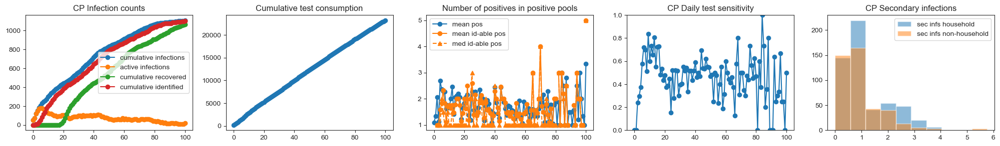

In [67]:
cp_plot = plot_results(cp_sim, "correlated")

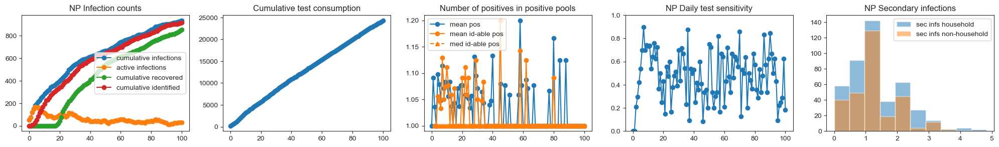

In [68]:
np_plot = plot_results(np_sim, "naive")

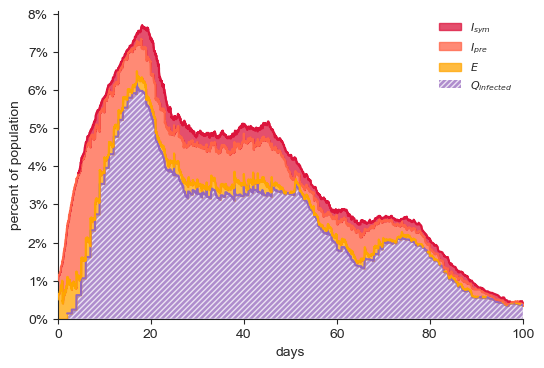

(<Figure size 600x400 with 1 Axes>,
 <Axes: xlabel='days', ylabel='percent of population'>)

In [57]:
cp_sim.model.figure_infections(figsize=(6,4))

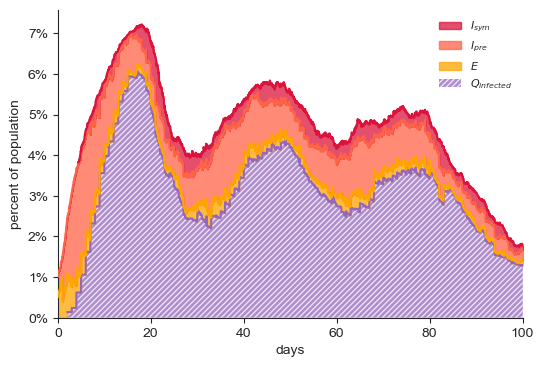

(<Figure size 600x400 with 1 Axes>,
 <Axes: xlabel='days', ylabel='percent of population'>)

In [58]:
np_sim.model.figure_infections(figsize=(6,4))

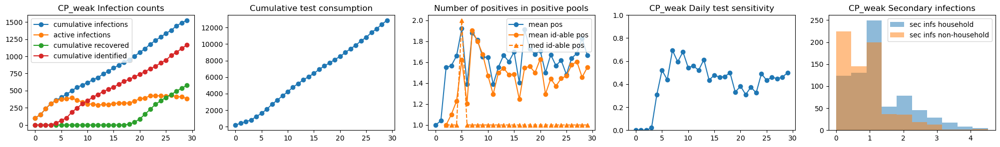

In [23]:
cp_weak_plot = plot_results(cp_weak_sim, "correlated_weak")

In [10]:
len(cp_sim.model.isolation_start_times)

5000

In [11]:
min(cp_sim.model.VL_over_time["time_points"], key=lambda x: abs(x-10))

10.012682234769045

In [37]:
cp_sim.model.VL_over_time["time_points"].index(9.992697613156514)

751

In [ ]:
cp_sim.model.VL_over_time["time_points"].index(
    min(
        cp_sim.model.VL_over_time["time_points"], 
        key=lambda x: abs(x-cp_sim.model.isolation_start_times[j])
        ))

In [34]:
values = [1,2,3,4,5]

In [36]:
values.__getitem__

<function list.__getitem__>

In [35]:
index_min = min(range(len(values)), key=values.__getitem__)
index_min

0

In [30]:
cp_sim.model.VL_over_time["VL_time_series"]

5000

In [12]:
cp_VL_at_isolation = []
np_VL_at_isolation = []
cp_isolation_time_variance = []
np_isolation_time_variance = []

i = 0
while i < len(list(cp_sim.model.households_dict.values())):
    household = list(cp_sim.model.households_dict.values())[i]
    cp_household_isolation_times = [np.round(cp_sim.model.isolation_start_times[j],2) for j in household]
    cp_household_VL_at_isolation = [
        np.round(cp_sim.model.VL_over_time["VL_time_series"][j][
            cp_sim.model.VL_over_time["time_points"].index(
                min(
                    cp_sim.model.VL_over_time["time_points"], 
                    key=lambda x: abs(x-cp_sim.model.isolation_start_times[j])
                )
            )], 2)
        for j in household
    ]
    cp_VL_at_isolation.extend(cp_household_VL_at_isolation)
    np_household_isolation_times = [np.round(np_sim.model.isolation_start_times[j],2) for j in household]
    np_household_VL_at_isolation = [
        np.round(np_sim.model.VL_over_time["VL_time_series"][j][
            np_sim.model.VL_over_time["time_points"].index(
                min(
                    np_sim.model.VL_over_time["time_points"], 
                    key=lambda x: abs(x-np_sim.model.isolation_start_times[j])
                )
            )], 2)
        for j in household
    ]
    np_VL_at_isolation.extend(np_household_VL_at_isolation)
    if any((cp_household_isolation_times[j]<100000) or (np_household_isolation_times[j]<100000) for j in range(len(household))):
        cp_isolation_time_variance.append(np.var(list(filter(lambda x: x<100000, cp_household_isolation_times))))
        np_isolation_time_variance.append(np.var(list(filter(lambda x: x<100000, np_household_isolation_times))))
        print(
            "household: ", household, 
            "\n    CP isolation time: ", cp_household_isolation_times, ", VL at isolation: ", cp_household_VL_at_isolation,
            "\n    NP isolation time: ", np_household_isolation_times, ", VL at isolation: ", np_household_VL_at_isolation,
        )
    i += len(household)

household:  [4983, 3783, 3782, 3781] 
    CP isolation time:  [5.01, 5.01, 5.01, 10.0] , VL at isolation:  [4.86, 4.45, 5.93, 5.58] 
    NP isolation time:  [5.01, 5.01, 5.01, 10.0] , VL at isolation:  [4.86, 4.45, 5.93, 5.58]
household:  [1169, 559, 3779] 
    CP isolation time:  [5.01, 5.01, 5.01] , VL at isolation:  [5.3, 5.92, 4.45] 
    NP isolation time:  [5.01, 5.01, 5.01] , VL at isolation:  [5.3, 5.92, 4.45]
household:  [3778] 
    CP isolation time:  [8.01] , VL at isolation:  [6.0] 
    NP isolation time:  [8.01] , VL at isolation:  [6.0]
household:  [4982, 3777, 3776] 
    CP isolation time:  [100000.0, 100000.0, 100000.0] , VL at isolation:  [-1.0, -1.0, -1.0] 
    NP isolation time:  [19.0, 19.0, 19.0] , VL at isolation:  [5.69, 5.59, 5.1]
household:  [4972, 3763, 3762, 3761] 
    CP isolation time:  [7.0, 7.0, 7.0, 2.0] , VL at isolation:  [5.81, 6.0, 6.0, 4.54] 
    NP isolation time:  [7.0, 7.0, 7.0, 2.0] , VL at isolation:  [5.81, 6.0, 6.0, 4.54]
household:  [3735] 
 

(array([995.,   0.,   0.,   1.,   0.,   0.,   0.,   1.,   0.,   1.]),
 array([  0. ,  22.5,  45. ,  67.5,  90. , 112.5, 135. , 157.5, 180. ,
        202.5, 225. ]),
 <BarContainer object of 10 artists>)

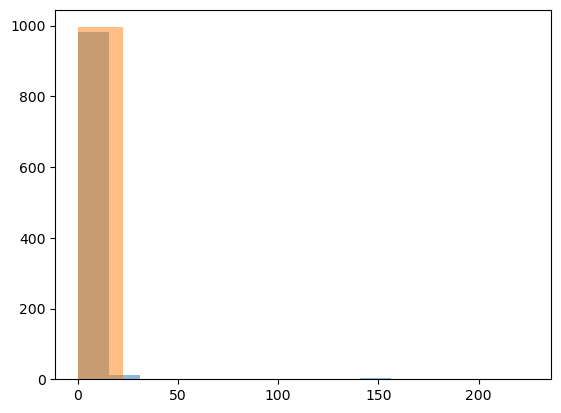

In [11]:
plt.hist(np.array(cp_isolation_time_variance)[~np.isnan(cp_isolation_time_variance)], alpha=0.5, label="CP")
plt.hist(np.array(np_isolation_time_variance)[~np.isnan(np_isolation_time_variance)], alpha=0.5, label="NP")

Text(0, 0.5, 'Density')

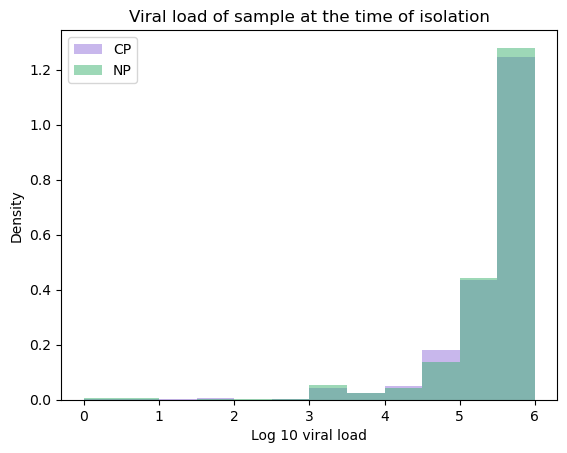

In [19]:
bins = np.linspace(0,6,13)
plt.hist(list(filter(lambda x: x>-1, cp_VL_at_isolation)), alpha=0.5, label="CP", density=True, bins=bins, color="mediumpurple")
plt.hist(list(filter(lambda x: x>-1, np_VL_at_isolation)), alpha=0.5, label="NP", density=True, bins=bins, color="mediumseagreen")
plt.legend()
plt.title("Viral load of sample at the time of isolation")
plt.xlabel("Log 10 viral load")
plt.ylabel("Density")

Generated overall age distribution:
0-9: 0.1176	(-0.0034 from target)
10-19: 0.1384	(0.0074 from target)
20-29: 0.1408	(0.0038 from target)
30-39: 0.1332	(0.0002 from target)
40-49: 0.1158	(-0.0082 from target)
50-59: 0.1288	(-0.0022 from target)
60-69: 0.1194	(0.0044 from target)
70-79: 0.0746	(0.0046 from target)
80+: 0.0314	(-0.0066 from target)

Generated household size distribution:
1: 0.2756	(-0.0081 from target)
2: 0.3536	(0.0084 from target)
3: 0.1400	(-0.0106 from target)
4: 0.1400	(0.0124 from target)
5: 0.0533	(-0.0045 from target)
6: 0.0261	(0.0035 from target)
7: 0.0113	(-0.0011 from target)
Num households: 2028
mean household size: 2.448393594

{'0-9': 588, '10-19': 692, '20-29': 704, '30-39': 666, '40-49': 579, '50-59': 644, '60-69': 597, '70-79': 373, '80+': 157}
Generating graph for 0-9...
Generating graph for 10-19...
Generating graph for 20-59...
Generating graph for 60+...


Generating walks (CPU: 1): 100%|██████████| 10/10 [00:11<00:00,  1.17s/it]


Running simulation with seed 1 for strategy correlated_weak...
Running screening for group 0 on day 0...


Generating walks (CPU: 1): 100%|██████████| 10/10 [00:01<00:00,  5.59it/s]


Viral loads in positive pools:  [[], [], [], [], [], [], [], []]
Screening day:  0  self.model.t:  0.01
Running screening for group 1 on day 1...


Generating walks (CPU: 1): 100%|██████████| 10/10 [00:01<00:00,  5.70it/s]


Viral loads in positive pools:  [[], [], [], [], [], [], [], []]
Screening day:  1  self.model.t:  1.0000000000000007
Running screening for group 2 on day 2...


Generating walks (CPU: 1): 100%|██████████| 10/10 [00:01<00:00,  5.14it/s]


Viral loads in positive pools:  [[], [], [], [], [], [], [], [], []]
Screening day:  2  self.model.t:  2.0000000000000013
    Nodes with transition propensities:
        node4717, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 4717 is transitioning EtoIPRE at time 2.210004320849983 with timer_state: [2.21000432]; 1/sigma: [2.20323809]; VL: 0.0
{'t': 2.210004320849983, 'transitionNode': 4717, 'transitionNodeVL': 6.0, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100000.0
    Nodes with transition propensities:
        node2928, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 2928 is transitioning EtoIPRE at time 2.2200101095720535 with timer_state: [2.22001011]; 1/sigma: [2.21315872]; VL: 5.991448250710673
{'t': 2.2200101095720535, 'transitionNode': 2928, 'transitionNodeVL': 6.0, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100000.05598888992
    Nodes with transition propensities:
        node4576, in state

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:01<00:00,  5.96it/s]


Viral loads in positive pools:  [[4.291745494445998], [3.8586989817046855], [6.0], [4.183914110016636], [4.286515202745176], [5.116022910622989], [3.925970117253612], [3.7104166226640016], [5.353677595157334, 3.7414572427639823], [5.206000110549301], [4.686007154146534], [5.756203040675063]]
Screening day:  3  self.model.t:  3.0085998308729143
    Nodes with transition propensities:
        node4743, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 4743 is transitioning EtoIPRE at time 3.0286001872175836 with timer_state: [3.02860019]; 1/sigma: [3.02257179]; VL: 5.952414106501058
{'t': 3.0286001872175836, 'transitionNode': 4743, 'transitionNodeVL': 6.0, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 100011.75365465393
    Nodes with transition propensities:
        node1644, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 1644 is transitioning EtoIPRE at time 3.068603814132835 with timer_state: [3.06860381]; 1/sigma: [3.06424846]; VL: 5.930

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:01<00:00,  5.99it/s]


Viral loads in positive pools:  [[5.123234686840719], [5.362484566087693], [0.1112123853729745, 6.0], [6.0], [2.1233156546423384, 0.9938520131420965], [6.0], [6.0, 2.0283035097228796], [1.6730774078193247, 1.3049616900901544], [0.4878261212062797, 0.5165721590620724, 6.0], [0.7693566100000154, 6.0], [0.19559357202642136], [6.0, 0.35075161121165727], [4.581328027120122, 4.708677505881059], [4.899193329780308]]
Screening day:  4  self.model.t:  4.001078072585032
    Nodes with transition propensities:
        node4959, in state [1], propensity [('StoE', 2.380952380952381)]
infected: 4959, transmissionTerms_I: [10.], transmissionTerms_Q: [0], household_neighbors: {3776, 3777}, non_household_neighbors: [3951]
Household member states: [array([2]), array([3])]
Non-household member states: [array([1])]
Infected node 4959 got contribution from infectious contacts {3777: 1.0} and quarantined contacts {}
{'t': 4.0129337874787305, 'transitionNode': 4959, 'transitionNodeVL': 0.0, 'transitionType':

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:01<00:00,  5.60it/s]


Viral loads in positive pools:  [[5.409403954410664], [3.2878604732080476], [2.212379798389749], [1.015669399867731], [6.0], [1.758890560821036], [2.6130625128928506], [6.0], [2.6982216711433646], [2.836093231815667, 0.5736366755083266], [6.0], [6.0], [0.6309094215571253], [1.3473170638351022], [2.145466569403655, 6.0, 0.29456015210449227], [2.5008403616586556], [2.950990803387375, 6.0], [5.961647373864712]]
Screening day:  5  self.model.t:  5.006777072948046
    Nodes with transition propensities:
        node1574, in state [1], propensity [('StoE', 1.0869565217391304)]
infected: 1574, transmissionTerms_I: [10.], transmissionTerms_Q: [0], household_neighbors: {76, 1573}, non_household_neighbors: [1856, 1793, 2629, 2054, 2183, 2887, 1545, 1353, 1362, 1555, 1620, 1623, 1368, 1820, 1638, 1511, 1323, 2489, 1389, 1790, 1519, 2545, 1970, 1587, 1977, 2366]
Household member states: [array([1]), array([3])]
Non-household member states: [array([1]), array([1]), array([1]), array([1]), array([1]

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:01<00:00,  5.70it/s]


Viral loads in positive pools:  [[5.358229172005893, 3.564082779449324], [2.1103681542353527], [2.1928240935249703, 5.6525067449381385, 2.917244555026072], [4.7024200577060915], [5.619363311601962], [4.964394222401985, 5.738026993365026, 3.0679762549754406, 3.488380256640476, 5.777419631770253], [3.010445298591141, 2.929548360535337], [2.010541756198479, 1.4260533875037569], [1.7450513786287944, 1.414259138128071, 6.0], [0.2658162315898468], [5.512308644813117], [4.405383202683728, 3.338255027263016], [5.98528720099336], [4.413139132442233]]
Screening day:  6  self.model.t:  6.00230991887696
    Nodes with transition propensities:
        node1997, in state [13], propensity [('QPREtoQSYM', 100000.0)]
-- node 1997 is transitioning QPREtoQSYM at time 6.012312879176544 with timer_state: [2.45439339]; 1/lamda: [2.44993153]; VL: 6.0
{'t': 6.012312879176544, 'transitionNode': 1997, 'transitionNodeVL': 5.997185085963309, 'transitionType': 'QPREtoQSYM'}
propensity: 100000.0, sum of all propens

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:01<00:00,  5.11it/s]


Viral loads in positive pools:  [[5.723518132021851], [3.680208421007354], [0.7946518811095126], [2.1931329915108058], [5.227695414236112], [3.2038597761969942], [0.06799940244741466], [4.185982609356915, 5.622083599532629, 5.404929955018599], [6.0], [0.5454860034092391], [4.1680454273613226], [0.6678442962786573], [3.2673015429575902], [5.809693336228084], [4.097608398559949, 2.6134782900282496, 5.435605884152861], [5.805411130511636], [5.047186704144848], [3.186811770900903], [3.989867986777091], [5.12249730565448, 5.082597832257411], [6.0]]
Screening day:  7  self.model.t:  7.002926153890872
    Nodes with transition propensities:
        node1371, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 1371 is transitioning EtoIPRE at time 7.032930203969083 with timer_state: [2.89460593]; 1/sigma: [2.89427718]; VL: 5.917750868802061
{'t': 7.032930203969083, 'transitionNode': 1371, 'transitionNodeVL': 6.0, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:01<00:00,  5.92it/s]


Viral loads in positive pools:  [[5.733186808735368], [5.773897254241344], [3.474491978237155], [0.024900982996563223], [6.0], [5.659062638723637, 3.9376585221489124], [4.749983237505781], [4.211826122576004], [3.86313556970985], [2.8662566975267874], [3.49695654089843, 5.365019783646735, 5.8209922241494, 6.0], [5.349065957741839, 5.827102732603556, 5.650048034223382, 5.425120748667419], [5.581025980178928, 4.48277639726528], [6.0], [4.702120372958957, 4.930751205929338], [5.065866037178035], [5.995579411027833], [5.92580543203047], [5.120780904732091, 3.234875721573356, 5.563264181496198], [1.0108159569545434, 6.0, 3.2633943292168865], [1.1710799008534247], [5.334256981371335, 4.0278490437211705], [6.0, 3.7760447648528843], [5.2338241750943695], [6.0]]
Screening day:  8  self.model.t:  8.005834727503538
    Nodes with transition propensities:
        node1835, in state [3], propensity [('IPREtoISYM', 100000.0)]
-- node 1835 is transitioning IPREtoISYM at time 8.015839499672675 with ti

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:01<00:00,  6.07it/s]


Viral loads in positive pools:  [[4.576555778351852, 4.702645136242375], [5.806024415093815], [4.982826308034659, 6.0], [5.235277405110887, 6.0], [5.645429414216357], [4.998424555856742, 6.0, 6.0], [5.70762764670554, 4.411977060593266], [4.637444062142043], [5.849183928501913, 6.0], [5.355273360420215], [6.0, 5.668250525048052], [6.0, 5.278650529909349], [6.0], [3.331856593035056], [6.0, 6.0], [6.0, 0.18654800725432003, 1.4695947377261611], [5.152013160154472], [4.876684816989414, 5.921347813306993]]
Screening day:  9  self.model.t:  9.00509354190576
    Nodes with transition propensities:
        node1364, in state [3], propensity [('IPREtoISYM', 100000.0)]
-- node 1364 is transitioning IPREtoISYM at time 9.01509779916308 with timer_state: [2.30224014]; 1/lamda: [2.29571232]; VL: 6.0
{'t': 9.01509779916308, 'transitionNode': 1364, 'transitionNodeVL': 5.9967237851585296, 'transitionType': 'IPREtoISYM'}
propensity: 100000.0, sum of all propensities: 100015.94781372666
    Nodes with tra

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:01<00:00,  5.72it/s]


Viral loads in positive pools:  [[6.0, 6.0], [1.200152245963912], [0.8209550780594366, 0.7645308873133682], [1.4126123777650221, 6.0], [3.757143873283107], [2.320800327643694], [6.0, 5.053803143965876, 3.6993232499674344], [5.735587219365033, 6.0, 3.9990478679304458, 5.182939818984191, 5.7591323512177], [5.585942643503452, 4.584274680374401], [1.8633339712694146, 2.6925992372976117, 0.37175996021164626], [5.427133731870439], [5.929708088421306, 5.455099376933745, 6.0], [5.904336883657817], [0.2936658099918108, 4.789088348000918, 0.02405186059982654], [5.67554696097305], [0.5257872989409722], [6.0, 2.0983503206990686]]
Screening day:  10  self.model.t:  10.00247593762701
    Nodes with transition propensities:
        node115, in state [1], propensity [('StoE', 1.282051282051282)]
infected: 115, transmissionTerms_I: [10.], transmissionTerms_Q: [0], household_neighbors: {114, 4069, 1743}, non_household_neighbors: [35, 102, 77, 53, 120, 26, 27, 317, 127]
Household member states: [array([1

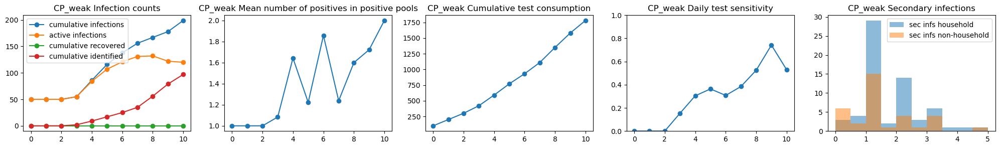

In [18]:
cpw_sim, cpw_fig = run_and_plot(
    N,
    "US",
    WEIGHT,
    ALPHA,
    INIT_PREV,
    T=T,
    pooling_strategy='correlated_weak',
    NUM_SCREENING_GROUPS=NUM_SCREENING_GROUPS,
    POOL_SIZE=POOL_SIZE,
    COMMUNITY_SIZE=COMMUNITY_SIZE,
    LoD=LoD,
    peak_VL=PEAK_VL,
    seed=SEED,
)

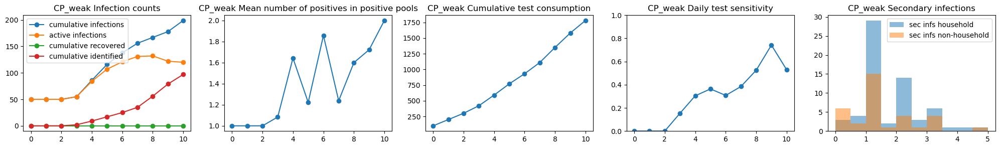

In [19]:
cpw_fig

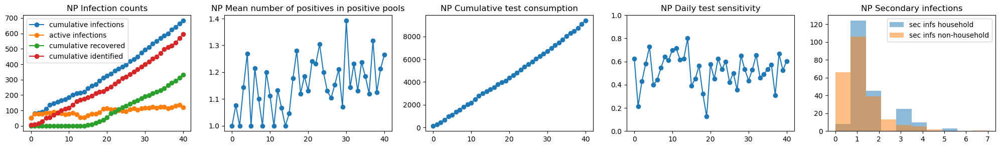

In [9]:
np_fig

Generated overall age distribution:
0-9: 0.1145	(-0.0065 from target)
10-19: 0.1285	(-0.0025 from target)
20-29: 0.1380	(0.0010 from target)
30-39: 0.1465	(0.0135 from target)
40-49: 0.1090	(-0.0150 from target)
50-59: 0.1340	(0.0030 from target)
60-69: 0.1110	(-0.0040 from target)
70-79: 0.0720	(0.0020 from target)
80+: 0.0465	(0.0085 from target)

Generated household size distribution:
1: 0.3035	(0.0198 from target)
2: 0.3378	(-0.0073 from target)
3: 0.1236	(-0.0271 from target)
4: 0.1310	(0.0033 from target)
5: 0.0624	(0.0046 from target)
6: 0.0294	(0.0068 from target)
7: 0.0122	(-0.0002 from target)
Num households: 817
mean household size: 2.448393594

{'0-9': 229, '10-19': 257, '20-29': 276, '30-39': 293, '40-49': 218, '50-59': 268, '60-69': 222, '70-79': 144, '80+': 93}
Generating graph for 0-9...
Generating graph for 10-19...
Generating graph for 20-59...
Generating graph for 60+...


Generating walks (CPU: 1): 100%|██████████| 10/10 [00:04<00:00,  2.06it/s]


Running simulation with seed 0 for strategy naive...
Running screening for group 0 on day 0...
Viral loads in positive pools:  [[-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 0.0]]
Screening day:  0  self.model.t:  0.01
Running screening for group 1 on day 1...
Viral loads in positive pools:  [[-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 0.0, -1.0, -1.0], [-1.0, 0.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0], [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 0.0, -1.0], [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 0.0]]
Screening day:  1  self.model.t:  1.0000000000000007
Running screening for group 2 on day 2...
Viral loads in positive pools:  [[-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 0.0], [-1.0, 0.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0], [0.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0], [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 0.0, -1.0, -1.0], [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 0.0, -1.0], [-1.0, -1.0, -1.0, -

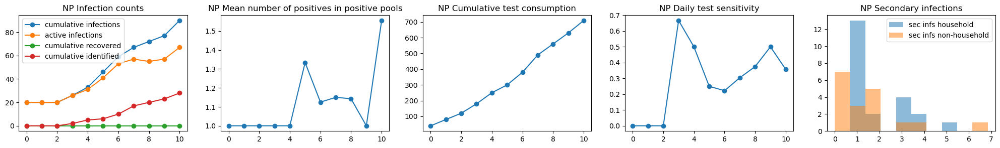

In [20]:
importlib.reload(seirsplus)

np_sim, np_fig = run_and_plot(
    N,
    "US",
    WEIGHT,
    ALPHA,
    INIT_PREV,
    T=10,
    pooling_strategy='naive',
    NUM_SCREENING_GROUPS=NUM_SCREENING_GROUPS,
    POOL_SIZE=POOL_SIZE,
    LoD=LoD,
    seed=SEED,
)

(array([ 4.,  2.,  2.,  2., 54., 12., 13.,  9., 10., 16.]),
 array([0.33259514, 0.89933563, 1.46607611, 2.0328166 , 2.59955708,
        3.16629757, 3.73303806, 4.29977854, 4.86651903, 5.43325951,
        6.        ]),
 <BarContainer object of 10 artists>)

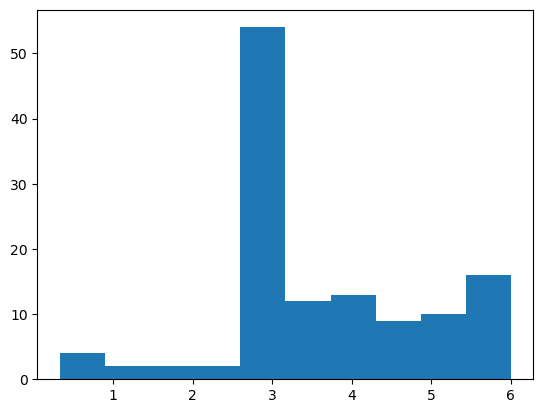

In [15]:
plt.hist([v for v in cp_sim.model.current_VL if v > 0])

In [16]:
min([0,1,2,3])

0

In [25]:
max(max(np_sim.model.sec_infs_household.values()), max(np_sim.model.sec_infs_non_household.values()))

11.976809068203297

In [30]:
sum(sim_correlated.model.degree - sim_correlated.model.degree_Q)

array([0.])

In [59]:
node=545
sim_correlated.model.transmissionTerms_Q[node], sim_correlated.model.transmissionTerms_I[node]

(array([0.]), array([40.]))

In [92]:
# np.where(not np.equal(sim_correlated.model.transmissionTerms_Q, sim_correlated.model.transmissionTerms_I))

res = [(i, (x[0],y[0])) for i, (x, y) in enumerate(zip(sim_correlated.model.transmissionTerms_Q, sim_correlated.model.transmissionTerms_I)) if x != y]
res


[(126, (0.0, 0.1)),
 (128, (0.0, 0.1)),
 (129, (0.0, 0.1)),
 (130, (0.0, 0.1)),
 (131, (0.0, 0.1)),
 (132, (0.1, 0.0)),
 (133, (0.0, 0.1)),
 (135, (0.0, 0.1)),
 (138, (0.1, 0.0)),
 (139, (0.0, 0.1)),
 (145, (0.0, 0.1)),
 (150, (0.0, 0.1)),
 (151, (0.0, 0.1)),
 (152, (0.0, 10.0)),
 (153, (0.0, 0.1)),
 (155, (0.2, 0.0)),
 (161, (0.0, 0.1)),
 (166, (0.0, 0.1)),
 (167, (0.0, 0.1)),
 (168, (0.0, 0.1)),
 (170, (0.0, 0.1)),
 (173, (0.0, 0.1)),
 (176, (0.0, 0.1)),
 (178, (0.0, 0.1)),
 (179, (0.0, 0.1)),
 (182, (0.0, 0.1)),
 (184, (0.0, 0.1)),
 (185, (0.0, 0.1)),
 (188, (0.0, 0.1)),
 (195, (10.0, 0.1)),
 (205, (0.0, 0.1)),
 (207, (0.0, 0.1)),
 (209, (0.0, 0.1)),
 (211, (0.0, 0.1)),
 (214, (0.2, 0.1)),
 (215, (0.0, 0.1)),
 (217, (0.0, 0.1)),
 (220, (0.0, 0.1)),
 (221, (0.0, 0.1)),
 (226, (0.0, 0.1)),
 (227, (0.0, 0.1)),
 (232, (0.0, 0.1)),
 (233, (0.0, 0.1)),
 (241, (0.0, 0.1)),
 (250, (0.0, 0.1)),
 (261, (0.0, 0.1)),
 (263, (0.0, 0.1)),
 (264, (0.0, 0.1)),
 (267, (0.0, 0.1)),
 (270, (0.0, 0.1))

In [60]:
sim_correlated.model.infectionsLog

[{'t': 1.288447906784009,
  'infected_node': 927,
  'infection_type': 'StoE',
  'infected_node_degree': array([54.]),
  'household_members': [927, 926, 925, 547, 546, 545],
  'household_members_states': array([2, 3, 1, 1, 1, 1])},
 {'t': 1.3289722093335052,
  'infected_node': 545,
  'infection_type': 'StoE',
  'infected_node_degree': array([56.]),
  'household_members': [927, 926, 925, 547, 546, 545],
  'household_members_states': array([2, 3, 1, 1, 1, 2])},
 {'t': 1.6479340654636487,
  'infected_node': 546,
  'infection_type': 'StoE',
  'infected_node_degree': array([57.]),
  'household_members': [927, 926, 925, 547, 546, 545],
  'household_members_states': array([2, 3, 1, 1, 2, 2])},
 {'t': 1.8334123874999255,
  'infected_node': 925,
  'infection_type': 'StoE',
  'infected_node_degree': array([52.]),
  'household_members': [927, 926, 925, 547, 546, 545],
  'household_members_states': array([2, 3, 2, 1, 2, 2])},
 {'t': 3.408402162224979,
  'infected_node': 547,
  'infection_type': 'St

In [54]:
sum(sim_correlated.model.beta_local - sim_correlated.model.beta_Q_local)

array([0.])

In [32]:
sim_correlated.model.sec_infs_non_household

defaultdict(int,
            {840: 2.0,
             926: 1.0,
             776: 1.2,
             830: 1.2,
             831: 0.20990099009900992,
             789: 0.2,
             828: 0.2})

In [33]:
sim_correlated.model.sec_infs_household

defaultdict(int,
            {926: 5.0,
             840: 1.0,
             887: 2.0,
             830: 3.0,
             789: 2.99009900990099,
             863: 1.0})

In [110]:
len(sim_correlated.model.infectionsLog)

6

In [120]:
sum(sim_correlated.model.sec_infs_non_household.values()) + sum(sim_correlated.model.sec_infs_household.values())

143.00000000000003

In [27]:
sim_correlated.model.households_dict[927]

{545, 546, 547, 925, 926}

In [28]:
set(list(sim_correlated.model.G._adj[927].keys())) - set(sim_correlated.model.households_dict[927])

{778, 801, 808, 809}

Text(0.5, 1.0, '# susceptible neighbors')

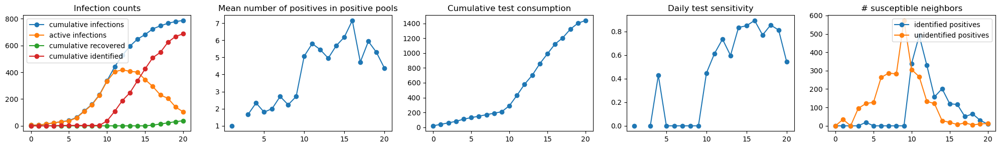

In [23]:
fig, axs = plt.subplots(1, 5, figsize=(25, 3))

sim = sim_correlated

axs[0].plot([sim.overall_results[i]["cumInfections"] for i in range(len(sim.overall_results))], "-o", label="cumulative infections")
axs[0].plot([sim.overall_results[i]["numActiveInfections"] for i in range(len(sim.overall_results))], "-o", label="active infections")
axs[0].plot([sim.overall_results[i]["cumRecovered"] for i in range(len(sim.overall_results))], "-o", label="cumulative recovered")
axs[0].plot([sim.overall_results[i]["cum_positives_identified"] for i in range(len(sim.overall_results))], "-o", label="cumulative identified")
axs[0].legend()
axs[0].set_title("Infection counts")

axs[1].plot([sim.overall_results[i]["mean_num_positives_in_positive_pool"] for i in range(len(sim.overall_results))], "-o", label="mean_num_positives_in_positive_pool")
axs[1].set_title("Mean number of positives in positive pools")

axs[2].plot([sim.overall_results[i]["cum_num_tests"] for i in range(len(sim.overall_results))], "-o", label="cum_num_tests")
axs[2].set_title("Cumulative test consumption")

axs[3].plot([sim.overall_results[i]["daily_sensitivity"] for i in range(len(sim.overall_results))], "-o", label="daily_sensitivity")
axs[3].set_title("Daily test sensitivity")

axs[4].plot([sim.overall_results[i]["num_susceptible_neighbors_of_identified_positives"] for i in range(len(sim.overall_results))], "-o", label="identified positives")
axs[4].plot([sim.overall_results[i]["num_susceptible_neighbors_of_unidentified_positives"] for i in range(len(sim.overall_results))], "-o", label="unidentified positives")
axs[4].legend()
axs[4].set_title("# susceptible neighbors")

In [ ]:
# get infection start times of members of infected households 

for household in households:
    if not all(sim_correlated.model.infection_start_times[node_id] == 1e5 for node_id in household["indices"]):
        print("Household: ", household['indices'])
        print([(node_id, sim_correlated.model.infection_start_times[node_id]) for node_id in household["indices"]])



In [ ]:
# can confirm that they are infected aroud the same time

## Naive pooling

In [24]:

random.seed(SEED)
np.random.seed(SEED)

from seirsplus.networks import generate_demographic_contact_network, household_country_data

demographic_graphs, individual_ageGroups, households = generate_demographic_contact_network(
                                                            N=N, demographic_data=household_country_data('US'), 
                                                            distancing_scales=[0.7], isolation_groups=[])

G = demographic_graphs['baseline']

G_weighted = copy.deepcopy(G)

for e in G.edges():
    if "weight" not in G[e[0]][e[1]]:
        G[e[0]][e[1]]["weight"] = WEIGHT

for e in G_weighted.edges():
    if "weight" not in G_weighted[e[0]][e[1]]:
        G_weighted[e[0]][e[1]]["weight"] = 10**10


households_dict = {}
for household in households:
    for node_id in household["indices"]:
        households_dict[node_id] = household["indices"]
               
sim_naive = run_sim(
    G,
    G_weighted,
    households_dict,
    ALPHA,
    N,
    INIT_PREV,
    T=20,
    pooling_strategy='naive',
    NUM_SCREENING_GROUPS=NUM_SCREENING_GROUPS,
    POOL_SIZE=POOL_SIZE,
    LoD=LoD,
    seed=SEED,
)


Generated overall age distribution:
0-9: 0.1360	(0.0150 from target)
10-19: 0.1340	(0.0030 from target)
20-29: 0.1420	(0.0050 from target)
30-39: 0.1370	(0.0040 from target)
40-49: 0.1190	(-0.0050 from target)
50-59: 0.1390	(0.0080 from target)
60-69: 0.1000	(-0.0150 from target)
70-79: 0.0500	(-0.0200 from target)
80+: 0.0430	(0.0050 from target)

Generated household size distribution:
1: 0.3230	(0.0393 from target)
2: 0.3587	(0.0136 from target)
3: 0.1140	(-0.0367 from target)
4: 0.1045	(-0.0231 from target)
5: 0.0451	(-0.0126 from target)
6: 0.0333	(0.0106 from target)
7: 0.0214	(0.0089 from target)
Num households: 421
mean household size: 2.448393594

{'0-9': 136, '10-19': 134, '20-29': 142, '30-39': 137, '40-49': 119, '50-59': 139, '60-69': 100, '70-79': 50, '80+': 43}
Generating graph for 0-9...
Generating graph for 10-19...
Generating graph for 20-59...
Generating graph for 60+...


Generating walks (CPU: 1): 100%|██████████| 10/10 [00:02<00:00,  4.21it/s]


Running simulation with seed 2 for strategy naive...
Running screening for group 0 on day 0...
Viral loads in positive pools:  []
Screening day:  0  self.model.t:  0.01
Running screening for group 1 on day 1...
Viral loads in positive pools:  []
Screening day:  1  self.model.t:  1.0000000000000007
    Nodes with transition propensities:
        node61, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 61 is transitioning EtoIPRE at time 1.0000014764313119 with timer_state: [1.00000148]; 1/sigma: [1.]; VL: 0.0
{'t': 1.0000014764313119, 'transitionNode': 61, 'transitionNodeVL': 4.0, 'transitionType': 'EtoIPRE'}
propensity: 100000.0, sum of all propensities: 500000.0
    Nodes with transition propensities:
        node311, in state [2], propensity [('EtoIPRE', 100000.0)]
-- node 311 is transitioning EtoIPRE at time 1.0000015211666329 with timer_state: [1.00000152]; 1/sigma: [1.]; VL: 4.0
{'t': 1.0000015211666329, 'transitionNode': 311, 'transitionNodeVL': 4.0, 'transitionType': 'Et

Text(0.5, 1.0, '# susceptible neighbors')

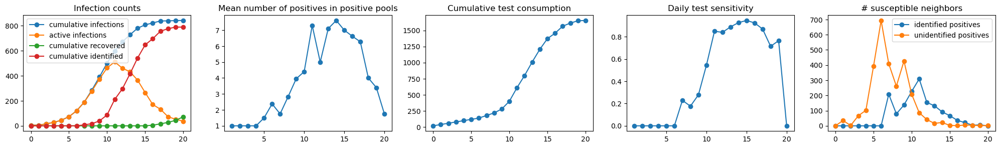

In [25]:
fig, axs = plt.subplots(1, 5, figsize=(25, 3))

sim = sim_naive

axs[0].plot([sim.overall_results[i]["cumInfections"] for i in range(len(sim.overall_results))], "-o", label="cumulative infections")
axs[0].plot([sim.overall_results[i]["numActiveInfections"] for i in range(len(sim.overall_results))], "-o", label="active infections")
axs[0].plot([sim.overall_results[i]["cumRecovered"] for i in range(len(sim.overall_results))], "-o", label="cumulative recovered")
axs[0].plot([sim.overall_results[i]["cum_positives_identified"] for i in range(len(sim.overall_results))], "-o", label="cumulative identified")
axs[0].legend()
axs[0].set_title("Infection counts")

axs[1].plot([sim.overall_results[i]["mean_num_positives_in_positive_pool"] for i in range(len(sim.overall_results))], "-o", label="mean_num_positives_in_positive_pool")
axs[1].set_title("Mean number of positives in positive pools")

axs[2].plot([sim.overall_results[i]["cum_num_tests"] for i in range(len(sim.overall_results))], "-o", label="cum_num_tests")
axs[2].set_title("Cumulative test consumption")

axs[3].plot([sim.overall_results[i]["daily_sensitivity"] for i in range(len(sim.overall_results))], "-o", label="daily_sensitivity")
axs[3].set_title("Daily test sensitivity")

axs[4].plot([sim.overall_results[i]["num_susceptible_neighbors_of_identified_positives"] for i in range(len(sim.overall_results))], "-o", label="identified positives")
axs[4].plot([sim.overall_results[i]["num_susceptible_neighbors_of_unidentified_positives"] for i in range(len(sim.overall_results))], "-o", label="unidentified positives")
axs[4].legend()
axs[4].set_title("# susceptible neighbors")